In [168]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from sklearn.model_selection import train_test_split, KFold
from scipy.stats import zscore
import ppscore as pps
from sklearn.svm import SVC
from sklearn import metrics
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.linear_model import LinearRegression
from sklearn import metrics
# importing all nescessary packages

In [169]:
data = pd.read_csv('vehicle-1.csv')
data.shape
# the dataset has 849 rows with 19 columns

(846, 19)

In [170]:
data.head()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
0,95,48.0,83.0,178.0,72.0,10,162.0,42.0,20.0,159,176.0,379.0,184.0,70.0,6.0,16.0,187.0,197,van
1,91,41.0,84.0,141.0,57.0,9,149.0,45.0,19.0,143,170.0,330.0,158.0,72.0,9.0,14.0,189.0,199,van
2,104,50.0,106.0,209.0,66.0,10,207.0,32.0,23.0,158,223.0,635.0,220.0,73.0,14.0,9.0,188.0,196,car
3,93,41.0,82.0,159.0,63.0,9,144.0,46.0,19.0,143,160.0,309.0,127.0,63.0,6.0,10.0,199.0,207,van
4,85,44.0,70.0,205.0,103.0,52,149.0,45.0,19.0,144,241.0,325.0,188.0,127.0,9.0,11.0,180.0,183,bus


In [171]:
data.info()
# From below it is clear that not all the values are non-null values

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 846 entries, 0 to 845
Data columns (total 19 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   compactness                  846 non-null    int64  
 1   circularity                  841 non-null    float64
 2   distance_circularity         842 non-null    float64
 3   radius_ratio                 840 non-null    float64
 4   pr.axis_aspect_ratio         844 non-null    float64
 5   max.length_aspect_ratio      846 non-null    int64  
 6   scatter_ratio                845 non-null    float64
 7   elongatedness                845 non-null    float64
 8   pr.axis_rectangularity       843 non-null    float64
 9   max.length_rectangularity    846 non-null    int64  
 10  scaled_variance              843 non-null    float64
 11  scaled_variance.1            844 non-null    float64
 12  scaled_radius_of_gyration    844 non-null    float64
 13  scaled_radius_of_gyr

In [172]:
c = ['Data Type']
pd.DataFrame(data.dtypes,columns=c)

# All the independent variables are either float or or integer type

,Data Type
compactness,int64
circularity,float64
distance_circularity,float64
radius_ratio,float64
pr.axis_aspect_ratio,float64
max.length_aspect_ratio,int64
scatter_ratio,float64
elongatedness,float64
pr.axis_rectangularity,float64
max.length_rectangularity,int64


D:\Apps\bandi\lib\site-packages\numpy\lib\histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
D:\Apps\bandi\lib\site-packages\numpy\lib\histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)


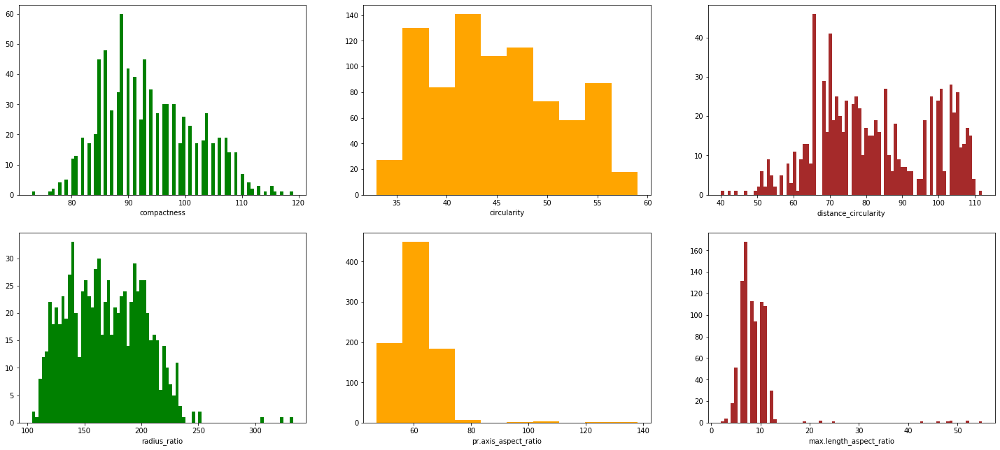

In [173]:
plt.figure(figsize=(25,35))

plt.subplot(6,3,1)
plt.hist(data['compactness'],color='green',bins=80)
plt.xlabel('compactness')

plt.subplot(6,3,2)
plt.hist(data['circularity'],color='orange')
plt.xlabel('circularity')

plt.subplot(6,3,3)
plt.hist(data['distance_circularity'],color='brown',bins=80)
plt.xlabel('distance_circularity')

plt.subplot(6,3,4)
plt.hist(data['radius_ratio'],color='green',bins=80)
plt.xlabel('radius_ratio')

plt.subplot(6,3,5)
plt.hist(data['pr.axis_aspect_ratio'],color='orange')
plt.xlabel('pr.axis_aspect_ratio')

plt.subplot(6,3,6)
plt.hist(data['max.length_aspect_ratio'],color='brown',bins=80)
plt.xlabel('max.length_aspect_ratio')

plt.show()

# compactness, circularity,distance_circularity, radius ratio are all normally distributed

# pr.axis_aspect_ratio & max.length_aspect_ratio are all heavily right skewed

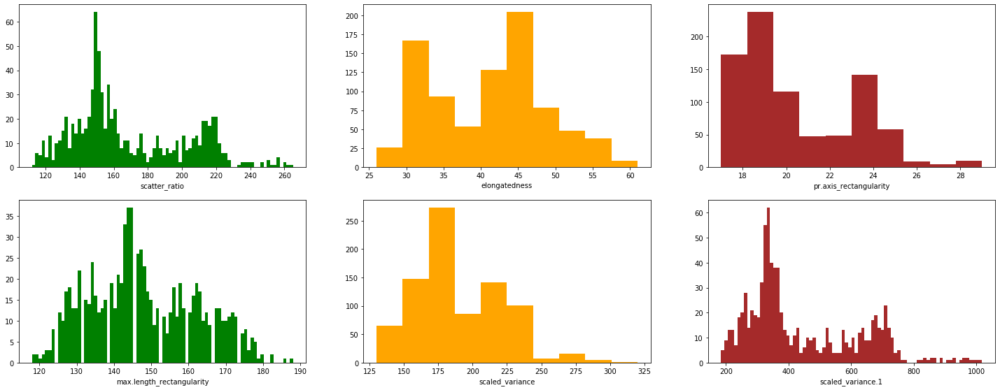

In [174]:
plt.figure(figsize=(25,30))

plt.subplot(6,3,1)
plt.hist(data['scatter_ratio'],color='green',bins=80)
plt.xlabel('scatter_ratio')

plt.subplot(6,3,2)
plt.hist(data['elongatedness'],color='orange')
plt.xlabel('elongatedness')

plt.subplot(6,3,3)
plt.hist(data['pr.axis_rectangularity'],color='brown')
plt.xlabel('pr.axis_rectangularity')

plt.subplot(6,3,4)
plt.hist(data['max.length_rectangularity'],color='green',bins=80)
plt.xlabel('max.length_rectangularity')

plt.subplot(6,3,5)
plt.hist(data['scaled_variance'],color='orange')
plt.xlabel('scaled_variance')

plt.subplot(6,3,6)
plt.hist(data['scaled_variance.1'],color='brown',bins=80)
plt.xlabel('scaled_variance.1')

plt.show()

# Scatter_Ratio, elongatedness, pr.axis_rectangularity, max.length_rectangularity, scaled_ariance & scaled_variance.1 all seem to be somewhat normally distributed

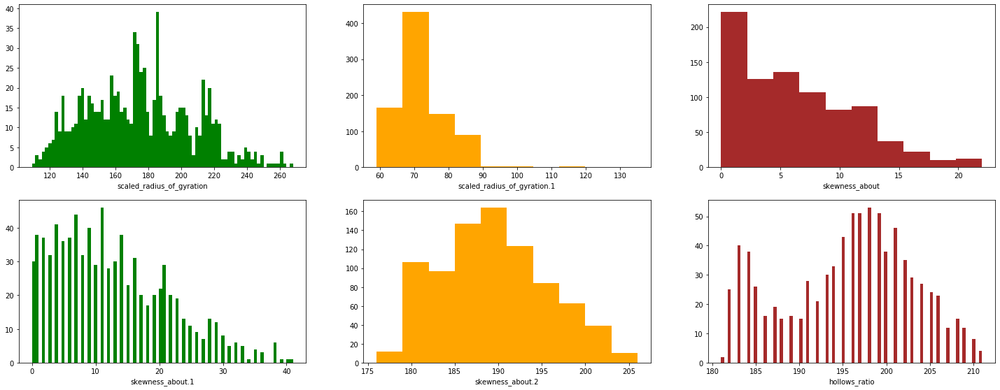

In [175]:
plt.figure(figsize=(25,30))

plt.subplot(6,3,1)
plt.hist(data['scaled_radius_of_gyration'],color='green',bins=80)
plt.xlabel('scaled_radius_of_gyration')

plt.subplot(6,3,2)
plt.hist(data['scaled_radius_of_gyration.1'],color='orange')
plt.xlabel('scaled_radius_of_gyration.1')

plt.subplot(6,3,3)
plt.hist(data['skewness_about'],color='brown')
plt.xlabel('skewness_about')

plt.subplot(6,3,4)
plt.hist(data['skewness_about.1'],color='green',bins=80)
plt.xlabel('skewness_about.1')

plt.subplot(6,3,5)
plt.hist(data['skewness_about.2'],color='orange')
plt.xlabel('skewness_about.2')

plt.subplot(6,3,6)
plt.hist(data['hollows_ratio'],color='brown',bins=80)
plt.xlabel('hollows_ratio')

plt.show()

# Except for scaled_radius_of_gyration.1 and skewness_about, everything is normally distrubuted.

# scaled_radius_of_gyration.1 is heavily skewed to the right

In [176]:
c = ['Skewness']
pd.DataFrame(data.skew(),columns=c)

,Skewness
compactness,0.381271
circularity,0.261809
distance_circularity,0.106585
radius_ratio,0.394978
pr.axis_aspect_ratio,3.830362
max.length_aspect_ratio,6.778394
scatter_ratio,0.607271
elongatedness,0.047847
pr.axis_rectangularity,0.770889
max.length_rectangularity,0.256359


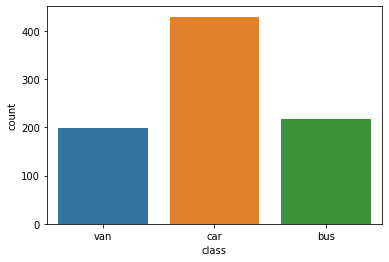

In [177]:
sns.countplot(x='class',data=data)
# "Technically" the data amaong the bus,van and the car is equally present (the two car types are combined into one)
# Since both the car types are combined into one, car category has the majority values, causing imbalance

# This might have affect on the final model, let us see about it further down the lane

In [178]:
data['class'].value_counts()
print("The percentage of data for the \"Car type\" is {0:.2f} %".format((len(data[data['class']=='car'])/len(data['class'])*100)))
print("The percentage of data for the \"Van type\" is {0:.2f} %".format((len(data[data['class']=='van'])/len(data['class'])*100)))
print("The percentage of data for the \"Bus type\" is {0:.2f} %".format((len(data[data['class']=='bus'])/len(data['class'])*100)))

# clearly car is the majority type

The percentage of data for the "Car type" is 50.71 %
The percentage of data for the "Van type" is 23.52 %
The percentage of data for the "Bus type" is 25.77 %


In [179]:
data.describe()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio
count,846.000000,841.000000,842.000000,840.000000,844.000000,846.000000,845.000000,845.000000,843.000000,846.000000,843.000000,844.000000,844.000000,842.000000,840.000000,845.000000,845.000000,846.000000
mean,93.678487,44.828775,82.110451,168.888095,61.678910,8.567376,168.901775,40.933728,20.582444,147.998818,188.631079,439.494076,174.709716,72.447743,6.364286,12.602367,188.919527,195.632388
std,8.234474,6.152172,15.778292,33.520198,7.891463,4.601217,33.214848,7.816186,2.592933,14.515652,31.411004,176.666903,32.584808,7.486190,4.920649,8.936081,6.155809,7.438797
min,73.000000,33.000000,40.000000,104.000000,47.000000,2.000000,112.000000,26.000000,17.000000,118.000000,130.000000,184.000000,109.000000,59.000000,0.000000,0.000000,176.000000,181.000000
25%,87.000000,40.000000,70.000000,141.000000,57.000000,7.000000,147.000000,33.000000,19.000000,137.000000,167.000000,318.000000,149.000000,67.000000,2.000000,5.000000,184.000000,190.250000
50%,93.000000,44.000000,80.000000,167.000000,61.000000,8.000000,157.000000,43.000000,20.000000,146.000000,179.000000,363.500000,173.500000,71.500000,6.000000,11.000000,188.000000,197.000000
75%,100.000000,49.000000,98.000000,195.000000,65.000000,10.000000,198.000000,46.000000,23.000000,159.000000,217.000000,587.000000,198.000000,75.000000,9.000000,19.000000,193.000000,201.000000
max,119.000000,59.000000,112.000000,333.000000,138.000000,55.000000,265.000000,61.000000,29.000000,188.000000,320.000000,1018.000000,268.000000,135.000000,22.000000,41.000000,206.000000,211.000000


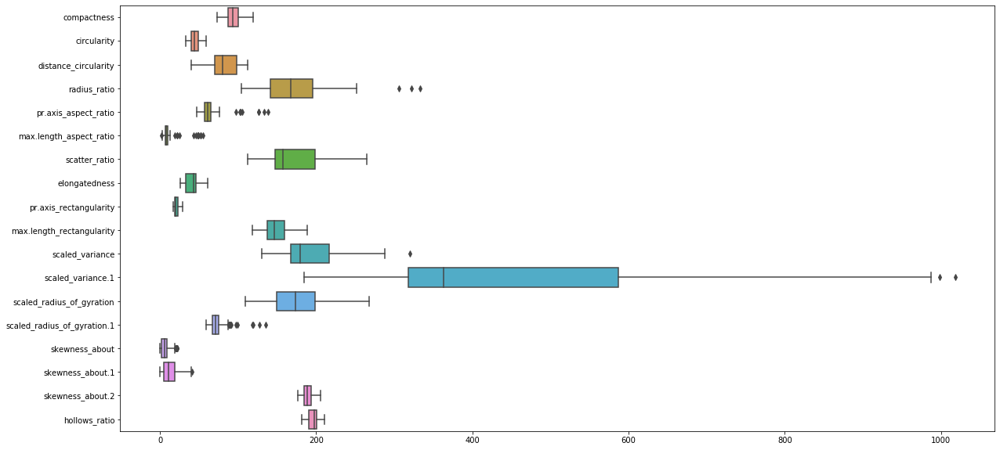

In [180]:
plt.figure(figsize=(20,10))
sns.boxplot(data=data,orient="h")
plt.show()

# pr.axis_aspect_ratio, max.length_aspect_ratio, scaled_radius_of_gyration.1, skewness_about, skewness_about.1 all have outliers
# These outliers may have effect on the final predictions

In [181]:
data.corr()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio
compactness,1.000000,0.689786,0.791707,0.691081,0.091779,0.148249,0.812770,-0.788736,0.814248,0.676143,0.764361,0.818674,0.585845,-0.250603,0.236685,0.157670,0.298528,0.365552
circularity,0.689786,1.000000,0.797180,0.625051,0.154283,0.251407,0.858265,-0.827246,0.856603,0.965729,0.806791,0.850863,0.935950,0.053080,0.144968,-0.011869,-0.106339,0.045652
distance_circularity,0.791707,0.797180,1.000000,0.771748,0.158684,0.264621,0.907949,-0.913020,0.896273,0.775149,0.865710,0.890541,0.706950,-0.227001,0.114665,0.266049,0.146027,0.333648
radius_ratio,0.691081,0.625051,0.771748,1.000000,0.665363,0.450486,0.738480,-0.792946,0.712744,0.571083,0.798294,0.725598,0.541325,-0.181520,0.049112,0.174469,0.382912,0.472339
pr.axis_aspect_ratio,0.091779,0.154283,0.158684,0.665363,1.000000,0.648861,0.103832,-0.183492,0.079566,0.127322,0.273738,0.089750,0.122454,0.152860,-0.058539,-0.032180,0.240201,0.267760
max.length_aspect_ratio,0.148249,0.251407,0.264621,0.450486,0.648861,1.000000,0.165998,-0.180053,0.161603,0.305943,0.319033,0.143745,0.189752,0.295638,0.015446,0.043491,-0.026184,0.143919
scatter_ratio,0.812770,0.858265,0.907949,0.738480,0.103832,0.165998,1.000000,-0.973504,0.992078,0.810017,0.951672,0.996328,0.800577,-0.028006,0.074376,0.213512,0.005171,0.118504
elongatedness,-0.788736,-0.827246,-0.913020,-0.792946,-0.183492,-0.180053,-0.973504,1.000000,-0.950405,-0.776150,-0.938313,-0.956488,-0.766671,0.103535,-0.052243,-0.186027,-0.114846,-0.216769
pr.axis_rectangularity,0.814248,0.856603,0.896273,0.712744,0.079566,0.161603,0.992078,-0.950405,1.000000,0.813135,0.938182,0.992316,0.798522,-0.015711,0.083219,0.215200,-0.019066,0.099481
max.length_rectangularity,0.676143,0.965729,0.775149,0.571083,0.127322,0.305943,0.810017,-0.776150,0.813135,1.000000,0.746657,0.797485,0.866554,0.041283,0.136077,0.001660,-0.104437,0.076770


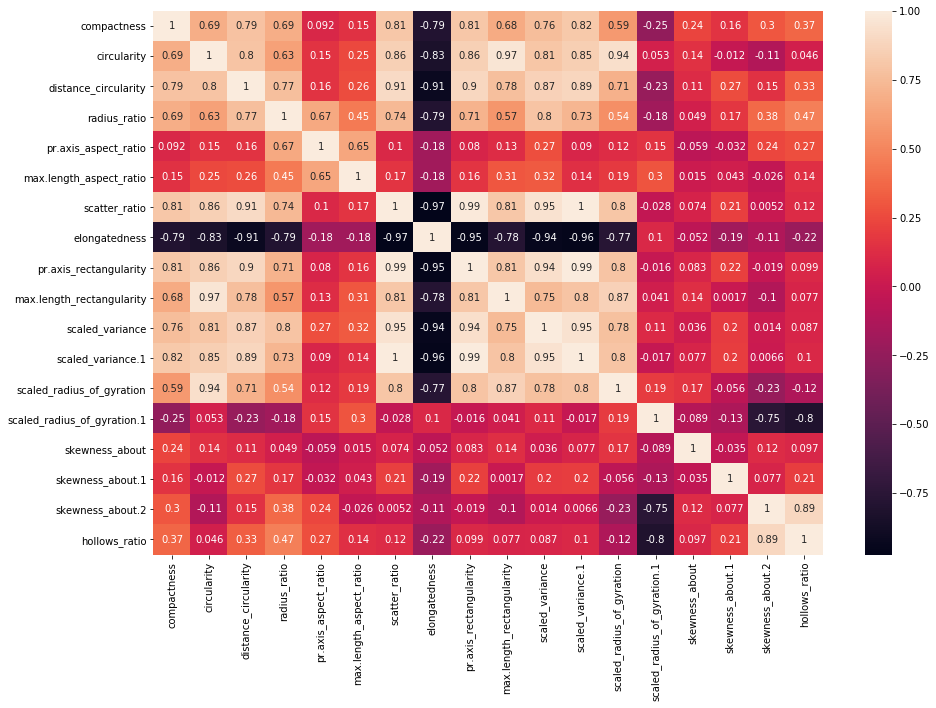

In [182]:
plt.figure(figsize=(15,10))
sns.heatmap(data.corr(),annot=True)
plt.show()

# from the below heatmap it is evident that there are many independent variables, that highly correlate with each-other

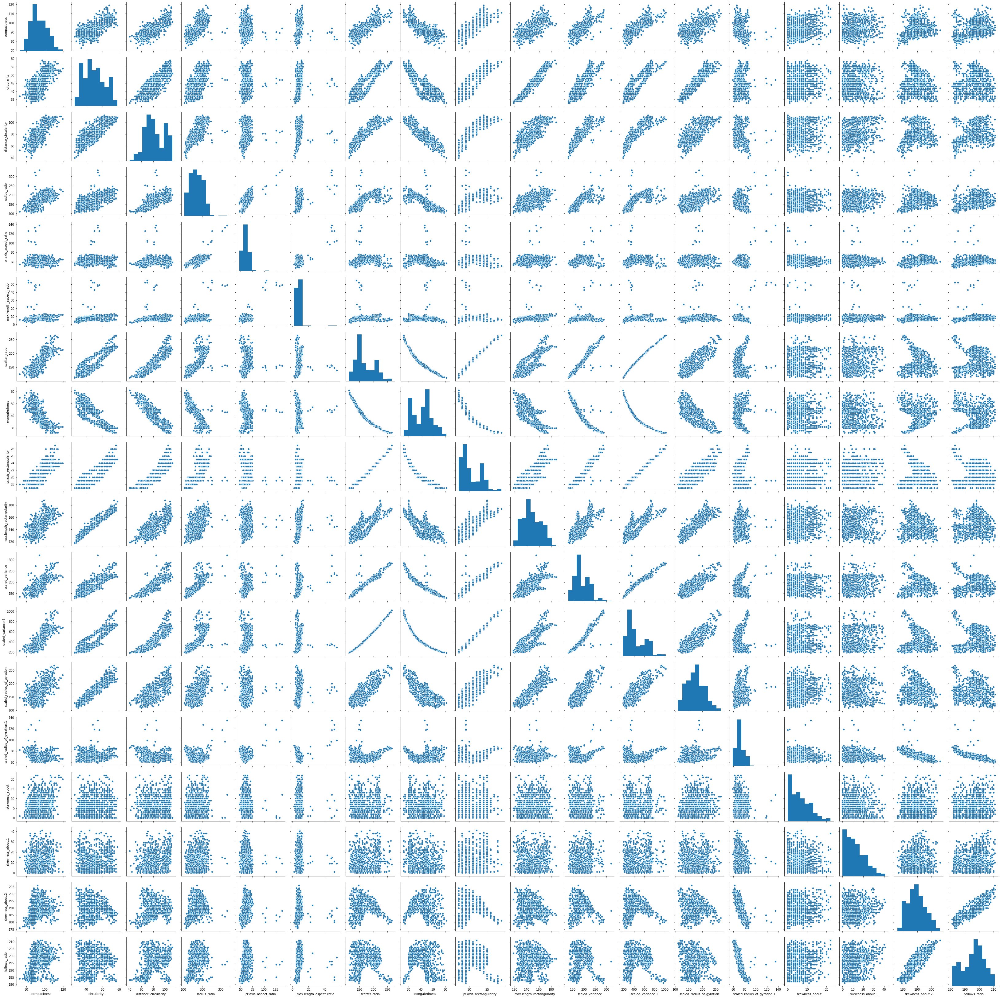

In [183]:
sns.pairplot(data)
plt.show()
# From the below pairplot, there are many variables that are linearly correlated.
# Some are strongly positively correlated, some are strongly negatively correlated
# Thus this will lead our dataset to have multicollinearity. 
# The best remedy for this is to remove them.

In [184]:
# Some of the highly correlated variable are :

# circularity - pr.axis_rectangularity - .855
# circularity - max.length_rectangularity - .96
# circularity - scaled_radius_of_gyration - .93
# circularity - scaled_variance.1 - .85
# distance_circularity - scatter_ratio - .90
# distance_circularity - elongatedness - -.91
# distance_circularity - pr.axis_rectangularity - .89
# distance_circularity - scaled_variance - .86
# distance_circularity - scaled_variance.1 - .89
# scatter_ratio - max.length_aspect_ratio - .99
# scatter_ratio - scaled_variance - .95
# scatter_ratio - scaled_variance.1 - .99
# scatter_ratio - elongatedness - -.97
# scatter_ratio - pr.axis_rectangularity - .99
# elongatedness - pr.axis_rectangularity - -.95
# elongatedness - scaled_variance - -.93
# elongatedness - scaled_variance.1 - -.95
# pr.axis_rectangularity - scaled_variance - .93
# pr.axis_rectangularity - scaled_variance.1 - .99
# max.length_rectangularity - scaled_radius_of_gyration - .86
# scaled_variance - scaled_variance.1 - .94
# skewness_about.2 - hollows_ratio - .89

# However, we can use this to our advantage by predicting the missing values of the variables using their other 
# highly correlated independent variable, rather than replacing the NaN values with mean, median or mode.

In [185]:
data.isna().sum()
# There a a 41 NaN values in the dataset.

# Since "each data" in the dataset represent the features extracted from the silhouttes of the vechicles at different angles,
# it is definitely not a good idea to replace the NaN values with mean,median, or mode. 
# Thus, we try to predict the missing values else drop the NaN values

compactness                    0
circularity                    5
distance_circularity           4
radius_ratio                   6
pr.axis_aspect_ratio           2
max.length_aspect_ratio        0
scatter_ratio                  1
elongatedness                  1
pr.axis_rectangularity         3
max.length_rectangularity      0
scaled_variance                3
scaled_variance.1              2
scaled_radius_of_gyration      2
scaled_radius_of_gyration.1    4
skewness_about                 6
skewness_about.1               1
skewness_about.2               1
hollows_ratio                  0
class                          0
dtype: int64

In [186]:
is_NaN = data.isnull()
row_has_NaN = is_NaN.any(axis=1)
rows_with_NaN = data[row_has_NaN]
data_na = pd.DataFrame(rows_with_NaN)
data_na

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
5,107,NaN,106.0,172.0,50.0,6,255.0,26.0,28.0,169,280.0,957.0,264.0,85.0,5.0,9.0,181.0,183,bus
9,93,44.0,98.0,NaN,62.0,11,183.0,36.0,22.0,146,202.0,505.0,152.0,64.0,4.0,14.0,195.0,204,car
19,101,56.0,100.0,215.0,NaN,10,208.0,32.0,24.0,169,227.0,651.0,223.0,74.0,6.0,5.0,186.0,193,car
35,100,46.0,NaN,172.0,67.0,9,157.0,43.0,20.0,150,170.0,363.0,184.0,67.0,17.0,7.0,192.0,200,van
66,81,43.0,68.0,125.0,57.0,8,149.0,46.0,19.0,146,169.0,323.0,172.0,NaN,NaN,18.0,179.0,184,bus
70,96,55.0,98.0,161.0,54.0,10,215.0,31.0,NaN,175,226.0,683.0,221.0,76.0,3.0,6.0,185.0,193,car
77,86,40.0,62.0,140.0,62.0,7,150.0,45.0,19.0,133,165.0,330.0,173.0,NaN,2.0,3.0,180.0,185,car
78,104,52.0,94.0,NaN,66.0,5,208.0,31.0,24.0,161,227.0,666.0,218.0,76.0,11.0,4.0,193.0,191,bus
105,108,NaN,103.0,202.0,64.0,10,220.0,30.0,25.0,168,NaN,711.0,214.0,73.0,11.0,NaN,188.0,199,car
118,85,NaN,NaN,128.0,56.0,8,150.0,46.0,19.0,144,168.0,324.0,173.0,82.0,9.0,14.0,180.0,184,bus


In [187]:
# predicting the 'circularity' missing values

a = data['circularity']
a = pd.DataFrame(a)
b = data['max.length_rectangularity']
b = pd.DataFrame(b)
c= data['scaled_radius_of_gyration']
c = pd.DataFrame(c)
lin = pd.concat([a,b,c],axis=1)
lin

,circularity,max.length_rectangularity,scaled_radius_of_gyration
0,48.0,159,184.0
1,41.0,143,158.0
2,50.0,158,220.0
3,41.0,143,127.0
4,44.0,144,188.0
...,...,...,...
841,39.0,134,149.0
842,46.0,159,176.0
843,54.0,173,200.0
844,36.0,124,148.0


In [188]:
lr = LinearRegression()
lin = lin.dropna()
X = lin.iloc[:,1:]
Y = lin.iloc[:,0]
X_train,X_test,y_train,y_test = train_test_split(X,Y,random_state=10,test_size=0.3)
lr.fit(X_train,y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [189]:
y_pred = lr.predict(X_test)
lr.score(X_test,y_test)
# has a preditcion level 0f 97%

0.9728999418805448

In [190]:
np.sqrt(metrics.mean_squared_error(y_test, y_pred))
# and a very low sqrt(MSE) score (close to zero)

0.987704114465291

In [191]:
y_test = y_test.reset_index()
y_test = y_test.drop(['index'],axis=1)

In [192]:
cols=['pred']
y_pred = pd.DataFrame(y_pred,columns=cols)
y_test = pd.DataFrame(y_test)
z = pd.concat([y_pred,y_test],axis=1)
z
# the value is pretty well predicted by the linear model. Hence, let us use this to replace the nan values in 'circularity'

,pred,circularity
0,38.215031,38.0
1,34.840018,35.0
2,44.166070,43.0
3,38.294105,39.0
4,47.002190,48.0
...,...,...
247,40.518464,41.0
248,53.654436,53.0
249,48.129972,47.0
250,47.328859,48.0


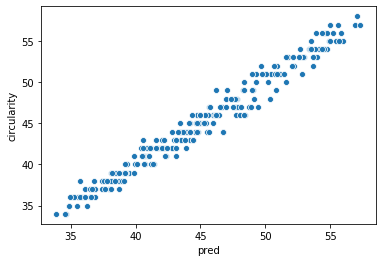

In [193]:
sns.scatterplot(x='pred',y='circularity',data=z)
# the below plot is serving as another proof the the prdicted variables are very close to the actual values
# hence this is a reliable model to predict "circularity"

In [194]:
# replacing the NaN values in circularity with the predicted values
a = data.iloc[5]
b = data.iloc[105]
c = data.iloc[118]
d = data.iloc[266]
e = data.iloc[396]
circ_na = pd.concat([a,b,c,d,e],axis=1).T
a = circ_na['max.length_rectangularity']
b = circ_na['scaled_radius_of_gyration']
pred_circularity = pd.concat([a,b],axis=1)
pred_circularity = pred_circularity.reset_index()
pred_circularity = pred_circularity.drop('index',axis=1)

In [195]:
pred_circularity

,max.length_rectangularity,scaled_radius_of_gyration
0,169,264
1,168,214
2,144,173
3,141,NaN
4,170,261


In [196]:
pred_circularity_two=pred_circularity.drop(pred_circularity.index[3])

# these are the predicted missing values of 'circularity'

In [197]:
circularity_pred_val = lr.predict(pred_circularity_two)
circularity_pred_val

array([57.10019063, 53.09054536, 43.67708681, 57.13972763])

In [198]:
# prediciting the 4th row using only max.length_rectangularity
X = lin.iloc[:,1:-1]
Y = lin.iloc[:,0]
X_train,X_test,y_train,y_test = train_test_split(X,Y,random_state=10,test_size=0.3)
lr.fit(X_train,y_train)
lr.score(X_test,y_test)

0.9297177523380571

In [199]:
cicrcularity_pred_one = lr.predict(np.array(pred_circularity['max.length_rectangularity']).reshape(-1,1))
cicrcularity_pred_one

array([53.37740373, 52.97060513, 43.20743874, 41.98704294, 53.78420233])

In [200]:
# replacing the NaN values of circularity with the predicted values
data['circularity'].iloc[5] = round(circularity_pred_val[0])
data['circularity'].iloc[105] = round(circularity_pred_val[1])
data['circularity'].iloc[118] = round(circularity_pred_val[2])
data['circularity'].iloc[266] = round(cicrcularity_pred_one[3])
data['circularity'].iloc[396] = round(circularity_pred_val[3])

D:\Apps\bandi\lib\site-packages\pandas\core\indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)


In [201]:
data.isna().sum()

compactness                    0
circularity                    0
distance_circularity           4
radius_ratio                   6
pr.axis_aspect_ratio           2
max.length_aspect_ratio        0
scatter_ratio                  1
elongatedness                  1
pr.axis_rectangularity         3
max.length_rectangularity      0
scaled_variance                3
scaled_variance.1              2
scaled_radius_of_gyration      2
scaled_radius_of_gyration.1    4
skewness_about                 6
skewness_about.1               1
skewness_about.2               1
hollows_ratio                  0
class                          0
dtype: int64

In [202]:
# predicting missing values in the scatter ratio

a = data['scatter_ratio']
b = data['max.length_aspect_ratio']
c = data['scaled_variance.1']
d = data['pr.axis_rectangularity']
e = data['elongatedness']
lin = pd.concat([a,b,c,d,e],axis=1)
lin = lin.dropna()
lin

,scatter_ratio,max.length_aspect_ratio,scaled_variance.1,pr.axis_rectangularity,elongatedness
0,162.0,10,379.0,20.0,42.0
1,149.0,9,330.0,19.0,45.0
2,207.0,10,635.0,23.0,32.0
3,144.0,9,309.0,19.0,46.0
4,149.0,52,325.0,19.0,45.0
...,...,...,...,...,...
841,169.0,8,422.0,20.0,40.0
842,159.0,11,368.0,20.0,43.0
843,222.0,12,721.0,25.0,30.0
844,135.0,7,270.0,18.0,50.0


In [203]:
X = lin.iloc[:,1:]
Y = lin.iloc[:,0]
X_train,X_test,y_train,y_test = train_test_split(X,Y,random_state=10,test_size=0.3)
lr.fit(X_train,y_train)
lr.score(X_test,y_test)

0.9979836342646546

In [204]:
y_pred = lr.predict(X_test)
np.sqrt(metrics.mean_squared_error(y_test, y_pred))

1.4584881588932175

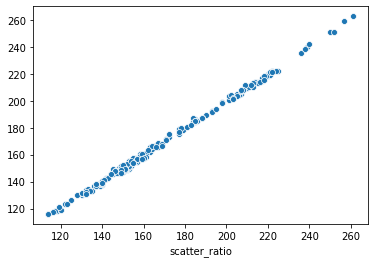

In [205]:
sns.scatterplot(y=y_pred,x=y_test)
# The value predicted are of very high precision

In [206]:
a = data.iloc[249]
scatter_ratio_na = pd.DataFrame(a).T
scatter_ratio_na

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
249,85,34,53,127,58,6,NaN,58,17,121,137,197,127,70,NaN,20,185,189,car


In [207]:
# Replacing the NaN values in scatter_ratio
b = scatter_ratio_na['max.length_aspect_ratio']
c = scatter_ratio_na['scaled_variance.1']
d = scatter_ratio_na['pr.axis_rectangularity']
e = scatter_ratio_na['elongatedness']
z = pd.concat([b,c,d,e],axis=1)
scatter_pred = lr.predict(z)
data.iloc[249]
data['scatter_ratio'].iloc[249] = round(scatter_pred[0])

D:\Apps\bandi\lib\site-packages\pandas\core\indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)


In [208]:
# Predicting for elongatedness

a =data['elongatedness']
b = data['scaled_variance']
c = data['scaled_variance.1']
d = data['pr.axis_rectangularity']
lin = pd.concat([a,b,c,d],axis=1)
lin = lin.dropna()
X = lin.iloc[:,1:]
Y = lin.iloc[:,0]
X_train,X_test,y_train,y_test = train_test_split(X,Y,random_state=10,test_size=0.3)
lr.fit(X_train,y_train)
lr.score(X_test,y_test)

0.920569039436212

In [209]:
y_pred = lr.predict(X_test)
np.sqrt(metrics.mean_squared_error(y_test, y_pred))

2.1893961130188786

In [210]:
z = pd.DataFrame(data.iloc[215]).T
b = z['scaled_variance']
c = z['scaled_variance.1']
d = z['pr.axis_rectangularity']
elongatedness_na = pd.concat([b,c,d],axis=1)
elongatedness_pred=lr.predict(elongatedness_na)
elongatedness_pred

array([42.20186333])

In [211]:
# Replacing the NaN value
data['elongatedness'].iloc[215] = round(elongatedness_pred[0])

D:\Apps\bandi\lib\site-packages\pandas\core\indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)


In [213]:
a = data['pr.axis_rectangularity']
c = data['scaled_variance.1']
d = data['elongatedness']
e = data['scatter_ratio']
lin = pd.concat([a,c,d,e],axis=1)
lin = lin.dropna()
X = lin.iloc[:,1:]
Y = lin.iloc[:,0]
X_train,X_test,y_train,y_test = train_test_split(X,Y,random_state=10,test_size=0.3)
lr.fit(X_train,y_train)
lr.score(X_test,y_test)

0.9886859451365562

In [214]:
y_pred = lr.predict(X_test)
np.sqrt(metrics.mean_squared_error(y_test, y_pred))

0.27598465077870954

In [215]:
# Predicting for the scaled_variance.1

a = data.iloc[70]
b = data.iloc[237]
c = data.iloc[273]
z = pd.concat([a,b,c],axis=1).T
c = z['scaled_variance.1']
d = z['elongatedness']
e = z['scatter_ratio']
pr_axis_rect_na = pd.concat([c,d,e],axis=1)
pr_axis_rect_na

,scaled_variance.1,elongatedness,scatter_ratio
70,683,31,215
237,332,45,151
273,316,46,146


In [216]:
pr_axis_rect_pred=lr.predict(pr_axis_rect_na)
data['pr.axis_rectangularity'].iloc[70]=round(pr_axis_rect_pred[0])
data['pr.axis_rectangularity'].iloc[237]=round(pr_axis_rect_pred[1])
data['pr.axis_rectangularity'].iloc[273]=round(pr_axis_rect_pred[2])

D:\Apps\bandi\lib\site-packages\pandas\core\indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)


In [217]:
a = data['scaled_variance.1']
b = data['scatter_ratio']
c = data['elongatedness']
d = data['pr.axis_rectangularity']
lin = pd.concat([a,b,d],axis=1)
lin = lin.dropna()
X = lin.iloc[:,1:]
Y = lin.iloc[:,0]
X_train,X_test,y_train,y_test = train_test_split(X,Y,random_state=10,test_size=0.3)
lr.fit(X_train,y_train)
lr.score(X_test,y_test)

0.9933146097870329

In [218]:
y_pred = lr.predict(X_test)
np.sqrt(metrics.mean_squared_error(y_test, y_pred))

14.993929889594234

In [219]:
#There is a huge difference between the actual & predicted values
# Therefore, this model is not a good predictor for scaledvariance.1

In [241]:
# All the other independent variables missing values are not predicted with high precision. 
# Therefore, it is better to drop the remaining missing values
# I have dropped the missing values instead of replacing them with mean or median because, since all the values in the dataset,
# represent the geometric features, it is best to drop them than to replace with mean or median

In [220]:
data = data.dropna()
data.isna().sum().sum()

0

In [221]:
z=data.copy()
# Making a copy of the data for safety.

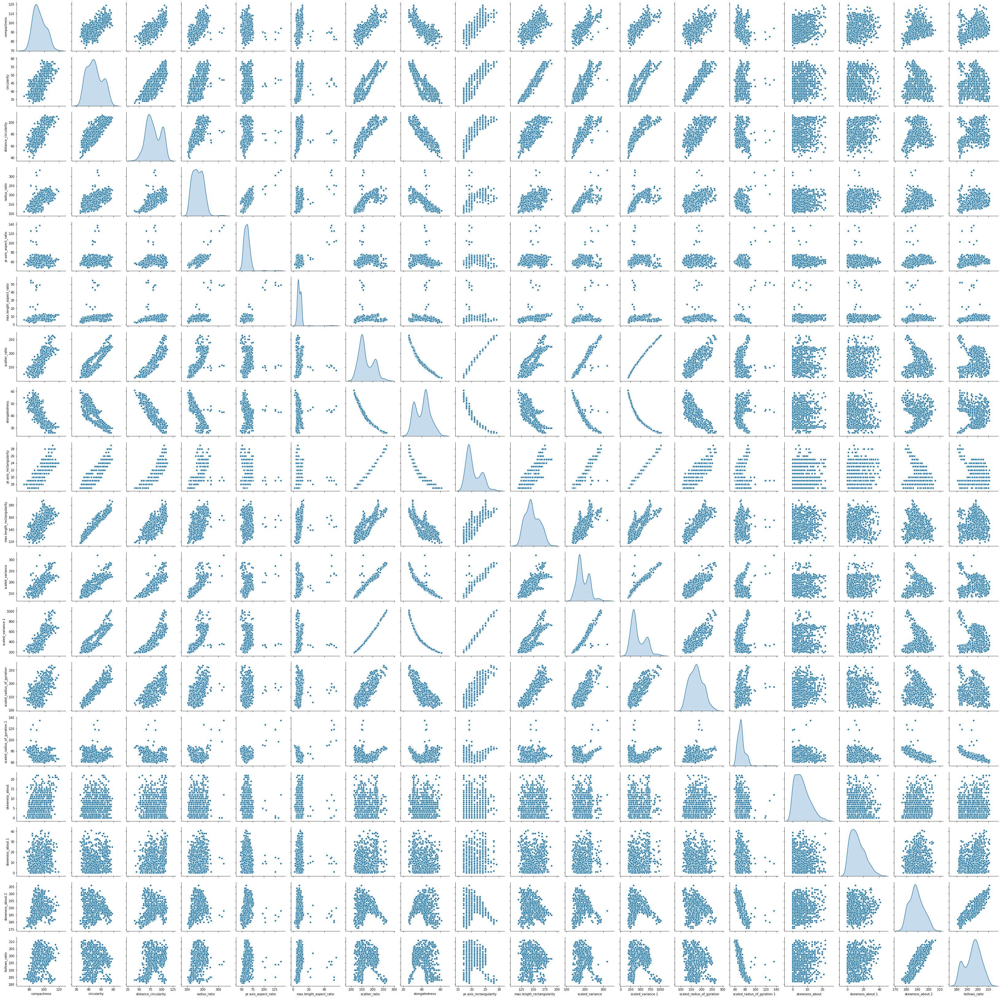

In [224]:
sns.pairplot(data,diag_kind='kde')

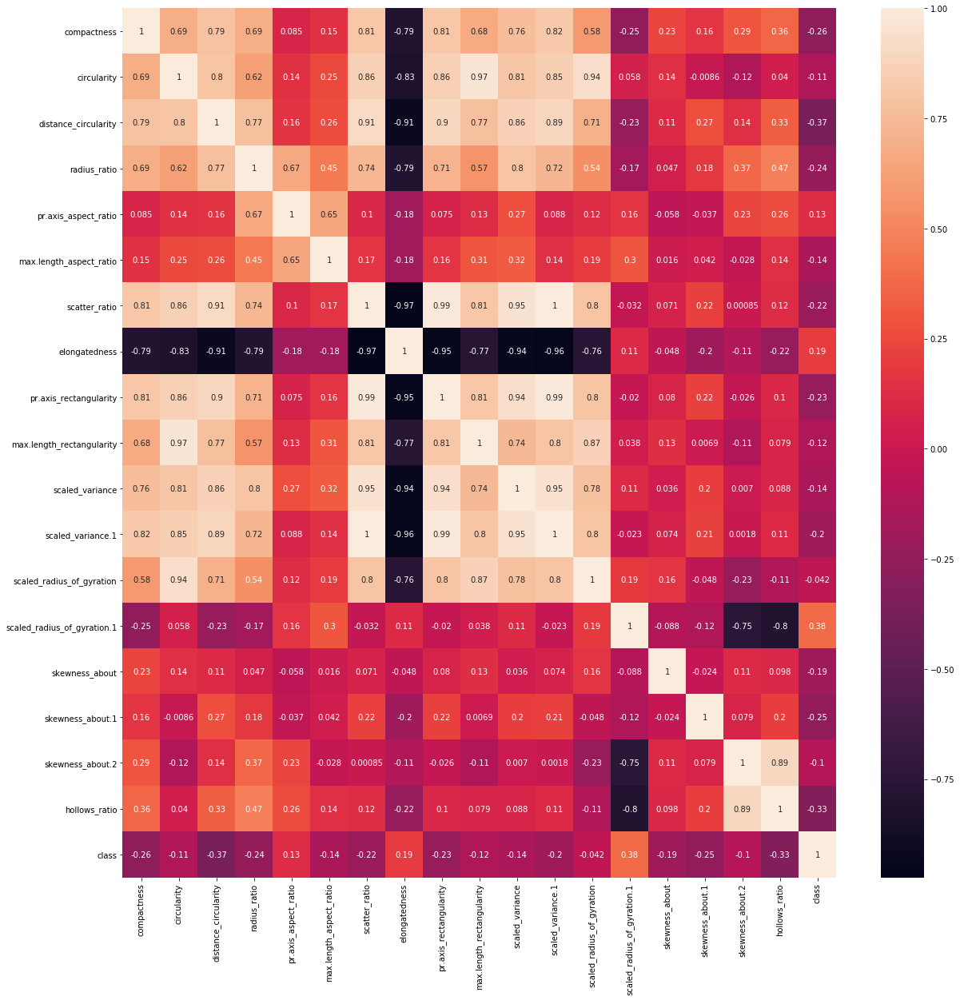

In [240]:
plt.figure(figsize=(20,20))
sns.heatmap(data.corr(),annot=True)
plt.show()

In [ ]:
# from the above pairplot and heatmap we can see that there are many linearly correlated values. 
# some are, 
# 1) circularity & max.length_rectangularity which has a .95 correlation
# 2) circularity & scaled_radius_of_gyration has a .93 correlation
# 3) scatter_ratio - max.length_aspect_ratio has a correlation of .99 (this is a very high predictive power)
# 4) scatter_ratio has high correlation of .95 & above with scaled_variance, scaled_variance.1, elongatedness, pr.axis_rectangularity
# 5) elongatedness has high coorealtion with pr.axis_rectangularity, scaled_variance, scaled_variance.1
# 6) pr.axis_rectangularity has high correlation with scaled_variance, scaled_variance.1, scaled_variance.1

# The highest correlated variables are 
# pr.axis_rectangularity - scaled_variance.1 = .99
# scatter_ratio - pr.axis_rectangularity = .99
# scatter_ratio - scaled_variance.1 = .99
# scatter_ratio - max.length_aspect_ratio = .99

In [226]:
# training the model without any changes to the dataset i.e., keeping all the independent variables

In [304]:
data['class']= data['class'].replace({'car':0,'van':1,'bus':2})

In [305]:
X = data.iloc[:,0:-1]
Y = data['class']
from sklearn.preprocessing import StandardScaler
ss = StandardScaler()
X = ss.fit_transform(X)
X_train,X_test,y_train,y_test = train_test_split(X,Y,random_state=10,test_size=0.3)
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(573, 18)
(246, 18)
(573,)
(246,)


In [296]:
# Performing the grid search to find the best parameters

param_grid = {'C': [0.1,0.5,0.75, 1,5, 10,20,30,50,75,100,200,300,350,400,500,1000],  
              'gamma': [1, 0.1, 0.01, 0.001, 0.0001,'auto','scale'], 
              'kernel': ['linear', 'poly', 'rbf', 'sigmoid']}  


In [297]:
grid = GridSearchCV(SVC(), param_grid, refit = True, verbose = 3) 
grid.fit(X_train,y_train)

Fitting 5 folds for each of 476 candidates, totalling 2380 fits
[CV] C=0.1, gamma=1, kernel=linear ...................................
[CV] ....... C=0.1, gamma=1, kernel=linear, score=0.896, total=   0.0s
[CV] C=0.1, gamma=1, kernel=linear ...................................
[CV] ....... C=0.1, gamma=1, kernel=linear, score=0.939, total=   0.0s
[CV] C=0.1, gamma=1, kernel=linear ...................................
[CV] ....... C=0.1, gamma=1, kernel=linear, score=0.904, total=   0.0s
[CV] C=0.1, gamma=1, kernel=linear ...................................
[CV] ....... C=0.1, gamma=1, kernel=linear, score=0.895, total=   0.0s
[CV] C=0.1, gamma=1, kernel=linear ...................................
[CV] ....... C=0.1, gamma=1, kernel=linear, score=0.904, total=   0.0s
[CV] C=0.1, gamma=1, kernel=poly .....................................
[CV] ......... C=0.1, gamma=1, kernel=poly, score=0.878, total=   0.0s
[CV] C=0.1, gamma=1, kernel=poly .....................................
[CV] ........

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s



[CV] C=0.1, gamma=1, kernel=rbf ......................................
[CV] .......... C=0.1, gamma=1, kernel=rbf, score=0.504, total=   0.0s
[CV] C=0.1, gamma=1, kernel=rbf ......................................
[CV] .......... C=0.1, gamma=1, kernel=rbf, score=0.504, total=   0.0s
[CV] C=0.1, gamma=1, kernel=rbf ......................................
[CV] .......... C=0.1, gamma=1, kernel=rbf, score=0.509, total=   0.0s
[CV] C=0.1, gamma=1, kernel=rbf ......................................
[CV] .......... C=0.1, gamma=1, kernel=rbf, score=0.500, total=   0.0s
[CV] C=0.1, gamma=1, kernel=sigmoid ..................................
[CV] ...... C=0.1, gamma=1, kernel=sigmoid, score=0.504, total=   0.0s
[CV] C=0.1, gamma=1, kernel=sigmoid ..................................
[CV] ...... C=0.1, gamma=1, kernel=sigmoid, score=0.565, total=   0.0s
[CV] C=0.1, gamma=1, kernel=sigmoid ..................................
[CV] ...... C=0.1, gamma=1, kernel=sigmoid, score=0.435, total=   0.0s
[CV] 

[CV] ...... C=0.1, gamma=0.001, kernel=rbf, score=0.509, total=   0.0s
[CV] C=0.1, gamma=0.001, kernel=rbf ..................................
[CV] ...... C=0.1, gamma=0.001, kernel=rbf, score=0.500, total=   0.0s
[CV] C=0.1, gamma=0.001, kernel=sigmoid ..............................
[CV] .. C=0.1, gamma=0.001, kernel=sigmoid, score=0.504, total=   0.0s
[CV] C=0.1, gamma=0.001, kernel=sigmoid ..............................
[CV] .. C=0.1, gamma=0.001, kernel=sigmoid, score=0.504, total=   0.0s
[CV] C=0.1, gamma=0.001, kernel=sigmoid ..............................
[CV] .. C=0.1, gamma=0.001, kernel=sigmoid, score=0.504, total=   0.0s
[CV] C=0.1, gamma=0.001, kernel=sigmoid ..............................
[CV] .. C=0.1, gamma=0.001, kernel=sigmoid, score=0.509, total=   0.0s
[CV] C=0.1, gamma=0.001, kernel=sigmoid ..............................
[CV] .. C=0.1, gamma=0.001, kernel=sigmoid, score=0.500, total=   0.0s
[CV] C=0.1, gamma=0.0001, kernel=linear ..............................
[CV] .

[CV] ...... C=0.1, gamma=scale, kernel=rbf, score=0.783, total=   0.0s
[CV] C=0.1, gamma=scale, kernel=rbf ..................................
[CV] ...... C=0.1, gamma=scale, kernel=rbf, score=0.843, total=   0.0s
[CV] C=0.1, gamma=scale, kernel=rbf ..................................
[CV] ...... C=0.1, gamma=scale, kernel=rbf, score=0.798, total=   0.0s
[CV] C=0.1, gamma=scale, kernel=rbf ..................................
[CV] ...... C=0.1, gamma=scale, kernel=rbf, score=0.781, total=   0.0s
[CV] C=0.1, gamma=scale, kernel=sigmoid ..............................
[CV] .. C=0.1, gamma=scale, kernel=sigmoid, score=0.722, total=   0.0s
[CV] C=0.1, gamma=scale, kernel=sigmoid ..............................
[CV] .. C=0.1, gamma=scale, kernel=sigmoid, score=0.652, total=   0.0s
[CV] C=0.1, gamma=scale, kernel=sigmoid ..............................
[CV] .. C=0.1, gamma=scale, kernel=sigmoid, score=0.652, total=   0.0s
[CV] C=0.1, gamma=scale, kernel=sigmoid ..............................
[CV] .

[CV] ...... C=0.5, gamma=0.01, kernel=poly, score=0.500, total=   0.0s
[CV] C=0.5, gamma=0.01, kernel=rbf ...................................
[CV] ....... C=0.5, gamma=0.01, kernel=rbf, score=0.896, total=   0.0s
[CV] C=0.5, gamma=0.01, kernel=rbf ...................................
[CV] ....... C=0.5, gamma=0.01, kernel=rbf, score=0.870, total=   0.0s
[CV] C=0.5, gamma=0.01, kernel=rbf ...................................
[CV] ....... C=0.5, gamma=0.01, kernel=rbf, score=0.896, total=   0.0s
[CV] C=0.5, gamma=0.01, kernel=rbf ...................................
[CV] ....... C=0.5, gamma=0.01, kernel=rbf, score=0.895, total=   0.0s
[CV] C=0.5, gamma=0.01, kernel=rbf ...................................
[CV] ....... C=0.5, gamma=0.01, kernel=rbf, score=0.895, total=   0.0s
[CV] C=0.5, gamma=0.01, kernel=sigmoid ...............................
[CV] ... C=0.5, gamma=0.01, kernel=sigmoid, score=0.722, total=   0.0s
[CV] C=0.5, gamma=0.01, kernel=sigmoid ...............................
[CV] .

[CV] ....... C=0.5, gamma=auto, kernel=rbf, score=0.913, total=   0.0s
[CV] C=0.5, gamma=auto, kernel=rbf ...................................
[CV] ....... C=0.5, gamma=auto, kernel=rbf, score=0.930, total=   0.0s
[CV] C=0.5, gamma=auto, kernel=rbf ...................................
[CV] ....... C=0.5, gamma=auto, kernel=rbf, score=0.965, total=   0.0s
[CV] C=0.5, gamma=auto, kernel=rbf ...................................
[CV] ....... C=0.5, gamma=auto, kernel=rbf, score=0.974, total=   0.0s
[CV] C=0.5, gamma=auto, kernel=rbf ...................................
[CV] ....... C=0.5, gamma=auto, kernel=rbf, score=0.921, total=   0.0s
[CV] C=0.5, gamma=auto, kernel=sigmoid ...............................
[CV] ... C=0.5, gamma=auto, kernel=sigmoid, score=0.739, total=   0.0s
[CV] C=0.5, gamma=auto, kernel=sigmoid ...............................
[CV] ... C=0.5, gamma=auto, kernel=sigmoid, score=0.783, total=   0.0s
[CV] C=0.5, gamma=auto, kernel=sigmoid ...............................
[CV] .

[CV] ... C=0.75, gamma=0.1, kernel=sigmoid, score=0.652, total=   0.0s
[CV] C=0.75, gamma=0.1, kernel=sigmoid ...............................
[CV] ... C=0.75, gamma=0.1, kernel=sigmoid, score=0.600, total=   0.0s
[CV] C=0.75, gamma=0.1, kernel=sigmoid ...............................
[CV] ... C=0.75, gamma=0.1, kernel=sigmoid, score=0.623, total=   0.0s
[CV] C=0.75, gamma=0.1, kernel=sigmoid ...............................
[CV] ... C=0.75, gamma=0.1, kernel=sigmoid, score=0.596, total=   0.0s
[CV] C=0.75, gamma=0.01, kernel=linear ...............................
[CV] ... C=0.75, gamma=0.01, kernel=linear, score=0.930, total=   0.0s
[CV] C=0.75, gamma=0.01, kernel=linear ...............................
[CV] ... C=0.75, gamma=0.01, kernel=linear, score=0.948, total=   0.0s
[CV] C=0.75, gamma=0.01, kernel=linear ...............................
[CV] ... C=0.75, gamma=0.01, kernel=linear, score=0.922, total=   0.0s
[CV] C=0.75, gamma=0.01, kernel=linear ...............................
[CV] .

[CV]  C=0.75, gamma=0.0001, kernel=sigmoid, score=0.504, total=   0.0s
[CV] C=0.75, gamma=0.0001, kernel=sigmoid ............................
[CV]  C=0.75, gamma=0.0001, kernel=sigmoid, score=0.509, total=   0.0s
[CV] C=0.75, gamma=0.0001, kernel=sigmoid ............................
[CV]  C=0.75, gamma=0.0001, kernel=sigmoid, score=0.500, total=   0.0s
[CV] C=0.75, gamma=auto, kernel=linear ...............................
[CV] ... C=0.75, gamma=auto, kernel=linear, score=0.930, total=   0.0s
[CV] C=0.75, gamma=auto, kernel=linear ...............................
[CV] ... C=0.75, gamma=auto, kernel=linear, score=0.948, total=   0.0s
[CV] C=0.75, gamma=auto, kernel=linear ...............................
[CV] ... C=0.75, gamma=auto, kernel=linear, score=0.922, total=   0.0s
[CV] C=0.75, gamma=auto, kernel=linear ...............................
[CV] ... C=0.75, gamma=auto, kernel=linear, score=0.956, total=   0.0s
[CV] C=0.75, gamma=auto, kernel=linear ...............................
[CV] .

[CV] ........ C=1, gamma=1, kernel=sigmoid, score=0.426, total=   0.0s
[CV] C=1, gamma=1, kernel=sigmoid ....................................
[CV] ........ C=1, gamma=1, kernel=sigmoid, score=0.482, total=   0.0s
[CV] C=1, gamma=1, kernel=sigmoid ....................................
[CV] ........ C=1, gamma=1, kernel=sigmoid, score=0.456, total=   0.0s
[CV] C=1, gamma=0.1, kernel=linear ...................................
[CV] ....... C=1, gamma=0.1, kernel=linear, score=0.930, total=   0.0s
[CV] C=1, gamma=0.1, kernel=linear ...................................
[CV] ....... C=1, gamma=0.1, kernel=linear, score=0.948, total=   0.0s
[CV] C=1, gamma=0.1, kernel=linear ...................................
[CV] ....... C=1, gamma=0.1, kernel=linear, score=0.930, total=   0.0s
[CV] C=1, gamma=0.1, kernel=linear ...................................
[CV] ....... C=1, gamma=0.1, kernel=linear, score=0.956, total=   0.0s
[CV] C=1, gamma=0.1, kernel=linear ...................................
[CV] .

[CV] .... C=1, gamma=0.0001, kernel=linear, score=0.930, total=   0.0s
[CV] C=1, gamma=0.0001, kernel=linear ................................
[CV] .... C=1, gamma=0.0001, kernel=linear, score=0.948, total=   0.0s
[CV] C=1, gamma=0.0001, kernel=linear ................................
[CV] .... C=1, gamma=0.0001, kernel=linear, score=0.930, total=   0.0s
[CV] C=1, gamma=0.0001, kernel=linear ................................
[CV] .... C=1, gamma=0.0001, kernel=linear, score=0.956, total=   0.0s
[CV] C=1, gamma=0.0001, kernel=linear ................................
[CV] .... C=1, gamma=0.0001, kernel=linear, score=0.939, total=   0.0s
[CV] C=1, gamma=0.0001, kernel=poly ..................................
[CV] ...... C=1, gamma=0.0001, kernel=poly, score=0.504, total=   0.0s
[CV] C=1, gamma=0.0001, kernel=poly ..................................
[CV] ...... C=1, gamma=0.0001, kernel=poly, score=0.504, total=   0.0s
[CV] C=1, gamma=0.0001, kernel=poly ..................................
[CV] .

[CV] ........... C=5, gamma=1, kernel=poly, score=0.922, total=   0.0s
[CV] C=5, gamma=1, kernel=poly .......................................
[CV] ........... C=5, gamma=1, kernel=poly, score=0.922, total=   0.0s
[CV] C=5, gamma=1, kernel=poly .......................................
[CV] ........... C=5, gamma=1, kernel=poly, score=0.921, total=   0.0s
[CV] C=5, gamma=1, kernel=poly .......................................
[CV] ........... C=5, gamma=1, kernel=poly, score=0.947, total=   0.0s
[CV] C=5, gamma=1, kernel=rbf ........................................
[CV] ............ C=5, gamma=1, kernel=rbf, score=0.757, total=   0.0s
[CV] C=5, gamma=1, kernel=rbf ........................................
[CV] ............ C=5, gamma=1, kernel=rbf, score=0.826, total=   0.0s
[CV] C=5, gamma=1, kernel=rbf ........................................
[CV] ............ C=5, gamma=1, kernel=rbf, score=0.826, total=   0.0s
[CV] C=5, gamma=1, kernel=rbf ........................................
[CV] .

[CV] ....... C=5, gamma=0.001, kernel=poly, score=0.509, total=   0.0s
[CV] C=5, gamma=0.001, kernel=poly ...................................
[CV] ....... C=5, gamma=0.001, kernel=poly, score=0.500, total=   0.0s
[CV] C=5, gamma=0.001, kernel=rbf ....................................
[CV] ........ C=5, gamma=0.001, kernel=rbf, score=0.835, total=   0.0s
[CV] C=5, gamma=0.001, kernel=rbf ....................................
[CV] ........ C=5, gamma=0.001, kernel=rbf, score=0.852, total=   0.0s
[CV] C=5, gamma=0.001, kernel=rbf ....................................
[CV] ........ C=5, gamma=0.001, kernel=rbf, score=0.887, total=   0.0s
[CV] C=5, gamma=0.001, kernel=rbf ....................................
[CV] ........ C=5, gamma=0.001, kernel=rbf, score=0.851, total=   0.0s
[CV] C=5, gamma=0.001, kernel=rbf ....................................
[CV] ........ C=5, gamma=0.001, kernel=rbf, score=0.912, total=   0.0s
[CV] C=5, gamma=0.001, kernel=sigmoid ................................
[CV] .

[CV] ........ C=5, gamma=scale, kernel=rbf, score=0.965, total=   0.0s
[CV] C=5, gamma=scale, kernel=sigmoid ................................
[CV] .... C=5, gamma=scale, kernel=sigmoid, score=0.557, total=   0.0s
[CV] C=5, gamma=scale, kernel=sigmoid ................................
[CV] .... C=5, gamma=scale, kernel=sigmoid, score=0.687, total=   0.0s
[CV] C=5, gamma=scale, kernel=sigmoid ................................
[CV] .... C=5, gamma=scale, kernel=sigmoid, score=0.591, total=   0.0s
[CV] C=5, gamma=scale, kernel=sigmoid ................................
[CV] .... C=5, gamma=scale, kernel=sigmoid, score=0.623, total=   0.0s
[CV] C=5, gamma=scale, kernel=sigmoid ................................
[CV] .... C=5, gamma=scale, kernel=sigmoid, score=0.623, total=   0.0s
[CV] C=10, gamma=1, kernel=linear ....................................
[CV] ........ C=10, gamma=1, kernel=linear, score=0.957, total=   0.0s
[CV] C=10, gamma=1, kernel=linear ....................................
[CV] .

[CV] .... C=10, gamma=0.01, kernel=sigmoid, score=0.896, total=   0.0s
[CV] C=10, gamma=0.01, kernel=sigmoid ................................
[CV] .... C=10, gamma=0.01, kernel=sigmoid, score=0.887, total=   0.0s
[CV] C=10, gamma=0.01, kernel=sigmoid ................................
[CV] .... C=10, gamma=0.01, kernel=sigmoid, score=0.860, total=   0.0s
[CV] C=10, gamma=0.01, kernel=sigmoid ................................
[CV] .... C=10, gamma=0.01, kernel=sigmoid, score=0.930, total=   0.0s
[CV] C=10, gamma=0.001, kernel=linear ................................
[CV] .... C=10, gamma=0.001, kernel=linear, score=0.957, total=   0.0s
[CV] C=10, gamma=0.001, kernel=linear ................................
[CV] .... C=10, gamma=0.001, kernel=linear, score=0.957, total=   0.0s
[CV] C=10, gamma=0.001, kernel=linear ................................
[CV] .... C=10, gamma=0.001, kernel=linear, score=0.939, total=   0.0s
[CV] C=10, gamma=0.001, kernel=linear ................................
[CV] .

[CV] .... C=10, gamma=scale, kernel=linear, score=0.957, total=   0.0s
[CV] C=10, gamma=scale, kernel=linear ................................
[CV] .... C=10, gamma=scale, kernel=linear, score=0.939, total=   0.0s
[CV] C=10, gamma=scale, kernel=linear ................................
[CV] .... C=10, gamma=scale, kernel=linear, score=0.965, total=   0.0s
[CV] C=10, gamma=scale, kernel=linear ................................
[CV] .... C=10, gamma=scale, kernel=linear, score=0.956, total=   0.0s
[CV] C=10, gamma=scale, kernel=poly ..................................
[CV] ...... C=10, gamma=scale, kernel=poly, score=0.913, total=   0.0s
[CV] C=10, gamma=scale, kernel=poly ..................................
[CV] ...... C=10, gamma=scale, kernel=poly, score=0.922, total=   0.0s
[CV] C=10, gamma=scale, kernel=poly ..................................
[CV] ...... C=10, gamma=scale, kernel=poly, score=0.948, total=   0.0s
[CV] C=10, gamma=scale, kernel=poly ..................................
[CV] .

[CV] ..... C=20, gamma=0.01, kernel=linear, score=0.922, total=   0.0s
[CV] C=20, gamma=0.01, kernel=linear .................................
[CV] ..... C=20, gamma=0.01, kernel=linear, score=0.957, total=   0.1s
[CV] C=20, gamma=0.01, kernel=linear .................................
[CV] ..... C=20, gamma=0.01, kernel=linear, score=0.922, total=   0.0s
[CV] C=20, gamma=0.01, kernel=linear .................................
[CV] ..... C=20, gamma=0.01, kernel=linear, score=0.974, total=   0.0s
[CV] C=20, gamma=0.01, kernel=linear .................................
[CV] ..... C=20, gamma=0.01, kernel=linear, score=0.956, total=   0.0s
[CV] C=20, gamma=0.01, kernel=poly ...................................
[CV] ....... C=20, gamma=0.01, kernel=poly, score=0.557, total=   0.0s
[CV] C=20, gamma=0.01, kernel=poly ...................................
[CV] ....... C=20, gamma=0.01, kernel=poly, score=0.565, total=   0.0s
[CV] C=20, gamma=0.01, kernel=poly ...................................
[CV] .

[CV] ..... C=20, gamma=auto, kernel=linear, score=0.974, total=   0.0s
[CV] C=20, gamma=auto, kernel=linear .................................
[CV] ..... C=20, gamma=auto, kernel=linear, score=0.956, total=   0.0s
[CV] C=20, gamma=auto, kernel=poly ...................................
[CV] ....... C=20, gamma=auto, kernel=poly, score=0.939, total=   0.0s
[CV] C=20, gamma=auto, kernel=poly ...................................
[CV] ....... C=20, gamma=auto, kernel=poly, score=0.948, total=   0.0s
[CV] C=20, gamma=auto, kernel=poly ...................................
[CV] ....... C=20, gamma=auto, kernel=poly, score=0.957, total=   0.0s
[CV] C=20, gamma=auto, kernel=poly ...................................
[CV] ....... C=20, gamma=auto, kernel=poly, score=0.947, total=   0.0s
[CV] C=20, gamma=auto, kernel=poly ...................................
[CV] ....... C=20, gamma=auto, kernel=poly, score=0.974, total=   0.0s
[CV] C=20, gamma=auto, kernel=rbf ....................................
[CV] .

[CV] C=30, gamma=0.1, kernel=linear ..................................
[CV] ...... C=30, gamma=0.1, kernel=linear, score=0.930, total=   0.0s
[CV] C=30, gamma=0.1, kernel=linear ..................................
[CV] ...... C=30, gamma=0.1, kernel=linear, score=0.982, total=   0.0s
[CV] C=30, gamma=0.1, kernel=linear ..................................
[CV] ...... C=30, gamma=0.1, kernel=linear, score=0.956, total=   0.1s
[CV] C=30, gamma=0.1, kernel=poly ....................................
[CV] ........ C=30, gamma=0.1, kernel=poly, score=0.896, total=   0.0s
[CV] C=30, gamma=0.1, kernel=poly ....................................
[CV] ........ C=30, gamma=0.1, kernel=poly, score=0.922, total=   0.0s
[CV] C=30, gamma=0.1, kernel=poly ....................................
[CV] ........ C=30, gamma=0.1, kernel=poly, score=0.930, total=   0.0s
[CV] C=30, gamma=0.1, kernel=poly ....................................
[CV] ........ C=30, gamma=0.1, kernel=poly, score=0.947, total=   0.0s
[CV] C

[CV] ... C=30, gamma=0.001, kernel=sigmoid, score=0.912, total=   0.0s
[CV] C=30, gamma=0.0001, kernel=linear ...............................
[CV] ... C=30, gamma=0.0001, kernel=linear, score=0.904, total=   0.0s
[CV] C=30, gamma=0.0001, kernel=linear ...............................
[CV] ... C=30, gamma=0.0001, kernel=linear, score=0.957, total=   0.0s
[CV] C=30, gamma=0.0001, kernel=linear ...............................
[CV] ... C=30, gamma=0.0001, kernel=linear, score=0.930, total=   0.0s
[CV] C=30, gamma=0.0001, kernel=linear ...............................
[CV] ... C=30, gamma=0.0001, kernel=linear, score=0.982, total=   0.0s
[CV] C=30, gamma=0.0001, kernel=linear ...............................
[CV] ... C=30, gamma=0.0001, kernel=linear, score=0.956, total=   0.1s
[CV] C=30, gamma=0.0001, kernel=poly .................................
[CV] ..... C=30, gamma=0.0001, kernel=poly, score=0.504, total=   0.0s
[CV] C=30, gamma=0.0001, kernel=poly .................................
[CV] .

[CV] ........ C=50, gamma=1, kernel=linear, score=0.904, total=   0.0s
[CV] C=50, gamma=1, kernel=linear ....................................
[CV] ........ C=50, gamma=1, kernel=linear, score=0.957, total=   0.0s
[CV] C=50, gamma=1, kernel=linear ....................................
[CV] ........ C=50, gamma=1, kernel=linear, score=0.939, total=   0.0s
[CV] C=50, gamma=1, kernel=linear ....................................
[CV] ........ C=50, gamma=1, kernel=linear, score=0.982, total=   0.1s
[CV] C=50, gamma=1, kernel=linear ....................................
[CV] ........ C=50, gamma=1, kernel=linear, score=0.956, total=   0.1s
[CV] C=50, gamma=1, kernel=poly ......................................
[CV] .......... C=50, gamma=1, kernel=poly, score=0.887, total=   0.0s
[CV] C=50, gamma=1, kernel=poly ......................................
[CV] .......... C=50, gamma=1, kernel=poly, score=0.922, total=   0.0s
[CV] C=50, gamma=1, kernel=poly ......................................
[CV] .

[CV] .... C=50, gamma=0.001, kernel=linear, score=0.982, total=   0.0s
[CV] C=50, gamma=0.001, kernel=linear ................................
[CV] .... C=50, gamma=0.001, kernel=linear, score=0.956, total=   0.1s
[CV] C=50, gamma=0.001, kernel=poly ..................................
[CV] ...... C=50, gamma=0.001, kernel=poly, score=0.504, total=   0.0s
[CV] C=50, gamma=0.001, kernel=poly ..................................
[CV] ...... C=50, gamma=0.001, kernel=poly, score=0.504, total=   0.0s
[CV] C=50, gamma=0.001, kernel=poly ..................................
[CV] ...... C=50, gamma=0.001, kernel=poly, score=0.504, total=   0.0s
[CV] C=50, gamma=0.001, kernel=poly ..................................
[CV] ...... C=50, gamma=0.001, kernel=poly, score=0.509, total=   0.0s
[CV] C=50, gamma=0.001, kernel=poly ..................................
[CV] ...... C=50, gamma=0.001, kernel=poly, score=0.500, total=   0.0s
[CV] C=50, gamma=0.001, kernel=rbf ...................................
[CV] .

[CV] .... C=50, gamma=scale, kernel=linear, score=0.982, total=   0.0s
[CV] C=50, gamma=scale, kernel=linear ................................
[CV] .... C=50, gamma=scale, kernel=linear, score=0.956, total=   0.1s
[CV] C=50, gamma=scale, kernel=poly ..................................
[CV] ...... C=50, gamma=scale, kernel=poly, score=0.904, total=   0.0s
[CV] C=50, gamma=scale, kernel=poly ..................................
[CV] ...... C=50, gamma=scale, kernel=poly, score=0.948, total=   0.0s
[CV] C=50, gamma=scale, kernel=poly ..................................
[CV] ...... C=50, gamma=scale, kernel=poly, score=0.939, total=   0.0s
[CV] C=50, gamma=scale, kernel=poly ..................................
[CV] ...... C=50, gamma=scale, kernel=poly, score=0.947, total=   0.0s
[CV] C=50, gamma=scale, kernel=poly ..................................
[CV] ...... C=50, gamma=scale, kernel=poly, score=0.965, total=   0.0s
[CV] C=50, gamma=scale, kernel=rbf ...................................
[CV] .

[CV] ..... C=75, gamma=0.01, kernel=linear, score=0.930, total=   0.0s
[CV] C=75, gamma=0.01, kernel=linear .................................
[CV] ..... C=75, gamma=0.01, kernel=linear, score=0.982, total=   0.1s
[CV] C=75, gamma=0.01, kernel=linear .................................
[CV] ..... C=75, gamma=0.01, kernel=linear, score=0.956, total=   0.0s
[CV] C=75, gamma=0.01, kernel=poly ...................................
[CV] ....... C=75, gamma=0.01, kernel=poly, score=0.696, total=   0.0s
[CV] C=75, gamma=0.01, kernel=poly ...................................
[CV] ....... C=75, gamma=0.01, kernel=poly, score=0.696, total=   0.0s
[CV] C=75, gamma=0.01, kernel=poly ...................................
[CV] ....... C=75, gamma=0.01, kernel=poly, score=0.670, total=   0.0s
[CV] C=75, gamma=0.01, kernel=poly ...................................
[CV] ....... C=75, gamma=0.01, kernel=poly, score=0.746, total=   0.0s
[CV] C=75, gamma=0.01, kernel=poly ...................................
[CV] .

[CV] ..... C=75, gamma=auto, kernel=linear, score=0.957, total=   0.1s
[CV] C=75, gamma=auto, kernel=linear .................................
[CV] ..... C=75, gamma=auto, kernel=linear, score=0.930, total=   0.0s
[CV] C=75, gamma=auto, kernel=linear .................................
[CV] ..... C=75, gamma=auto, kernel=linear, score=0.982, total=   0.0s
[CV] C=75, gamma=auto, kernel=linear .................................
[CV] ..... C=75, gamma=auto, kernel=linear, score=0.956, total=   0.0s
[CV] C=75, gamma=auto, kernel=poly ...................................
[CV] ....... C=75, gamma=auto, kernel=poly, score=0.896, total=   0.0s
[CV] C=75, gamma=auto, kernel=poly ...................................
[CV] ....... C=75, gamma=auto, kernel=poly, score=0.939, total=   0.0s
[CV] C=75, gamma=auto, kernel=poly ...................................
[CV] ....... C=75, gamma=auto, kernel=poly, score=0.939, total=   0.0s
[CV] C=75, gamma=auto, kernel=poly ...................................
[CV] .

[CV] ..... C=100, gamma=0.1, kernel=linear, score=0.930, total=   0.1s
[CV] C=100, gamma=0.1, kernel=linear .................................
[CV] ..... C=100, gamma=0.1, kernel=linear, score=0.982, total=   0.1s
[CV] C=100, gamma=0.1, kernel=linear .................................
[CV] ..... C=100, gamma=0.1, kernel=linear, score=0.956, total=   0.0s
[CV] C=100, gamma=0.1, kernel=poly ...................................
[CV] ....... C=100, gamma=0.1, kernel=poly, score=0.878, total=   0.0s
[CV] C=100, gamma=0.1, kernel=poly ...................................
[CV] ....... C=100, gamma=0.1, kernel=poly, score=0.922, total=   0.0s
[CV] C=100, gamma=0.1, kernel=poly ...................................
[CV] ....... C=100, gamma=0.1, kernel=poly, score=0.922, total=   0.0s
[CV] C=100, gamma=0.1, kernel=poly ...................................
[CV] ....... C=100, gamma=0.1, kernel=poly, score=0.930, total=   0.0s
[CV] C=100, gamma=0.1, kernel=poly ...................................
[CV] .

[CV] .. C=100, gamma=0.0001, kernel=linear, score=0.957, total=   0.1s
[CV] C=100, gamma=0.0001, kernel=linear ..............................
[CV] .. C=100, gamma=0.0001, kernel=linear, score=0.930, total=   0.1s
[CV] C=100, gamma=0.0001, kernel=linear ..............................
[CV] .. C=100, gamma=0.0001, kernel=linear, score=0.982, total=   0.1s
[CV] C=100, gamma=0.0001, kernel=linear ..............................
[CV] .. C=100, gamma=0.0001, kernel=linear, score=0.956, total=   0.0s
[CV] C=100, gamma=0.0001, kernel=poly ................................
[CV] .... C=100, gamma=0.0001, kernel=poly, score=0.504, total=   0.0s
[CV] C=100, gamma=0.0001, kernel=poly ................................
[CV] .... C=100, gamma=0.0001, kernel=poly, score=0.504, total=   0.0s
[CV] C=100, gamma=0.0001, kernel=poly ................................
[CV] .... C=100, gamma=0.0001, kernel=poly, score=0.504, total=   0.0s
[CV] C=100, gamma=0.0001, kernel=poly ................................
[CV] .

[CV] ....... C=200, gamma=1, kernel=linear, score=0.957, total=   0.1s
[CV] C=200, gamma=1, kernel=linear ...................................
[CV] ....... C=200, gamma=1, kernel=linear, score=0.913, total=   0.0s
[CV] C=200, gamma=1, kernel=linear ...................................
[CV] ....... C=200, gamma=1, kernel=linear, score=0.974, total=   0.1s
[CV] C=200, gamma=1, kernel=linear ...................................
[CV] ....... C=200, gamma=1, kernel=linear, score=0.947, total=   0.1s
[CV] C=200, gamma=1, kernel=poly .....................................
[CV] ......... C=200, gamma=1, kernel=poly, score=0.887, total=   0.0s
[CV] C=200, gamma=1, kernel=poly .....................................
[CV] ......... C=200, gamma=1, kernel=poly, score=0.922, total=   0.0s
[CV] C=200, gamma=1, kernel=poly .....................................
[CV] ......... C=200, gamma=1, kernel=poly, score=0.922, total=   0.0s
[CV] C=200, gamma=1, kernel=poly .....................................
[CV] .

[CV] ... C=200, gamma=0.001, kernel=linear, score=0.957, total=   0.1s
[CV] C=200, gamma=0.001, kernel=linear ...............................
[CV] ... C=200, gamma=0.001, kernel=linear, score=0.913, total=   0.0s
[CV] C=200, gamma=0.001, kernel=linear ...............................
[CV] ... C=200, gamma=0.001, kernel=linear, score=0.974, total=   0.1s
[CV] C=200, gamma=0.001, kernel=linear ...............................
[CV] ... C=200, gamma=0.001, kernel=linear, score=0.947, total=   0.1s
[CV] C=200, gamma=0.001, kernel=poly .................................
[CV] ..... C=200, gamma=0.001, kernel=poly, score=0.504, total=   0.0s
[CV] C=200, gamma=0.001, kernel=poly .................................
[CV] ..... C=200, gamma=0.001, kernel=poly, score=0.504, total=   0.0s
[CV] C=200, gamma=0.001, kernel=poly .................................
[CV] ..... C=200, gamma=0.001, kernel=poly, score=0.513, total=   0.0s
[CV] C=200, gamma=0.001, kernel=poly .................................
[CV] .

[CV] ... C=200, gamma=scale, kernel=linear, score=0.922, total=   0.0s
[CV] C=200, gamma=scale, kernel=linear ...............................
[CV] ... C=200, gamma=scale, kernel=linear, score=0.957, total=   0.1s
[CV] C=200, gamma=scale, kernel=linear ...............................
[CV] ... C=200, gamma=scale, kernel=linear, score=0.913, total=   0.0s
[CV] C=200, gamma=scale, kernel=linear ...............................
[CV] ... C=200, gamma=scale, kernel=linear, score=0.974, total=   0.1s
[CV] C=200, gamma=scale, kernel=linear ...............................
[CV] ... C=200, gamma=scale, kernel=linear, score=0.947, total=   0.1s
[CV] C=200, gamma=scale, kernel=poly .................................
[CV] ..... C=200, gamma=scale, kernel=poly, score=0.896, total=   0.0s
[CV] C=200, gamma=scale, kernel=poly .................................
[CV] ..... C=200, gamma=scale, kernel=poly, score=0.922, total=   0.0s
[CV] C=200, gamma=scale, kernel=poly .................................
[CV] .

[CV] .... C=300, gamma=0.01, kernel=linear, score=0.922, total=   0.1s
[CV] C=300, gamma=0.01, kernel=linear ................................
[CV] .... C=300, gamma=0.01, kernel=linear, score=0.957, total=   0.1s
[CV] C=300, gamma=0.01, kernel=linear ................................
[CV] .... C=300, gamma=0.01, kernel=linear, score=0.913, total=   0.1s
[CV] C=300, gamma=0.01, kernel=linear ................................
[CV] .... C=300, gamma=0.01, kernel=linear, score=0.965, total=   0.1s
[CV] C=300, gamma=0.01, kernel=linear ................................
[CV] .... C=300, gamma=0.01, kernel=linear, score=0.930, total=   0.1s
[CV] C=300, gamma=0.01, kernel=poly ..................................
[CV] ...... C=300, gamma=0.01, kernel=poly, score=0.809, total=   0.0s
[CV] C=300, gamma=0.01, kernel=poly ..................................
[CV] ...... C=300, gamma=0.01, kernel=poly, score=0.809, total=   0.0s
[CV] C=300, gamma=0.01, kernel=poly ..................................
[CV] .

[CV] .... C=300, gamma=auto, kernel=linear, score=0.922, total=   0.1s
[CV] C=300, gamma=auto, kernel=linear ................................
[CV] .... C=300, gamma=auto, kernel=linear, score=0.957, total=   0.1s
[CV] C=300, gamma=auto, kernel=linear ................................
[CV] .... C=300, gamma=auto, kernel=linear, score=0.913, total=   0.0s
[CV] C=300, gamma=auto, kernel=linear ................................
[CV] .... C=300, gamma=auto, kernel=linear, score=0.965, total=   0.1s
[CV] C=300, gamma=auto, kernel=linear ................................
[CV] .... C=300, gamma=auto, kernel=linear, score=0.930, total=   0.1s
[CV] C=300, gamma=auto, kernel=poly ..................................
[CV] ...... C=300, gamma=auto, kernel=poly, score=0.887, total=   0.0s
[CV] C=300, gamma=auto, kernel=poly ..................................
[CV] ...... C=300, gamma=auto, kernel=poly, score=0.922, total=   0.0s
[CV] C=300, gamma=auto, kernel=poly ..................................
[CV] .

[CV] ..... C=350, gamma=0.1, kernel=linear, score=0.957, total=   0.1s
[CV] C=350, gamma=0.1, kernel=linear .................................
[CV] ..... C=350, gamma=0.1, kernel=linear, score=0.913, total=   0.0s
[CV] C=350, gamma=0.1, kernel=linear .................................
[CV] ..... C=350, gamma=0.1, kernel=linear, score=0.965, total=   0.1s
[CV] C=350, gamma=0.1, kernel=linear .................................
[CV] ..... C=350, gamma=0.1, kernel=linear, score=0.930, total=   0.2s
[CV] C=350, gamma=0.1, kernel=poly ...................................
[CV] ....... C=350, gamma=0.1, kernel=poly, score=0.887, total=   0.0s
[CV] C=350, gamma=0.1, kernel=poly ...................................
[CV] ....... C=350, gamma=0.1, kernel=poly, score=0.922, total=   0.0s
[CV] C=350, gamma=0.1, kernel=poly ...................................
[CV] ....... C=350, gamma=0.1, kernel=poly, score=0.922, total=   0.0s
[CV] C=350, gamma=0.1, kernel=poly ...................................
[CV] .

[CV] .. C=350, gamma=0.0001, kernel=linear, score=0.957, total=   0.1s
[CV] C=350, gamma=0.0001, kernel=linear ..............................
[CV] .. C=350, gamma=0.0001, kernel=linear, score=0.913, total=   0.0s
[CV] C=350, gamma=0.0001, kernel=linear ..............................
[CV] .. C=350, gamma=0.0001, kernel=linear, score=0.965, total=   0.1s
[CV] C=350, gamma=0.0001, kernel=linear ..............................
[CV] .. C=350, gamma=0.0001, kernel=linear, score=0.930, total=   0.2s
[CV] C=350, gamma=0.0001, kernel=poly ................................
[CV] .... C=350, gamma=0.0001, kernel=poly, score=0.504, total=   0.0s
[CV] C=350, gamma=0.0001, kernel=poly ................................
[CV] .... C=350, gamma=0.0001, kernel=poly, score=0.504, total=   0.0s
[CV] C=350, gamma=0.0001, kernel=poly ................................
[CV] .... C=350, gamma=0.0001, kernel=poly, score=0.504, total=   0.0s
[CV] C=350, gamma=0.0001, kernel=poly ................................
[CV] .

[CV] ....... C=400, gamma=1, kernel=linear, score=0.957, total=   0.1s
[CV] C=400, gamma=1, kernel=linear ...................................
[CV] ....... C=400, gamma=1, kernel=linear, score=0.913, total=   0.0s
[CV] C=400, gamma=1, kernel=linear ...................................
[CV] ....... C=400, gamma=1, kernel=linear, score=0.965, total=   0.1s
[CV] C=400, gamma=1, kernel=linear ...................................
[CV] ....... C=400, gamma=1, kernel=linear, score=0.930, total=   0.3s
[CV] C=400, gamma=1, kernel=poly .....................................
[CV] ......... C=400, gamma=1, kernel=poly, score=0.887, total=   0.0s
[CV] C=400, gamma=1, kernel=poly .....................................
[CV] ......... C=400, gamma=1, kernel=poly, score=0.922, total=   0.0s
[CV] C=400, gamma=1, kernel=poly .....................................
[CV] ......... C=400, gamma=1, kernel=poly, score=0.922, total=   0.0s
[CV] C=400, gamma=1, kernel=poly .....................................
[CV] .

[CV] ... C=400, gamma=0.001, kernel=linear, score=0.957, total=   0.1s
[CV] C=400, gamma=0.001, kernel=linear ...............................
[CV] ... C=400, gamma=0.001, kernel=linear, score=0.913, total=   0.0s
[CV] C=400, gamma=0.001, kernel=linear ...............................
[CV] ... C=400, gamma=0.001, kernel=linear, score=0.965, total=   0.1s
[CV] C=400, gamma=0.001, kernel=linear ...............................
[CV] ... C=400, gamma=0.001, kernel=linear, score=0.930, total=   0.3s
[CV] C=400, gamma=0.001, kernel=poly .................................
[CV] ..... C=400, gamma=0.001, kernel=poly, score=0.504, total=   0.0s
[CV] C=400, gamma=0.001, kernel=poly .................................
[CV] ..... C=400, gamma=0.001, kernel=poly, score=0.504, total=   0.0s
[CV] C=400, gamma=0.001, kernel=poly .................................
[CV] ..... C=400, gamma=0.001, kernel=poly, score=0.522, total=   0.0s
[CV] C=400, gamma=0.001, kernel=poly .................................
[CV] .

[CV] ... C=400, gamma=scale, kernel=linear, score=0.957, total=   0.1s
[CV] C=400, gamma=scale, kernel=linear ...............................
[CV] ... C=400, gamma=scale, kernel=linear, score=0.913, total=   0.0s
[CV] C=400, gamma=scale, kernel=linear ...............................
[CV] ... C=400, gamma=scale, kernel=linear, score=0.965, total=   0.1s
[CV] C=400, gamma=scale, kernel=linear ...............................
[CV] ... C=400, gamma=scale, kernel=linear, score=0.930, total=   0.3s
[CV] C=400, gamma=scale, kernel=poly .................................
[CV] ..... C=400, gamma=scale, kernel=poly, score=0.870, total=   0.0s
[CV] C=400, gamma=scale, kernel=poly .................................
[CV] ..... C=400, gamma=scale, kernel=poly, score=0.922, total=   0.0s
[CV] C=400, gamma=scale, kernel=poly .................................
[CV] ..... C=400, gamma=scale, kernel=poly, score=0.913, total=   0.0s
[CV] C=400, gamma=scale, kernel=poly .................................
[CV] .

[CV] .... C=500, gamma=0.1, kernel=sigmoid, score=0.570, total=   0.0s
[CV] C=500, gamma=0.01, kernel=linear ................................
[CV] .... C=500, gamma=0.01, kernel=linear, score=0.930, total=   0.1s
[CV] C=500, gamma=0.01, kernel=linear ................................
[CV] .... C=500, gamma=0.01, kernel=linear, score=0.957, total=   0.1s
[CV] C=500, gamma=0.01, kernel=linear ................................
[CV] .... C=500, gamma=0.01, kernel=linear, score=0.913, total=   0.0s
[CV] C=500, gamma=0.01, kernel=linear ................................
[CV] .... C=500, gamma=0.01, kernel=linear, score=0.956, total=   0.2s
[CV] C=500, gamma=0.01, kernel=linear ................................
[CV] .... C=500, gamma=0.01, kernel=linear, score=0.912, total=   0.1s
[CV] C=500, gamma=0.01, kernel=poly ..................................
[CV] ...... C=500, gamma=0.01, kernel=poly, score=0.843, total=   0.0s
[CV] C=500, gamma=0.01, kernel=poly ..................................
[CV] .

[CV] .... C=500, gamma=auto, kernel=linear, score=0.930, total=   0.1s
[CV] C=500, gamma=auto, kernel=linear ................................
[CV] .... C=500, gamma=auto, kernel=linear, score=0.957, total=   0.1s
[CV] C=500, gamma=auto, kernel=linear ................................
[CV] .... C=500, gamma=auto, kernel=linear, score=0.913, total=   0.0s
[CV] C=500, gamma=auto, kernel=linear ................................
[CV] .... C=500, gamma=auto, kernel=linear, score=0.956, total=   0.2s
[CV] C=500, gamma=auto, kernel=linear ................................
[CV] .... C=500, gamma=auto, kernel=linear, score=0.912, total=   0.1s
[CV] C=500, gamma=auto, kernel=poly ..................................
[CV] ...... C=500, gamma=auto, kernel=poly, score=0.870, total=   0.0s
[CV] C=500, gamma=auto, kernel=poly ..................................
[CV] ...... C=500, gamma=auto, kernel=poly, score=0.922, total=   0.0s
[CV] C=500, gamma=auto, kernel=poly ..................................
[CV] .

[CV] ..... C=1000, gamma=1, kernel=sigmoid, score=0.447, total=   0.0s
[CV] C=1000, gamma=0.1, kernel=linear ................................
[CV] .... C=1000, gamma=0.1, kernel=linear, score=0.930, total=   0.2s
[CV] C=1000, gamma=0.1, kernel=linear ................................
[CV] .... C=1000, gamma=0.1, kernel=linear, score=0.957, total=   0.2s
[CV] C=1000, gamma=0.1, kernel=linear ................................
[CV] .... C=1000, gamma=0.1, kernel=linear, score=0.913, total=   0.0s
[CV] C=1000, gamma=0.1, kernel=linear ................................
[CV] .... C=1000, gamma=0.1, kernel=linear, score=0.965, total=   0.3s
[CV] C=1000, gamma=0.1, kernel=linear ................................
[CV] .... C=1000, gamma=0.1, kernel=linear, score=0.912, total=   0.1s
[CV] C=1000, gamma=0.1, kernel=poly ..................................
[CV] ...... C=1000, gamma=0.1, kernel=poly, score=0.887, total=   0.0s
[CV] C=1000, gamma=0.1, kernel=poly ..................................
[CV] .

[CV] . C=1000, gamma=0.001, kernel=sigmoid, score=0.956, total=   0.0s
[CV] C=1000, gamma=0.001, kernel=sigmoid .............................
[CV] . C=1000, gamma=0.001, kernel=sigmoid, score=0.939, total=   0.0s
[CV] C=1000, gamma=0.0001, kernel=linear .............................
[CV] . C=1000, gamma=0.0001, kernel=linear, score=0.930, total=   0.2s
[CV] C=1000, gamma=0.0001, kernel=linear .............................
[CV] . C=1000, gamma=0.0001, kernel=linear, score=0.957, total=   0.2s
[CV] C=1000, gamma=0.0001, kernel=linear .............................
[CV] . C=1000, gamma=0.0001, kernel=linear, score=0.913, total=   0.0s
[CV] C=1000, gamma=0.0001, kernel=linear .............................
[CV] . C=1000, gamma=0.0001, kernel=linear, score=0.965, total=   0.3s
[CV] C=1000, gamma=0.0001, kernel=linear .............................
[CV] . C=1000, gamma=0.0001, kernel=linear, score=0.912, total=   0.1s
[CV] C=1000, gamma=0.0001, kernel=poly ...............................
[CV] .

[CV] . C=1000, gamma=scale, kernel=sigmoid, score=0.632, total=   0.0s
[CV] C=1000, gamma=scale, kernel=sigmoid .............................
[CV] . C=1000, gamma=scale, kernel=sigmoid, score=0.588, total=   0.0s


[Parallel(n_jobs=1)]: Done 2380 out of 2380 | elapsed:  1.2min finished


GridSearchCV(cv=None, error_score=nan,
             estimator=SVC(C=1.0, break_ties=False, cache_size=200,
                           class_weight=None, coef0=0.0,
                           decision_function_shape='ovr', degree=3,
                           gamma='scale', kernel='rbf', max_iter=-1,
                           probability=False, random_state=None, shrinking=True,
                           tol=0.001, verbose=False),
             iid='deprecated', n_jobs=None,
             param_grid={'C': [0.1, 0.5, 0.75, 1, 5, 10, 20, 30, 50, 75, 100,
                               200, 300, 350, 400, 500, 1000],
                         'gamma': [1, 0.1, 0.01, 0.001, 0.0001, 'auto',
                                   'scale'],
                         'kernel': ['linear', 'poly', 'rbf', 'sigmoid']},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=3)

In [298]:
print(grid.best_params_)
print(grid.best_estimator_)

{'C': 75, 'gamma': 0.01, 'kernel': 'rbf'}
SVC(C=75, break_ties=False, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma=0.01, kernel='rbf',
    max_iter=-1, probability=False, random_state=None, shrinking=True,
    tol=0.001, verbose=False)


In [306]:
svm = SVC(C=75, break_ties=False, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma=0.01, kernel='rbf',
    max_iter=-1, probability=False, random_state=None, shrinking=True,
    tol=0.001, verbose=False)
svm.fit(X_train,y_train)
svm.score(X_test,y_test)

# This is a very high prediction score. The model is performing very good

0.991869918699187

 
                Confusion Matrix 


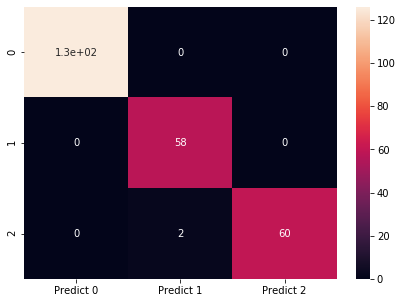

In [307]:
y_pred = svm.predict(X_test)
print(' ')
print('                Confusion Matrix ') 
cm=metrics.confusion_matrix(y_test,y_pred, labels=[0, 1, 2])

df_cm = pd.DataFrame(cm, index = [i for i in ["0","1","2"]], columns = [i for i in ["Predict 0","Predict 1","Predict 2"]])
df_cm
plt.figure(figsize = (7,5))
sns.heatmap(df_cm, annot=True)
plt.show()

In [308]:
print("                   Classification Report for SVM")
print('')
print(metrics.classification_report(y_test,y_pred, labels=[0,1,2]))

# The recall rate for 0 & 1 is 100% 
# The model has failed only twice to predict '2'

                   Classification Report for SVM

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       126
           1       0.97      1.00      0.98        58
           2       1.00      0.97      0.98        62

    accuracy                           0.99       246
   macro avg       0.99      0.99      0.99       246
weighted avg       0.99      0.99      0.99       246



In [311]:
# Checking the avegrage accuracy using k-fold technique
scores = []

svm = SVC(C=75, break_ties=False, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma=0.01, kernel='rbf',
    max_iter=-1, probability=False, random_state=None, shrinking=True,
    tol=0.001, verbose=False)

kf = KFold(n_splits=5, shuffle=False)

for train_index, test_index in kf.split(X,Y):
    X_train, X_test, y_train, y_test = X[train_index], X[test_index], Y.iloc[train_index], Y.iloc[test_index]
    svm.fit(X_train, y_train)
    scores.append(svm.score(X_test, y_test))

In [312]:
for i in range(0,5):
    print("The score of model no {0} is: \n{1:.2f}%\n".format(i+1,scores[i]*100))

print("And the average score of K-fold Cross validation is: {0:.2f}%".format(np.mean(scores)*100))

The score of model no 1 is: 
96.95%

The score of model no 2 is: 
99.39%

The score of model no 3 is: 
97.56%

The score of model no 4 is: 
98.78%

The score of model no 5 is: 
98.16%

And the average score of K-fold Cross validation is: 98.17%


In [313]:
# Removing the highly correlated independent variables there by reducing the multi-collinearity factor

# Some of The very high correlated variables are:

# pr.axis_rectangularity - scaled_variance.1 = .99
# scatter_ratio - pr.axis_rectangularity = .99
# scatter_ratio - scaled_variance.1 = .99
# scatter_ratio - max.length_aspect_ratio = .99

# Some of the other high correlated variables are elongatedness, max.length_rectangularity & scaled_radius_of_gyration,
# skewness_about.2 & scaled_variance 

# Therefore it is better to remove the following variables
# 1) scaled_radius_of_gyration
# 2) scaled_variance.1
# 3) scatter_ratio, 
# 4) elongatedness, 
# 5) pr.axis_rectangularity, 
# 6) max.length_rectangularity

# I havent removed few of the other highly correlated variables such as circularity because I feel they are important interms of
# a geometric feature to predict the vehicle type

In [314]:
data = data.drop({"scaled_variance.1","scatter_ratio","scaled_radius_of_gyration","elongatedness","max.length_rectangularity","pr.axis_rectangularity"},axis=1)

In [315]:
X = data.iloc[:,0:-1]
Y = data['class']
ss = StandardScaler()
X = ss.fit_transform(X)
X_train,X_test,y_train,y_test = train_test_split(X,Y,random_state=10,test_size=0.3)
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(573, 12)
(246, 12)
(573,)
(246,)


In [316]:
# Performing the grid-search to find the best parameters for the SVC model after removing the highly correlated variables 

param_grid = {'C': [0.1,0.5,0.75, 1,5, 10,20,30,50,75,100,200,300,350,400,500,1000],  
              'gamma': [5,1,0.75,0.5, 0.1, 0.01, 0.001, 0.0001,'auto','scale'], 
              'kernel': ['linear', 'poly', 'rbf', 'sigmoid']}  
grid = GridSearchCV(SVC(), param_grid, refit = True, verbose = 3) 
grid.fit(X_train,y_train)

Fitting 5 folds for each of 680 candidates, totalling 3400 fits
[CV] C=0.1, gamma=5, kernel=linear ...................................
[CV] ....... C=0.1, gamma=5, kernel=linear, score=0.870, total=   0.0s
[CV] C=0.1, gamma=5, kernel=linear ...................................
[CV] ....... C=0.1, gamma=5, kernel=linear, score=0.896, total=   0.0s
[CV] C=0.1, gamma=5, kernel=linear ...................................
[CV] ....... C=0.1, gamma=5, kernel=linear, score=0.896, total=   0.0s
[CV] C=0.1, gamma=5, kernel=linear ...................................
[CV] ....... C=0.1, gamma=5, kernel=linear, score=0.868, total=   0.0s
[CV] C=0.1, gamma=5, kernel=linear ...................................
[CV] ....... C=0.1, gamma=5, kernel=linear, score=0.895, total=   0.0s
[CV] C=0.1, gamma=5, kernel=poly .....................................
[CV] ......... C=0.1, gamma=5, kernel=poly, score=0.861, total=   0.0s
[CV] C=0.1, gamma=5, kernel=poly .....................................
[CV] ........

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s



[CV] C=0.1, gamma=5, kernel=poly .....................................
[CV] ......... C=0.1, gamma=5, kernel=poly, score=0.921, total=   0.0s
[CV] C=0.1, gamma=5, kernel=poly .....................................
[CV] ......... C=0.1, gamma=5, kernel=poly, score=0.956, total=   0.0s
[CV] C=0.1, gamma=5, kernel=rbf ......................................
[CV] .......... C=0.1, gamma=5, kernel=rbf, score=0.504, total=   0.0s
[CV] C=0.1, gamma=5, kernel=rbf ......................................
[CV] .......... C=0.1, gamma=5, kernel=rbf, score=0.504, total=   0.0s
[CV] C=0.1, gamma=5, kernel=rbf ......................................
[CV] .......... C=0.1, gamma=5, kernel=rbf, score=0.504, total=   0.0s
[CV] C=0.1, gamma=5, kernel=rbf ......................................
[CV] .......... C=0.1, gamma=5, kernel=rbf, score=0.509, total=   0.0s
[CV] C=0.1, gamma=5, kernel=rbf ......................................
[CV] .......... C=0.1, gamma=5, kernel=rbf, score=0.500, total=   0.0s
[CV] 

[CV] ........ C=0.1, gamma=0.5, kernel=rbf, score=0.522, total=   0.0s
[CV] C=0.1, gamma=0.5, kernel=rbf ....................................
[CV] ........ C=0.1, gamma=0.5, kernel=rbf, score=0.574, total=   0.0s
[CV] C=0.1, gamma=0.5, kernel=rbf ....................................
[CV] ........ C=0.1, gamma=0.5, kernel=rbf, score=0.539, total=   0.0s
[CV] C=0.1, gamma=0.5, kernel=rbf ....................................
[CV] ........ C=0.1, gamma=0.5, kernel=rbf, score=0.553, total=   0.0s
[CV] C=0.1, gamma=0.5, kernel=rbf ....................................
[CV] ........ C=0.1, gamma=0.5, kernel=rbf, score=0.544, total=   0.0s
[CV] C=0.1, gamma=0.5, kernel=sigmoid ................................
[CV] .... C=0.1, gamma=0.5, kernel=sigmoid, score=0.600, total=   0.0s
[CV] C=0.1, gamma=0.5, kernel=sigmoid ................................
[CV] .... C=0.1, gamma=0.5, kernel=sigmoid, score=0.609, total=   0.0s
[CV] C=0.1, gamma=0.5, kernel=sigmoid ................................
[CV] .

[CV] ..... C=0.1, gamma=0.001, kernel=poly, score=0.509, total=   0.0s
[CV] C=0.1, gamma=0.001, kernel=poly .................................
[CV] ..... C=0.1, gamma=0.001, kernel=poly, score=0.500, total=   0.0s
[CV] C=0.1, gamma=0.001, kernel=rbf ..................................
[CV] ...... C=0.1, gamma=0.001, kernel=rbf, score=0.504, total=   0.0s
[CV] C=0.1, gamma=0.001, kernel=rbf ..................................
[CV] ...... C=0.1, gamma=0.001, kernel=rbf, score=0.504, total=   0.0s
[CV] C=0.1, gamma=0.001, kernel=rbf ..................................
[CV] ...... C=0.1, gamma=0.001, kernel=rbf, score=0.504, total=   0.0s
[CV] C=0.1, gamma=0.001, kernel=rbf ..................................
[CV] ...... C=0.1, gamma=0.001, kernel=rbf, score=0.509, total=   0.0s
[CV] C=0.1, gamma=0.001, kernel=rbf ..................................
[CV] ...... C=0.1, gamma=0.001, kernel=rbf, score=0.500, total=   0.0s
[CV] C=0.1, gamma=0.001, kernel=sigmoid ..............................
[CV] .

[CV] ..... C=0.1, gamma=scale, kernel=poly, score=0.522, total=   0.0s
[CV] C=0.1, gamma=scale, kernel=poly .................................
[CV] ..... C=0.1, gamma=scale, kernel=poly, score=0.513, total=   0.0s
[CV] C=0.1, gamma=scale, kernel=poly .................................
[CV] ..... C=0.1, gamma=scale, kernel=poly, score=0.596, total=   0.0s
[CV] C=0.1, gamma=scale, kernel=poly .................................
[CV] ..... C=0.1, gamma=scale, kernel=poly, score=0.526, total=   0.0s
[CV] C=0.1, gamma=scale, kernel=rbf ..................................
[CV] ...... C=0.1, gamma=scale, kernel=rbf, score=0.791, total=   0.0s
[CV] C=0.1, gamma=scale, kernel=rbf ..................................
[CV] ...... C=0.1, gamma=scale, kernel=rbf, score=0.765, total=   0.0s
[CV] C=0.1, gamma=scale, kernel=rbf ..................................
[CV] ...... C=0.1, gamma=scale, kernel=rbf, score=0.835, total=   0.0s
[CV] C=0.1, gamma=scale, kernel=rbf ..................................
[CV] .

[CV] ...... C=0.5, gamma=0.75, kernel=poly, score=0.870, total=   0.0s
[CV] C=0.5, gamma=0.75, kernel=poly ..................................
[CV] ...... C=0.5, gamma=0.75, kernel=poly, score=0.930, total=   0.0s
[CV] C=0.5, gamma=0.75, kernel=poly ..................................
[CV] ...... C=0.5, gamma=0.75, kernel=poly, score=0.956, total=   0.0s
[CV] C=0.5, gamma=0.75, kernel=rbf ...................................
[CV] ....... C=0.5, gamma=0.75, kernel=rbf, score=0.765, total=   0.0s
[CV] C=0.5, gamma=0.75, kernel=rbf ...................................
[CV] ....... C=0.5, gamma=0.75, kernel=rbf, score=0.835, total=   0.0s
[CV] C=0.5, gamma=0.75, kernel=rbf ...................................
[CV] ....... C=0.5, gamma=0.75, kernel=rbf, score=0.843, total=   0.0s
[CV] C=0.5, gamma=0.75, kernel=rbf ...................................
[CV] ....... C=0.5, gamma=0.75, kernel=rbf, score=0.789, total=   0.0s
[CV] C=0.5, gamma=0.75, kernel=rbf ...................................
[CV] .

[CV] ...... C=0.5, gamma=0.01, kernel=poly, score=0.500, total=   0.0s
[CV] C=0.5, gamma=0.01, kernel=rbf ...................................
[CV] ....... C=0.5, gamma=0.01, kernel=rbf, score=0.817, total=   0.0s
[CV] C=0.5, gamma=0.01, kernel=rbf ...................................
[CV] ....... C=0.5, gamma=0.01, kernel=rbf, score=0.809, total=   0.0s
[CV] C=0.5, gamma=0.01, kernel=rbf ...................................
[CV] ....... C=0.5, gamma=0.01, kernel=rbf, score=0.826, total=   0.0s
[CV] C=0.5, gamma=0.01, kernel=rbf ...................................
[CV] ....... C=0.5, gamma=0.01, kernel=rbf, score=0.851, total=   0.0s
[CV] C=0.5, gamma=0.01, kernel=rbf ...................................
[CV] ....... C=0.5, gamma=0.01, kernel=rbf, score=0.781, total=   0.0s
[CV] C=0.5, gamma=0.01, kernel=sigmoid ...............................
[CV] ... C=0.5, gamma=0.01, kernel=sigmoid, score=0.522, total=   0.0s
[CV] C=0.5, gamma=0.01, kernel=sigmoid ...............................
[CV] .

[CV] ....... C=0.5, gamma=auto, kernel=rbf, score=0.939, total=   0.0s
[CV] C=0.5, gamma=auto, kernel=rbf ...................................
[CV] ....... C=0.5, gamma=auto, kernel=rbf, score=0.913, total=   0.0s
[CV] C=0.5, gamma=auto, kernel=rbf ...................................
[CV] ....... C=0.5, gamma=auto, kernel=rbf, score=0.965, total=   0.0s
[CV] C=0.5, gamma=auto, kernel=rbf ...................................
[CV] ....... C=0.5, gamma=auto, kernel=rbf, score=0.912, total=   0.0s
[CV] C=0.5, gamma=auto, kernel=sigmoid ...............................
[CV] ... C=0.5, gamma=auto, kernel=sigmoid, score=0.739, total=   0.0s
[CV] C=0.5, gamma=auto, kernel=sigmoid ...............................
[CV] ... C=0.5, gamma=auto, kernel=sigmoid, score=0.757, total=   0.0s
[CV] C=0.5, gamma=auto, kernel=sigmoid ...............................
[CV] ... C=0.5, gamma=auto, kernel=sigmoid, score=0.722, total=   0.0s
[CV] C=0.5, gamma=auto, kernel=sigmoid ...............................
[CV] .

[CV] ......... C=0.75, gamma=1, kernel=rbf, score=0.765, total=   0.0s
[CV] C=0.75, gamma=1, kernel=rbf .....................................
[CV] ......... C=0.75, gamma=1, kernel=rbf, score=0.817, total=   0.0s
[CV] C=0.75, gamma=1, kernel=rbf .....................................
[CV] ......... C=0.75, gamma=1, kernel=rbf, score=0.809, total=   0.0s
[CV] C=0.75, gamma=1, kernel=rbf .....................................
[CV] ......... C=0.75, gamma=1, kernel=rbf, score=0.807, total=   0.0s
[CV] C=0.75, gamma=1, kernel=rbf .....................................
[CV] ......... C=0.75, gamma=1, kernel=rbf, score=0.842, total=   0.0s
[CV] C=0.75, gamma=1, kernel=sigmoid .................................
[CV] ..... C=0.75, gamma=1, kernel=sigmoid, score=0.496, total=   0.0s
[CV] C=0.75, gamma=1, kernel=sigmoid .................................
[CV] ..... C=0.75, gamma=1, kernel=sigmoid, score=0.478, total=   0.0s
[CV] C=0.75, gamma=1, kernel=sigmoid .................................
[CV] .

[CV] ....... C=0.75, gamma=0.1, kernel=rbf, score=0.939, total=   0.0s
[CV] C=0.75, gamma=0.1, kernel=rbf ...................................
[CV] ....... C=0.75, gamma=0.1, kernel=rbf, score=0.913, total=   0.0s
[CV] C=0.75, gamma=0.1, kernel=rbf ...................................
[CV] ....... C=0.75, gamma=0.1, kernel=rbf, score=0.947, total=   0.0s
[CV] C=0.75, gamma=0.1, kernel=rbf ...................................
[CV] ....... C=0.75, gamma=0.1, kernel=rbf, score=0.904, total=   0.0s
[CV] C=0.75, gamma=0.1, kernel=sigmoid ...............................
[CV] ... C=0.75, gamma=0.1, kernel=sigmoid, score=0.661, total=   0.0s
[CV] C=0.75, gamma=0.1, kernel=sigmoid ...............................
[CV] ... C=0.75, gamma=0.1, kernel=sigmoid, score=0.652, total=   0.0s
[CV] C=0.75, gamma=0.1, kernel=sigmoid ...............................
[CV] ... C=0.75, gamma=0.1, kernel=sigmoid, score=0.678, total=   0.0s
[CV] C=0.75, gamma=0.1, kernel=sigmoid ...............................
[CV] .

[CV]  C=0.75, gamma=0.0001, kernel=sigmoid, score=0.504, total=   0.0s
[CV] C=0.75, gamma=0.0001, kernel=sigmoid ............................
[CV]  C=0.75, gamma=0.0001, kernel=sigmoid, score=0.504, total=   0.0s
[CV] C=0.75, gamma=0.0001, kernel=sigmoid ............................
[CV]  C=0.75, gamma=0.0001, kernel=sigmoid, score=0.504, total=   0.0s
[CV] C=0.75, gamma=0.0001, kernel=sigmoid ............................
[CV]  C=0.75, gamma=0.0001, kernel=sigmoid, score=0.509, total=   0.0s
[CV] C=0.75, gamma=0.0001, kernel=sigmoid ............................
[CV]  C=0.75, gamma=0.0001, kernel=sigmoid, score=0.500, total=   0.0s
[CV] C=0.75, gamma=auto, kernel=linear ...............................
[CV] ... C=0.75, gamma=auto, kernel=linear, score=0.887, total=   0.0s
[CV] C=0.75, gamma=auto, kernel=linear ...............................
[CV] ... C=0.75, gamma=auto, kernel=linear, score=0.913, total=   0.0s
[CV] C=0.75, gamma=auto, kernel=linear ...............................
[CV] .

[CV] ............ C=1, gamma=5, kernel=rbf, score=0.509, total=   0.0s
[CV] C=1, gamma=5, kernel=sigmoid ....................................
[CV] ........ C=1, gamma=5, kernel=sigmoid, score=0.487, total=   0.0s
[CV] C=1, gamma=5, kernel=sigmoid ....................................
[CV] ........ C=1, gamma=5, kernel=sigmoid, score=0.574, total=   0.0s
[CV] C=1, gamma=5, kernel=sigmoid ....................................
[CV] ........ C=1, gamma=5, kernel=sigmoid, score=0.496, total=   0.0s
[CV] C=1, gamma=5, kernel=sigmoid ....................................
[CV] ........ C=1, gamma=5, kernel=sigmoid, score=0.605, total=   0.0s
[CV] C=1, gamma=5, kernel=sigmoid ....................................
[CV] ........ C=1, gamma=5, kernel=sigmoid, score=0.491, total=   0.0s
[CV] C=1, gamma=1, kernel=linear .....................................
[CV] ......... C=1, gamma=1, kernel=linear, score=0.887, total=   0.0s
[CV] C=1, gamma=1, kernel=linear .....................................
[CV] .

[CV] ...... C=1, gamma=0.5, kernel=sigmoid, score=0.496, total=   0.0s
[CV] C=1, gamma=0.5, kernel=sigmoid ..................................
[CV] ...... C=1, gamma=0.5, kernel=sigmoid, score=0.504, total=   0.0s
[CV] C=1, gamma=0.5, kernel=sigmoid ..................................
[CV] ...... C=1, gamma=0.5, kernel=sigmoid, score=0.504, total=   0.0s
[CV] C=1, gamma=0.5, kernel=sigmoid ..................................
[CV] ...... C=1, gamma=0.5, kernel=sigmoid, score=0.605, total=   0.0s
[CV] C=1, gamma=0.5, kernel=sigmoid ..................................
[CV] ...... C=1, gamma=0.5, kernel=sigmoid, score=0.509, total=   0.0s
[CV] C=1, gamma=0.1, kernel=linear ...................................
[CV] ....... C=1, gamma=0.1, kernel=linear, score=0.887, total=   0.0s
[CV] C=1, gamma=0.1, kernel=linear ...................................
[CV] ....... C=1, gamma=0.1, kernel=linear, score=0.913, total=   0.0s
[CV] C=1, gamma=0.1, kernel=linear ...................................
[CV] .

[CV] .... C=1, gamma=0.001, kernel=sigmoid, score=0.504, total=   0.0s
[CV] C=1, gamma=0.001, kernel=sigmoid ................................
[CV] .... C=1, gamma=0.001, kernel=sigmoid, score=0.509, total=   0.0s
[CV] C=1, gamma=0.001, kernel=sigmoid ................................
[CV] .... C=1, gamma=0.001, kernel=sigmoid, score=0.500, total=   0.0s
[CV] C=1, gamma=0.0001, kernel=linear ................................
[CV] .... C=1, gamma=0.0001, kernel=linear, score=0.887, total=   0.0s
[CV] C=1, gamma=0.0001, kernel=linear ................................
[CV] .... C=1, gamma=0.0001, kernel=linear, score=0.913, total=   0.0s
[CV] C=1, gamma=0.0001, kernel=linear ................................
[CV] .... C=1, gamma=0.0001, kernel=linear, score=0.922, total=   0.0s
[CV] C=1, gamma=0.0001, kernel=linear ................................
[CV] .... C=1, gamma=0.0001, kernel=linear, score=0.895, total=   0.0s
[CV] C=1, gamma=0.0001, kernel=linear ................................
[CV] .

[CV] .... C=1, gamma=scale, kernel=sigmoid, score=0.711, total=   0.0s
[CV] C=5, gamma=5, kernel=linear .....................................
[CV] ......... C=5, gamma=5, kernel=linear, score=0.913, total=   0.0s
[CV] C=5, gamma=5, kernel=linear .....................................
[CV] ......... C=5, gamma=5, kernel=linear, score=0.930, total=   0.0s
[CV] C=5, gamma=5, kernel=linear .....................................
[CV] ......... C=5, gamma=5, kernel=linear, score=0.896, total=   0.0s
[CV] C=5, gamma=5, kernel=linear .....................................
[CV] ......... C=5, gamma=5, kernel=linear, score=0.904, total=   0.0s
[CV] C=5, gamma=5, kernel=linear .....................................
[CV] ......... C=5, gamma=5, kernel=linear, score=0.947, total=   0.0s
[CV] C=5, gamma=5, kernel=poly .......................................
[CV] ........... C=5, gamma=5, kernel=poly, score=0.861, total=   0.0s
[CV] C=5, gamma=5, kernel=poly .......................................
[CV] .

[CV] ....... C=5, gamma=0.5, kernel=linear, score=0.930, total=   0.0s
[CV] C=5, gamma=0.5, kernel=linear ...................................
[CV] ....... C=5, gamma=0.5, kernel=linear, score=0.896, total=   0.0s
[CV] C=5, gamma=0.5, kernel=linear ...................................
[CV] ....... C=5, gamma=0.5, kernel=linear, score=0.904, total=   0.0s
[CV] C=5, gamma=0.5, kernel=linear ...................................
[CV] ....... C=5, gamma=0.5, kernel=linear, score=0.947, total=   0.0s
[CV] C=5, gamma=0.5, kernel=poly .....................................
[CV] ......... C=5, gamma=0.5, kernel=poly, score=0.861, total=   0.0s
[CV] C=5, gamma=0.5, kernel=poly .....................................
[CV] ......... C=5, gamma=0.5, kernel=poly, score=0.913, total=   0.0s
[CV] C=5, gamma=0.5, kernel=poly .....................................
[CV] ......... C=5, gamma=0.5, kernel=poly, score=0.870, total=   0.0s
[CV] C=5, gamma=0.5, kernel=poly .....................................
[CV] .

[CV] ....... C=5, gamma=0.001, kernel=poly, score=0.509, total=   0.0s
[CV] C=5, gamma=0.001, kernel=poly ...................................
[CV] ....... C=5, gamma=0.001, kernel=poly, score=0.500, total=   0.0s
[CV] C=5, gamma=0.001, kernel=rbf ....................................
[CV] ........ C=5, gamma=0.001, kernel=rbf, score=0.800, total=   0.0s
[CV] C=5, gamma=0.001, kernel=rbf ....................................
[CV] ........ C=5, gamma=0.001, kernel=rbf, score=0.757, total=   0.0s
[CV] C=5, gamma=0.001, kernel=rbf ....................................
[CV] ........ C=5, gamma=0.001, kernel=rbf, score=0.809, total=   0.0s
[CV] C=5, gamma=0.001, kernel=rbf ....................................
[CV] ........ C=5, gamma=0.001, kernel=rbf, score=0.833, total=   0.0s
[CV] C=5, gamma=0.001, kernel=rbf ....................................
[CV] ........ C=5, gamma=0.001, kernel=rbf, score=0.737, total=   0.0s
[CV] C=5, gamma=0.001, kernel=sigmoid ................................
[CV] .

[CV] .... C=5, gamma=scale, kernel=sigmoid, score=0.635, total=   0.0s
[CV] C=5, gamma=scale, kernel=sigmoid ................................
[CV] .... C=5, gamma=scale, kernel=sigmoid, score=0.670, total=   0.0s
[CV] C=5, gamma=scale, kernel=sigmoid ................................
[CV] .... C=5, gamma=scale, kernel=sigmoid, score=0.661, total=   0.0s
[CV] C=5, gamma=scale, kernel=sigmoid ................................
[CV] .... C=5, gamma=scale, kernel=sigmoid, score=0.675, total=   0.0s
[CV] C=5, gamma=scale, kernel=sigmoid ................................
[CV] .... C=5, gamma=scale, kernel=sigmoid, score=0.693, total=   0.0s
[CV] C=10, gamma=5, kernel=linear ....................................
[CV] ........ C=10, gamma=5, kernel=linear, score=0.904, total=   0.0s
[CV] C=10, gamma=5, kernel=linear ....................................
[CV] ........ C=10, gamma=5, kernel=linear, score=0.930, total=   0.0s
[CV] C=10, gamma=5, kernel=linear ....................................
[CV] .

[CV] .... C=10, gamma=0.75, kernel=sigmoid, score=0.614, total=   0.0s
[CV] C=10, gamma=0.75, kernel=sigmoid ................................
[CV] .... C=10, gamma=0.75, kernel=sigmoid, score=0.474, total=   0.0s
[CV] C=10, gamma=0.5, kernel=linear ..................................
[CV] ...... C=10, gamma=0.5, kernel=linear, score=0.904, total=   0.0s
[CV] C=10, gamma=0.5, kernel=linear ..................................
[CV] ...... C=10, gamma=0.5, kernel=linear, score=0.930, total=   0.0s
[CV] C=10, gamma=0.5, kernel=linear ..................................
[CV] ...... C=10, gamma=0.5, kernel=linear, score=0.904, total=   0.0s
[CV] C=10, gamma=0.5, kernel=linear ..................................
[CV] ...... C=10, gamma=0.5, kernel=linear, score=0.912, total=   0.0s
[CV] C=10, gamma=0.5, kernel=linear ..................................
[CV] ...... C=10, gamma=0.5, kernel=linear, score=0.956, total=   0.0s
[CV] C=10, gamma=0.5, kernel=poly ....................................
[CV] .

[CV] .... C=10, gamma=0.01, kernel=sigmoid, score=0.904, total=   0.0s
[CV] C=10, gamma=0.01, kernel=sigmoid ................................
[CV] .... C=10, gamma=0.01, kernel=sigmoid, score=0.887, total=   0.0s
[CV] C=10, gamma=0.01, kernel=sigmoid ................................
[CV] .... C=10, gamma=0.01, kernel=sigmoid, score=0.842, total=   0.0s
[CV] C=10, gamma=0.01, kernel=sigmoid ................................
[CV] .... C=10, gamma=0.01, kernel=sigmoid, score=0.895, total=   0.0s
[CV] C=10, gamma=0.001, kernel=linear ................................
[CV] .... C=10, gamma=0.001, kernel=linear, score=0.904, total=   0.0s
[CV] C=10, gamma=0.001, kernel=linear ................................
[CV] .... C=10, gamma=0.001, kernel=linear, score=0.930, total=   0.0s
[CV] C=10, gamma=0.001, kernel=linear ................................
[CV] .... C=10, gamma=0.001, kernel=linear, score=0.904, total=   0.0s
[CV] C=10, gamma=0.001, kernel=linear ................................
[CV] .

[CV] .... C=10, gamma=auto, kernel=sigmoid, score=0.687, total=   0.0s
[CV] C=10, gamma=auto, kernel=sigmoid ................................
[CV] .... C=10, gamma=auto, kernel=sigmoid, score=0.649, total=   0.0s
[CV] C=10, gamma=auto, kernel=sigmoid ................................
[CV] .... C=10, gamma=auto, kernel=sigmoid, score=0.667, total=   0.0s
[CV] C=10, gamma=scale, kernel=linear ................................
[CV] .... C=10, gamma=scale, kernel=linear, score=0.904, total=   0.0s
[CV] C=10, gamma=scale, kernel=linear ................................
[CV] .... C=10, gamma=scale, kernel=linear, score=0.930, total=   0.0s
[CV] C=10, gamma=scale, kernel=linear ................................
[CV] .... C=10, gamma=scale, kernel=linear, score=0.904, total=   0.0s
[CV] C=10, gamma=scale, kernel=linear ................................
[CV] .... C=10, gamma=scale, kernel=linear, score=0.912, total=   0.0s
[CV] C=10, gamma=scale, kernel=linear ................................
[CV] .

[CV] ....... C=20, gamma=1, kernel=sigmoid, score=0.456, total=   0.0s
[CV] C=20, gamma=0.75, kernel=linear .................................
[CV] ..... C=20, gamma=0.75, kernel=linear, score=0.904, total=   0.0s
[CV] C=20, gamma=0.75, kernel=linear .................................
[CV] ..... C=20, gamma=0.75, kernel=linear, score=0.913, total=   0.0s
[CV] C=20, gamma=0.75, kernel=linear .................................
[CV] ..... C=20, gamma=0.75, kernel=linear, score=0.896, total=   0.0s
[CV] C=20, gamma=0.75, kernel=linear .................................
[CV] ..... C=20, gamma=0.75, kernel=linear, score=0.921, total=   0.1s
[CV] C=20, gamma=0.75, kernel=linear .................................
[CV] ..... C=20, gamma=0.75, kernel=linear, score=0.956, total=   0.1s
[CV] C=20, gamma=0.75, kernel=poly ...................................
[CV] ....... C=20, gamma=0.75, kernel=poly, score=0.861, total=   0.0s
[CV] C=20, gamma=0.75, kernel=poly ...................................
[CV] .

[CV] ..... C=20, gamma=0.01, kernel=linear, score=0.921, total=   0.1s
[CV] C=20, gamma=0.01, kernel=linear .................................
[CV] ..... C=20, gamma=0.01, kernel=linear, score=0.956, total=   0.0s
[CV] C=20, gamma=0.01, kernel=poly ...................................
[CV] ....... C=20, gamma=0.01, kernel=poly, score=0.530, total=   0.0s
[CV] C=20, gamma=0.01, kernel=poly ...................................
[CV] ....... C=20, gamma=0.01, kernel=poly, score=0.513, total=   0.0s
[CV] C=20, gamma=0.01, kernel=poly ...................................
[CV] ....... C=20, gamma=0.01, kernel=poly, score=0.530, total=   0.0s
[CV] C=20, gamma=0.01, kernel=poly ...................................
[CV] ....... C=20, gamma=0.01, kernel=poly, score=0.561, total=   0.0s
[CV] C=20, gamma=0.01, kernel=poly ...................................
[CV] ....... C=20, gamma=0.01, kernel=poly, score=0.526, total=   0.0s
[CV] C=20, gamma=0.01, kernel=rbf ....................................
[CV] .

[CV] ..... C=20, gamma=auto, kernel=linear, score=0.956, total=   0.0s
[CV] C=20, gamma=auto, kernel=poly ...................................
[CV] ....... C=20, gamma=auto, kernel=poly, score=0.904, total=   0.0s
[CV] C=20, gamma=auto, kernel=poly ...................................
[CV] ....... C=20, gamma=auto, kernel=poly, score=0.913, total=   0.0s
[CV] C=20, gamma=auto, kernel=poly ...................................
[CV] ....... C=20, gamma=auto, kernel=poly, score=0.887, total=   0.0s
[CV] C=20, gamma=auto, kernel=poly ...................................
[CV] ....... C=20, gamma=auto, kernel=poly, score=0.947, total=   0.0s
[CV] C=20, gamma=auto, kernel=poly ...................................
[CV] ....... C=20, gamma=auto, kernel=poly, score=0.939, total=   0.0s
[CV] C=20, gamma=auto, kernel=rbf ....................................
[CV] ........ C=20, gamma=auto, kernel=rbf, score=0.939, total=   0.0s
[CV] C=20, gamma=auto, kernel=rbf ....................................
[CV] .

[CV] ........ C=30, gamma=1, kernel=linear, score=0.921, total=   0.1s
[CV] C=30, gamma=1, kernel=linear ....................................
[CV] ........ C=30, gamma=1, kernel=linear, score=0.947, total=   0.1s
[CV] C=30, gamma=1, kernel=poly ......................................
[CV] .......... C=30, gamma=1, kernel=poly, score=0.861, total=   0.0s
[CV] C=30, gamma=1, kernel=poly ......................................
[CV] .......... C=30, gamma=1, kernel=poly, score=0.913, total=   0.0s
[CV] C=30, gamma=1, kernel=poly ......................................
[CV] .......... C=30, gamma=1, kernel=poly, score=0.870, total=   0.0s
[CV] C=30, gamma=1, kernel=poly ......................................
[CV] .......... C=30, gamma=1, kernel=poly, score=0.921, total=   0.0s
[CV] C=30, gamma=1, kernel=poly ......................................
[CV] .......... C=30, gamma=1, kernel=poly, score=0.956, total=   0.0s
[CV] C=30, gamma=1, kernel=rbf .......................................
[CV] .

[CV] ...... C=30, gamma=0.1, kernel=linear, score=0.904, total=   0.1s
[CV] C=30, gamma=0.1, kernel=linear ..................................
[CV] ...... C=30, gamma=0.1, kernel=linear, score=0.921, total=   0.1s
[CV] C=30, gamma=0.1, kernel=linear ..................................
[CV] ...... C=30, gamma=0.1, kernel=linear, score=0.947, total=   0.1s
[CV] C=30, gamma=0.1, kernel=poly ....................................
[CV] ........ C=30, gamma=0.1, kernel=poly, score=0.887, total=   0.0s
[CV] C=30, gamma=0.1, kernel=poly ....................................
[CV] ........ C=30, gamma=0.1, kernel=poly, score=0.904, total=   0.0s
[CV] C=30, gamma=0.1, kernel=poly ....................................
[CV] ........ C=30, gamma=0.1, kernel=poly, score=0.896, total=   0.0s
[CV] C=30, gamma=0.1, kernel=poly ....................................
[CV] ........ C=30, gamma=0.1, kernel=poly, score=0.947, total=   0.0s
[CV] C=30, gamma=0.1, kernel=poly ....................................
[CV] .

[CV] ... C=30, gamma=0.0001, kernel=linear, score=0.887, total=   0.0s
[CV] C=30, gamma=0.0001, kernel=linear ...............................
[CV] ... C=30, gamma=0.0001, kernel=linear, score=0.904, total=   0.0s
[CV] C=30, gamma=0.0001, kernel=linear ...............................
[CV] ... C=30, gamma=0.0001, kernel=linear, score=0.904, total=   0.0s
[CV] C=30, gamma=0.0001, kernel=linear ...............................
[CV] ... C=30, gamma=0.0001, kernel=linear, score=0.921, total=   0.0s
[CV] C=30, gamma=0.0001, kernel=linear ...............................
[CV] ... C=30, gamma=0.0001, kernel=linear, score=0.947, total=   0.0s
[CV] C=30, gamma=0.0001, kernel=poly .................................
[CV] ..... C=30, gamma=0.0001, kernel=poly, score=0.504, total=   0.0s
[CV] C=30, gamma=0.0001, kernel=poly .................................
[CV] ..... C=30, gamma=0.0001, kernel=poly, score=0.504, total=   0.0s
[CV] C=30, gamma=0.0001, kernel=poly .................................
[CV] .

[CV] ........ C=50, gamma=5, kernel=linear, score=0.887, total=   0.1s
[CV] C=50, gamma=5, kernel=linear ....................................
[CV] ........ C=50, gamma=5, kernel=linear, score=0.913, total=   0.2s
[CV] C=50, gamma=5, kernel=linear ....................................
[CV] ........ C=50, gamma=5, kernel=linear, score=0.904, total=   0.1s
[CV] C=50, gamma=5, kernel=linear ....................................
[CV] ........ C=50, gamma=5, kernel=linear, score=0.921, total=   0.1s
[CV] C=50, gamma=5, kernel=linear ....................................
[CV] ........ C=50, gamma=5, kernel=linear, score=0.930, total=   0.1s
[CV] C=50, gamma=5, kernel=poly ......................................
[CV] .......... C=50, gamma=5, kernel=poly, score=0.861, total=   0.0s
[CV] C=50, gamma=5, kernel=poly ......................................
[CV] .......... C=50, gamma=5, kernel=poly, score=0.913, total=   0.0s
[CV] C=50, gamma=5, kernel=poly ......................................
[CV] .

[CV] ...... C=50, gamma=0.5, kernel=linear, score=0.887, total=   0.1s
[CV] C=50, gamma=0.5, kernel=linear ..................................
[CV] ...... C=50, gamma=0.5, kernel=linear, score=0.913, total=   0.1s
[CV] C=50, gamma=0.5, kernel=linear ..................................
[CV] ...... C=50, gamma=0.5, kernel=linear, score=0.904, total=   0.1s
[CV] C=50, gamma=0.5, kernel=linear ..................................
[CV] ...... C=50, gamma=0.5, kernel=linear, score=0.921, total=   0.1s
[CV] C=50, gamma=0.5, kernel=linear ..................................
[CV] ...... C=50, gamma=0.5, kernel=linear, score=0.930, total=   0.1s
[CV] C=50, gamma=0.5, kernel=poly ....................................
[CV] ........ C=50, gamma=0.5, kernel=poly, score=0.861, total=   0.0s
[CV] C=50, gamma=0.5, kernel=poly ....................................
[CV] ........ C=50, gamma=0.5, kernel=poly, score=0.913, total=   0.0s
[CV] C=50, gamma=0.5, kernel=poly ....................................
[CV] .

[CV] .... C=50, gamma=0.01, kernel=sigmoid, score=0.877, total=   0.0s
[CV] C=50, gamma=0.001, kernel=linear ................................
[CV] .... C=50, gamma=0.001, kernel=linear, score=0.887, total=   0.1s
[CV] C=50, gamma=0.001, kernel=linear ................................
[CV] .... C=50, gamma=0.001, kernel=linear, score=0.913, total=   0.1s
[CV] C=50, gamma=0.001, kernel=linear ................................
[CV] .... C=50, gamma=0.001, kernel=linear, score=0.904, total=   0.0s
[CV] C=50, gamma=0.001, kernel=linear ................................
[CV] .... C=50, gamma=0.001, kernel=linear, score=0.921, total=   0.1s
[CV] C=50, gamma=0.001, kernel=linear ................................
[CV] .... C=50, gamma=0.001, kernel=linear, score=0.930, total=   0.1s
[CV] C=50, gamma=0.001, kernel=poly ..................................
[CV] ...... C=50, gamma=0.001, kernel=poly, score=0.504, total=   0.0s
[CV] C=50, gamma=0.001, kernel=poly ..................................
[CV] .

[CV] .... C=50, gamma=auto, kernel=sigmoid, score=0.623, total=   0.0s
[CV] C=50, gamma=auto, kernel=sigmoid ................................
[CV] .... C=50, gamma=auto, kernel=sigmoid, score=0.658, total=   0.0s
[CV] C=50, gamma=scale, kernel=linear ................................
[CV] .... C=50, gamma=scale, kernel=linear, score=0.887, total=   0.1s
[CV] C=50, gamma=scale, kernel=linear ................................
[CV] .... C=50, gamma=scale, kernel=linear, score=0.913, total=   0.1s
[CV] C=50, gamma=scale, kernel=linear ................................
[CV] .... C=50, gamma=scale, kernel=linear, score=0.904, total=   0.1s
[CV] C=50, gamma=scale, kernel=linear ................................
[CV] .... C=50, gamma=scale, kernel=linear, score=0.921, total=   0.1s
[CV] C=50, gamma=scale, kernel=linear ................................
[CV] .... C=50, gamma=scale, kernel=linear, score=0.930, total=   0.1s
[CV] C=50, gamma=scale, kernel=poly ..................................
[CV] .

[CV] ..... C=75, gamma=0.75, kernel=linear, score=0.887, total=   0.1s
[CV] C=75, gamma=0.75, kernel=linear .................................
[CV] ..... C=75, gamma=0.75, kernel=linear, score=0.913, total=   0.1s
[CV] C=75, gamma=0.75, kernel=linear .................................
[CV] ..... C=75, gamma=0.75, kernel=linear, score=0.896, total=   0.1s
[CV] C=75, gamma=0.75, kernel=linear .................................
[CV] ..... C=75, gamma=0.75, kernel=linear, score=0.930, total=   0.1s
[CV] C=75, gamma=0.75, kernel=linear .................................
[CV] ..... C=75, gamma=0.75, kernel=linear, score=0.939, total=   0.1s
[CV] C=75, gamma=0.75, kernel=poly ...................................
[CV] ....... C=75, gamma=0.75, kernel=poly, score=0.861, total=   0.0s
[CV] C=75, gamma=0.75, kernel=poly ...................................
[CV] ....... C=75, gamma=0.75, kernel=poly, score=0.913, total=   0.0s
[CV] C=75, gamma=0.75, kernel=poly ...................................
[CV] .

[CV] ..... C=75, gamma=0.01, kernel=linear, score=0.887, total=   0.1s
[CV] C=75, gamma=0.01, kernel=linear .................................
[CV] ..... C=75, gamma=0.01, kernel=linear, score=0.913, total=   0.1s
[CV] C=75, gamma=0.01, kernel=linear .................................
[CV] ..... C=75, gamma=0.01, kernel=linear, score=0.896, total=   0.1s
[CV] C=75, gamma=0.01, kernel=linear .................................
[CV] ..... C=75, gamma=0.01, kernel=linear, score=0.930, total=   0.1s
[CV] C=75, gamma=0.01, kernel=linear .................................
[CV] ..... C=75, gamma=0.01, kernel=linear, score=0.939, total=   0.1s
[CV] C=75, gamma=0.01, kernel=poly ...................................
[CV] ....... C=75, gamma=0.01, kernel=poly, score=0.565, total=   0.0s
[CV] C=75, gamma=0.01, kernel=poly ...................................
[CV] ....... C=75, gamma=0.01, kernel=poly, score=0.574, total=   0.0s
[CV] C=75, gamma=0.01, kernel=poly ...................................
[CV] .

[CV] .. C=75, gamma=0.0001, kernel=sigmoid, score=0.614, total=   0.0s
[CV] C=75, gamma=auto, kernel=linear .................................
[CV] ..... C=75, gamma=auto, kernel=linear, score=0.887, total=   0.1s
[CV] C=75, gamma=auto, kernel=linear .................................
[CV] ..... C=75, gamma=auto, kernel=linear, score=0.913, total=   0.1s
[CV] C=75, gamma=auto, kernel=linear .................................
[CV] ..... C=75, gamma=auto, kernel=linear, score=0.896, total=   0.1s
[CV] C=75, gamma=auto, kernel=linear .................................
[CV] ..... C=75, gamma=auto, kernel=linear, score=0.930, total=   0.1s
[CV] C=75, gamma=auto, kernel=linear .................................
[CV] ..... C=75, gamma=auto, kernel=linear, score=0.939, total=   0.1s
[CV] C=75, gamma=auto, kernel=poly ...................................
[CV] ....... C=75, gamma=auto, kernel=poly, score=0.878, total=   0.0s
[CV] C=75, gamma=auto, kernel=poly ...................................
[CV] .

[CV] ....... C=100, gamma=1, kernel=linear, score=0.887, total=   0.2s
[CV] C=100, gamma=1, kernel=linear ...................................
[CV] ....... C=100, gamma=1, kernel=linear, score=0.913, total=   0.1s
[CV] C=100, gamma=1, kernel=linear ...................................
[CV] ....... C=100, gamma=1, kernel=linear, score=0.887, total=   0.1s
[CV] C=100, gamma=1, kernel=linear ...................................
[CV] ....... C=100, gamma=1, kernel=linear, score=0.930, total=   0.1s
[CV] C=100, gamma=1, kernel=linear ...................................
[CV] ....... C=100, gamma=1, kernel=linear, score=0.939, total=   0.1s
[CV] C=100, gamma=1, kernel=poly .....................................
[CV] ......... C=100, gamma=1, kernel=poly, score=0.861, total=   0.0s
[CV] C=100, gamma=1, kernel=poly .....................................
[CV] ......... C=100, gamma=1, kernel=poly, score=0.913, total=   0.0s
[CV] C=100, gamma=1, kernel=poly .....................................
[CV] .

[CV] ..... C=100, gamma=0.1, kernel=linear, score=0.887, total=   0.2s
[CV] C=100, gamma=0.1, kernel=linear .................................
[CV] ..... C=100, gamma=0.1, kernel=linear, score=0.913, total=   0.1s
[CV] C=100, gamma=0.1, kernel=linear .................................
[CV] ..... C=100, gamma=0.1, kernel=linear, score=0.887, total=   0.1s
[CV] C=100, gamma=0.1, kernel=linear .................................
[CV] ..... C=100, gamma=0.1, kernel=linear, score=0.930, total=   0.1s
[CV] C=100, gamma=0.1, kernel=linear .................................
[CV] ..... C=100, gamma=0.1, kernel=linear, score=0.939, total=   0.1s
[CV] C=100, gamma=0.1, kernel=poly ...................................
[CV] ....... C=100, gamma=0.1, kernel=poly, score=0.887, total=   0.0s
[CV] C=100, gamma=0.1, kernel=poly ...................................
[CV] ....... C=100, gamma=0.1, kernel=poly, score=0.896, total=   0.0s
[CV] C=100, gamma=0.1, kernel=poly ...................................
[CV] .

[CV] .. C=100, gamma=0.0001, kernel=linear, score=0.887, total=   0.2s
[CV] C=100, gamma=0.0001, kernel=linear ..............................
[CV] .. C=100, gamma=0.0001, kernel=linear, score=0.913, total=   0.1s
[CV] C=100, gamma=0.0001, kernel=linear ..............................
[CV] .. C=100, gamma=0.0001, kernel=linear, score=0.887, total=   0.1s
[CV] C=100, gamma=0.0001, kernel=linear ..............................
[CV] .. C=100, gamma=0.0001, kernel=linear, score=0.930, total=   0.1s
[CV] C=100, gamma=0.0001, kernel=linear ..............................
[CV] .. C=100, gamma=0.0001, kernel=linear, score=0.939, total=   0.1s
[CV] C=100, gamma=0.0001, kernel=poly ................................
[CV] .... C=100, gamma=0.0001, kernel=poly, score=0.504, total=   0.0s
[CV] C=100, gamma=0.0001, kernel=poly ................................
[CV] .... C=100, gamma=0.0001, kernel=poly, score=0.504, total=   0.0s
[CV] C=100, gamma=0.0001, kernel=poly ................................
[CV] .

[CV] ....... C=200, gamma=5, kernel=linear, score=0.887, total=   0.3s
[CV] C=200, gamma=5, kernel=linear ...................................
[CV] ....... C=200, gamma=5, kernel=linear, score=0.904, total=   0.4s
[CV] C=200, gamma=5, kernel=linear ...................................
[CV] ....... C=200, gamma=5, kernel=linear, score=0.904, total=   0.1s
[CV] C=200, gamma=5, kernel=linear ...................................
[CV] ....... C=200, gamma=5, kernel=linear, score=0.939, total=   0.1s
[CV] C=200, gamma=5, kernel=linear ...................................
[CV] ....... C=200, gamma=5, kernel=linear, score=0.930, total=   0.2s
[CV] C=200, gamma=5, kernel=poly .....................................
[CV] ......... C=200, gamma=5, kernel=poly, score=0.861, total=   0.0s
[CV] C=200, gamma=5, kernel=poly .....................................
[CV] ......... C=200, gamma=5, kernel=poly, score=0.913, total=   0.0s
[CV] C=200, gamma=5, kernel=poly .....................................
[CV] .

[CV] ... C=200, gamma=0.75, kernel=sigmoid, score=0.482, total=   0.0s
[CV] C=200, gamma=0.5, kernel=linear .................................
[CV] ..... C=200, gamma=0.5, kernel=linear, score=0.887, total=   0.3s
[CV] C=200, gamma=0.5, kernel=linear .................................
[CV] ..... C=200, gamma=0.5, kernel=linear, score=0.904, total=   0.4s
[CV] C=200, gamma=0.5, kernel=linear .................................
[CV] ..... C=200, gamma=0.5, kernel=linear, score=0.904, total=   0.1s
[CV] C=200, gamma=0.5, kernel=linear .................................
[CV] ..... C=200, gamma=0.5, kernel=linear, score=0.939, total=   0.2s
[CV] C=200, gamma=0.5, kernel=linear .................................
[CV] ..... C=200, gamma=0.5, kernel=linear, score=0.930, total=   0.2s
[CV] C=200, gamma=0.5, kernel=poly ...................................
[CV] ....... C=200, gamma=0.5, kernel=poly, score=0.861, total=   0.0s
[CV] C=200, gamma=0.5, kernel=poly ...................................
[CV] .

[CV] ... C=200, gamma=0.001, kernel=linear, score=0.887, total=   0.4s
[CV] C=200, gamma=0.001, kernel=linear ...............................
[CV] ... C=200, gamma=0.001, kernel=linear, score=0.904, total=   0.4s
[CV] C=200, gamma=0.001, kernel=linear ...............................
[CV] ... C=200, gamma=0.001, kernel=linear, score=0.904, total=   0.2s
[CV] C=200, gamma=0.001, kernel=linear ...............................
[CV] ... C=200, gamma=0.001, kernel=linear, score=0.939, total=   0.1s
[CV] C=200, gamma=0.001, kernel=linear ...............................
[CV] ... C=200, gamma=0.001, kernel=linear, score=0.930, total=   0.2s
[CV] C=200, gamma=0.001, kernel=poly .................................
[CV] ..... C=200, gamma=0.001, kernel=poly, score=0.504, total=   0.0s
[CV] C=200, gamma=0.001, kernel=poly .................................
[CV] ..... C=200, gamma=0.001, kernel=poly, score=0.504, total=   0.0s
[CV] C=200, gamma=0.001, kernel=poly .................................
[CV] .

[CV] ... C=200, gamma=scale, kernel=linear, score=0.887, total=   0.2s
[CV] C=200, gamma=scale, kernel=linear ...............................
[CV] ... C=200, gamma=scale, kernel=linear, score=0.904, total=   0.4s
[CV] C=200, gamma=scale, kernel=linear ...............................
[CV] ... C=200, gamma=scale, kernel=linear, score=0.904, total=   0.1s
[CV] C=200, gamma=scale, kernel=linear ...............................
[CV] ... C=200, gamma=scale, kernel=linear, score=0.939, total=   0.2s
[CV] C=200, gamma=scale, kernel=linear ...............................
[CV] ... C=200, gamma=scale, kernel=linear, score=0.930, total=   0.2s
[CV] C=200, gamma=scale, kernel=poly .................................
[CV] ..... C=200, gamma=scale, kernel=poly, score=0.887, total=   0.0s
[CV] C=200, gamma=scale, kernel=poly .................................
[CV] ..... C=200, gamma=scale, kernel=poly, score=0.896, total=   0.0s
[CV] C=200, gamma=scale, kernel=poly .................................
[CV] .

[CV] .... C=300, gamma=0.75, kernel=linear, score=0.887, total=   0.3s
[CV] C=300, gamma=0.75, kernel=linear ................................
[CV] .... C=300, gamma=0.75, kernel=linear, score=0.904, total=   0.4s
[CV] C=300, gamma=0.75, kernel=linear ................................
[CV] .... C=300, gamma=0.75, kernel=linear, score=0.904, total=   0.3s
[CV] C=300, gamma=0.75, kernel=linear ................................
[CV] .... C=300, gamma=0.75, kernel=linear, score=0.939, total=   0.2s
[CV] C=300, gamma=0.75, kernel=linear ................................
[CV] .... C=300, gamma=0.75, kernel=linear, score=0.930, total=   0.2s
[CV] C=300, gamma=0.75, kernel=poly ..................................
[CV] ...... C=300, gamma=0.75, kernel=poly, score=0.861, total=   0.0s
[CV] C=300, gamma=0.75, kernel=poly ..................................
[CV] ...... C=300, gamma=0.75, kernel=poly, score=0.913, total=   0.0s
[CV] C=300, gamma=0.75, kernel=poly ..................................
[CV] .

[CV] .... C=300, gamma=0.01, kernel=linear, score=0.887, total=   0.3s
[CV] C=300, gamma=0.01, kernel=linear ................................
[CV] .... C=300, gamma=0.01, kernel=linear, score=0.904, total=   0.4s
[CV] C=300, gamma=0.01, kernel=linear ................................
[CV] .... C=300, gamma=0.01, kernel=linear, score=0.904, total=   0.3s
[CV] C=300, gamma=0.01, kernel=linear ................................
[CV] .... C=300, gamma=0.01, kernel=linear, score=0.939, total=   0.2s
[CV] C=300, gamma=0.01, kernel=linear ................................
[CV] .... C=300, gamma=0.01, kernel=linear, score=0.930, total=   0.2s
[CV] C=300, gamma=0.01, kernel=poly ..................................
[CV] ...... C=300, gamma=0.01, kernel=poly, score=0.696, total=   0.0s
[CV] C=300, gamma=0.01, kernel=poly ..................................
[CV] ...... C=300, gamma=0.01, kernel=poly, score=0.678, total=   0.0s
[CV] C=300, gamma=0.01, kernel=poly ..................................
[CV] .

[CV] .... C=300, gamma=auto, kernel=linear, score=0.887, total=   0.3s
[CV] C=300, gamma=auto, kernel=linear ................................
[CV] .... C=300, gamma=auto, kernel=linear, score=0.904, total=   0.5s
[CV] C=300, gamma=auto, kernel=linear ................................
[CV] .... C=300, gamma=auto, kernel=linear, score=0.904, total=   0.3s
[CV] C=300, gamma=auto, kernel=linear ................................
[CV] .... C=300, gamma=auto, kernel=linear, score=0.939, total=   0.2s
[CV] C=300, gamma=auto, kernel=linear ................................
[CV] .... C=300, gamma=auto, kernel=linear, score=0.930, total=   0.2s
[CV] C=300, gamma=auto, kernel=poly ..................................
[CV] ...... C=300, gamma=auto, kernel=poly, score=0.878, total=   0.0s
[CV] C=300, gamma=auto, kernel=poly ..................................
[CV] ...... C=300, gamma=auto, kernel=poly, score=0.913, total=   0.0s
[CV] C=300, gamma=auto, kernel=poly ..................................
[CV] .

[CV] ....... C=350, gamma=1, kernel=linear, score=0.887, total=   0.6s
[CV] C=350, gamma=1, kernel=linear ...................................
[CV] ....... C=350, gamma=1, kernel=linear, score=0.913, total=   0.5s
[CV] C=350, gamma=1, kernel=linear ...................................
[CV] ....... C=350, gamma=1, kernel=linear, score=0.896, total=   0.3s
[CV] C=350, gamma=1, kernel=linear ...................................
[CV] ....... C=350, gamma=1, kernel=linear, score=0.930, total=   0.3s
[CV] C=350, gamma=1, kernel=linear ...................................
[CV] ....... C=350, gamma=1, kernel=linear, score=0.930, total=   0.2s
[CV] C=350, gamma=1, kernel=poly .....................................
[CV] ......... C=350, gamma=1, kernel=poly, score=0.861, total=   0.0s
[CV] C=350, gamma=1, kernel=poly .....................................
[CV] ......... C=350, gamma=1, kernel=poly, score=0.913, total=   0.0s
[CV] C=350, gamma=1, kernel=poly .....................................
[CV] .

[CV] ..... C=350, gamma=0.1, kernel=linear, score=0.887, total=   0.5s
[CV] C=350, gamma=0.1, kernel=linear .................................
[CV] ..... C=350, gamma=0.1, kernel=linear, score=0.913, total=   0.5s
[CV] C=350, gamma=0.1, kernel=linear .................................
[CV] ..... C=350, gamma=0.1, kernel=linear, score=0.896, total=   0.3s
[CV] C=350, gamma=0.1, kernel=linear .................................
[CV] ..... C=350, gamma=0.1, kernel=linear, score=0.930, total=   0.3s
[CV] C=350, gamma=0.1, kernel=linear .................................
[CV] ..... C=350, gamma=0.1, kernel=linear, score=0.930, total=   0.2s
[CV] C=350, gamma=0.1, kernel=poly ...................................
[CV] ....... C=350, gamma=0.1, kernel=poly, score=0.861, total=   0.0s
[CV] C=350, gamma=0.1, kernel=poly ...................................
[CV] ....... C=350, gamma=0.1, kernel=poly, score=0.896, total=   0.0s
[CV] C=350, gamma=0.1, kernel=poly ...................................
[CV] .

[CV] .. C=350, gamma=0.0001, kernel=linear, score=0.887, total=   0.5s
[CV] C=350, gamma=0.0001, kernel=linear ..............................
[CV] .. C=350, gamma=0.0001, kernel=linear, score=0.913, total=   0.5s
[CV] C=350, gamma=0.0001, kernel=linear ..............................
[CV] .. C=350, gamma=0.0001, kernel=linear, score=0.896, total=   0.3s
[CV] C=350, gamma=0.0001, kernel=linear ..............................
[CV] .. C=350, gamma=0.0001, kernel=linear, score=0.930, total=   0.3s
[CV] C=350, gamma=0.0001, kernel=linear ..............................
[CV] .. C=350, gamma=0.0001, kernel=linear, score=0.930, total=   0.2s
[CV] C=350, gamma=0.0001, kernel=poly ................................
[CV] .... C=350, gamma=0.0001, kernel=poly, score=0.504, total=   0.0s
[CV] C=350, gamma=0.0001, kernel=poly ................................
[CV] .... C=350, gamma=0.0001, kernel=poly, score=0.504, total=   0.0s
[CV] C=350, gamma=0.0001, kernel=poly ................................
[CV] .

[CV] ....... C=400, gamma=5, kernel=linear, score=0.887, total=   0.4s
[CV] C=400, gamma=5, kernel=linear ...................................
[CV] ....... C=400, gamma=5, kernel=linear, score=0.913, total=   0.5s
[CV] C=400, gamma=5, kernel=linear ...................................
[CV] ....... C=400, gamma=5, kernel=linear, score=0.896, total=   0.4s
[CV] C=400, gamma=5, kernel=linear ...................................
[CV] ....... C=400, gamma=5, kernel=linear, score=0.930, total=   0.5s
[CV] C=400, gamma=5, kernel=linear ...................................
[CV] ....... C=400, gamma=5, kernel=linear, score=0.930, total=   0.2s
[CV] C=400, gamma=5, kernel=poly .....................................
[CV] ......... C=400, gamma=5, kernel=poly, score=0.861, total=   0.0s
[CV] C=400, gamma=5, kernel=poly .....................................
[CV] ......... C=400, gamma=5, kernel=poly, score=0.913, total=   0.0s
[CV] C=400, gamma=5, kernel=poly .....................................
[CV] .

[CV] ..... C=400, gamma=0.5, kernel=linear, score=0.887, total=   0.4s
[CV] C=400, gamma=0.5, kernel=linear .................................
[CV] ..... C=400, gamma=0.5, kernel=linear, score=0.913, total=   0.5s
[CV] C=400, gamma=0.5, kernel=linear .................................
[CV] ..... C=400, gamma=0.5, kernel=linear, score=0.896, total=   0.4s
[CV] C=400, gamma=0.5, kernel=linear .................................
[CV] ..... C=400, gamma=0.5, kernel=linear, score=0.930, total=   0.6s
[CV] C=400, gamma=0.5, kernel=linear .................................
[CV] ..... C=400, gamma=0.5, kernel=linear, score=0.930, total=   0.2s
[CV] C=400, gamma=0.5, kernel=poly ...................................
[CV] ....... C=400, gamma=0.5, kernel=poly, score=0.861, total=   0.0s
[CV] C=400, gamma=0.5, kernel=poly ...................................
[CV] ....... C=400, gamma=0.5, kernel=poly, score=0.913, total=   0.0s
[CV] C=400, gamma=0.5, kernel=poly ...................................
[CV] .

[CV] ... C=400, gamma=0.001, kernel=linear, score=0.887, total=   0.4s
[CV] C=400, gamma=0.001, kernel=linear ...............................
[CV] ... C=400, gamma=0.001, kernel=linear, score=0.913, total=   0.5s
[CV] C=400, gamma=0.001, kernel=linear ...............................
[CV] ... C=400, gamma=0.001, kernel=linear, score=0.896, total=   0.4s
[CV] C=400, gamma=0.001, kernel=linear ...............................
[CV] ... C=400, gamma=0.001, kernel=linear, score=0.930, total=   0.6s
[CV] C=400, gamma=0.001, kernel=linear ...............................
[CV] ... C=400, gamma=0.001, kernel=linear, score=0.930, total=   0.2s
[CV] C=400, gamma=0.001, kernel=poly .................................
[CV] ..... C=400, gamma=0.001, kernel=poly, score=0.504, total=   0.0s
[CV] C=400, gamma=0.001, kernel=poly .................................
[CV] ..... C=400, gamma=0.001, kernel=poly, score=0.504, total=   0.0s
[CV] C=400, gamma=0.001, kernel=poly .................................
[CV] .

[CV] ... C=400, gamma=scale, kernel=linear, score=0.887, total=   0.4s
[CV] C=400, gamma=scale, kernel=linear ...............................
[CV] ... C=400, gamma=scale, kernel=linear, score=0.913, total=   0.5s
[CV] C=400, gamma=scale, kernel=linear ...............................
[CV] ... C=400, gamma=scale, kernel=linear, score=0.896, total=   0.4s
[CV] C=400, gamma=scale, kernel=linear ...............................
[CV] ... C=400, gamma=scale, kernel=linear, score=0.930, total=   0.6s
[CV] C=400, gamma=scale, kernel=linear ...............................
[CV] ... C=400, gamma=scale, kernel=linear, score=0.930, total=   0.2s
[CV] C=400, gamma=scale, kernel=poly .................................
[CV] ..... C=400, gamma=scale, kernel=poly, score=0.870, total=   0.0s
[CV] C=400, gamma=scale, kernel=poly .................................
[CV] ..... C=400, gamma=scale, kernel=poly, score=0.913, total=   0.0s
[CV] C=400, gamma=scale, kernel=poly .................................
[CV] .

[CV] .... C=500, gamma=0.75, kernel=linear, score=0.887, total=   0.6s
[CV] C=500, gamma=0.75, kernel=linear ................................
[CV] .... C=500, gamma=0.75, kernel=linear, score=0.913, total=   0.7s
[CV] C=500, gamma=0.75, kernel=linear ................................
[CV] .... C=500, gamma=0.75, kernel=linear, score=0.904, total=   0.5s
[CV] C=500, gamma=0.75, kernel=linear ................................
[CV] .... C=500, gamma=0.75, kernel=linear, score=0.930, total=   0.7s
[CV] C=500, gamma=0.75, kernel=linear ................................
[CV] .... C=500, gamma=0.75, kernel=linear, score=0.930, total=   0.5s
[CV] C=500, gamma=0.75, kernel=poly ..................................
[CV] ...... C=500, gamma=0.75, kernel=poly, score=0.861, total=   0.0s
[CV] C=500, gamma=0.75, kernel=poly ..................................
[CV] ...... C=500, gamma=0.75, kernel=poly, score=0.913, total=   0.0s
[CV] C=500, gamma=0.75, kernel=poly ..................................
[CV] .

[CV] .... C=500, gamma=0.01, kernel=linear, score=0.887, total=   0.5s
[CV] C=500, gamma=0.01, kernel=linear ................................
[CV] .... C=500, gamma=0.01, kernel=linear, score=0.913, total=   0.7s
[CV] C=500, gamma=0.01, kernel=linear ................................
[CV] .... C=500, gamma=0.01, kernel=linear, score=0.904, total=   0.4s
[CV] C=500, gamma=0.01, kernel=linear ................................
[CV] .... C=500, gamma=0.01, kernel=linear, score=0.930, total=   0.5s
[CV] C=500, gamma=0.01, kernel=linear ................................
[CV] .... C=500, gamma=0.01, kernel=linear, score=0.930, total=   0.3s
[CV] C=500, gamma=0.01, kernel=poly ..................................
[CV] ...... C=500, gamma=0.01, kernel=poly, score=0.774, total=   0.0s
[CV] C=500, gamma=0.01, kernel=poly ..................................
[CV] ...... C=500, gamma=0.01, kernel=poly, score=0.765, total=   0.0s
[CV] C=500, gamma=0.01, kernel=poly ..................................
[CV] .

[CV] .... C=500, gamma=auto, kernel=linear, score=0.887, total=   0.6s
[CV] C=500, gamma=auto, kernel=linear ................................
[CV] .... C=500, gamma=auto, kernel=linear, score=0.913, total=   0.8s
[CV] C=500, gamma=auto, kernel=linear ................................
[CV] .... C=500, gamma=auto, kernel=linear, score=0.904, total=   0.5s
[CV] C=500, gamma=auto, kernel=linear ................................
[CV] .... C=500, gamma=auto, kernel=linear, score=0.930, total=   0.5s
[CV] C=500, gamma=auto, kernel=linear ................................
[CV] .... C=500, gamma=auto, kernel=linear, score=0.930, total=   0.3s
[CV] C=500, gamma=auto, kernel=poly ..................................
[CV] ...... C=500, gamma=auto, kernel=poly, score=0.861, total=   0.0s
[CV] C=500, gamma=auto, kernel=poly ..................................
[CV] ...... C=500, gamma=auto, kernel=poly, score=0.904, total=   0.0s
[CV] C=500, gamma=auto, kernel=poly ..................................
[CV] .

[CV] ...... C=1000, gamma=1, kernel=linear, score=0.887, total=   0.9s
[CV] C=1000, gamma=1, kernel=linear ..................................
[CV] ...... C=1000, gamma=1, kernel=linear, score=0.913, total=   0.7s
[CV] C=1000, gamma=1, kernel=linear ..................................
[CV] ...... C=1000, gamma=1, kernel=linear, score=0.913, total=   0.4s
[CV] C=1000, gamma=1, kernel=linear ..................................
[CV] ...... C=1000, gamma=1, kernel=linear, score=0.939, total=   0.6s
[CV] C=1000, gamma=1, kernel=linear ..................................
[CV] ...... C=1000, gamma=1, kernel=linear, score=0.930, total=   0.8s
[CV] C=1000, gamma=1, kernel=poly ....................................
[CV] ........ C=1000, gamma=1, kernel=poly, score=0.861, total=   0.0s
[CV] C=1000, gamma=1, kernel=poly ....................................
[CV] ........ C=1000, gamma=1, kernel=poly, score=0.913, total=   0.0s
[CV] C=1000, gamma=1, kernel=poly ....................................
[CV] .

[CV] .... C=1000, gamma=0.1, kernel=linear, score=0.887, total=   0.9s
[CV] C=1000, gamma=0.1, kernel=linear ................................
[CV] .... C=1000, gamma=0.1, kernel=linear, score=0.913, total=   0.7s
[CV] C=1000, gamma=0.1, kernel=linear ................................
[CV] .... C=1000, gamma=0.1, kernel=linear, score=0.913, total=   0.4s
[CV] C=1000, gamma=0.1, kernel=linear ................................
[CV] .... C=1000, gamma=0.1, kernel=linear, score=0.939, total=   0.6s
[CV] C=1000, gamma=0.1, kernel=linear ................................
[CV] .... C=1000, gamma=0.1, kernel=linear, score=0.930, total=   0.8s
[CV] C=1000, gamma=0.1, kernel=poly ..................................
[CV] ...... C=1000, gamma=0.1, kernel=poly, score=0.861, total=   0.0s
[CV] C=1000, gamma=0.1, kernel=poly ..................................
[CV] ...... C=1000, gamma=0.1, kernel=poly, score=0.913, total=   0.0s
[CV] C=1000, gamma=0.1, kernel=poly ..................................
[CV] .

[CV] . C=1000, gamma=0.0001, kernel=linear, score=0.887, total=   0.9s
[CV] C=1000, gamma=0.0001, kernel=linear .............................
[CV] . C=1000, gamma=0.0001, kernel=linear, score=0.913, total=   0.7s
[CV] C=1000, gamma=0.0001, kernel=linear .............................
[CV] . C=1000, gamma=0.0001, kernel=linear, score=0.913, total=   0.4s
[CV] C=1000, gamma=0.0001, kernel=linear .............................
[CV] . C=1000, gamma=0.0001, kernel=linear, score=0.939, total=   0.7s
[CV] C=1000, gamma=0.0001, kernel=linear .............................
[CV] . C=1000, gamma=0.0001, kernel=linear, score=0.930, total=   0.8s
[CV] C=1000, gamma=0.0001, kernel=poly ...............................
[CV] ... C=1000, gamma=0.0001, kernel=poly, score=0.504, total=   0.0s
[CV] C=1000, gamma=0.0001, kernel=poly ...............................
[CV] ... C=1000, gamma=0.0001, kernel=poly, score=0.504, total=   0.0s
[CV] C=1000, gamma=0.0001, kernel=poly ...............................
[CV] .

[Parallel(n_jobs=1)]: Done 3400 out of 3400 | elapsed:  3.4min finished


GridSearchCV(cv=None, error_score=nan,
             estimator=SVC(C=1.0, break_ties=False, cache_size=200,
                           class_weight=None, coef0=0.0,
                           decision_function_shape='ovr', degree=3,
                           gamma='scale', kernel='rbf', max_iter=-1,
                           probability=False, random_state=None, shrinking=True,
                           tol=0.001, verbose=False),
             iid='deprecated', n_jobs=None,
             param_grid={'C': [0.1, 0.5, 0.75, 1, 5, 10, 20, 30, 50, 75, 100,
                               200, 300, 350, 400, 500, 1000],
                         'gamma': [5, 1, 0.75, 0.5, 0.1, 0.01, 0.001, 0.0001,
                                   'auto', 'scale'],
                         'kernel': ['linear', 'poly', 'rbf', 'sigmoid']},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=3)

In [317]:
print(grid.best_params_)
print(grid.best_estimator_)

{'C': 350, 'gamma': 0.01, 'kernel': 'rbf'}
SVC(C=350, break_ties=False, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma=0.01, kernel='rbf',
    max_iter=-1, probability=False, random_state=None, shrinking=True,
    tol=0.001, verbose=False)


In [319]:
svm = SVC(C=350, break_ties=False, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma=0.01, kernel='rbf',
    max_iter=-1, probability=False, random_state=None, shrinking=True,
    tol=0.001, verbose=False)

svm.fit(X_train,y_train)
svm.score(X_test,y_test)

0.967479674796748

 
                Confusion Matrix 


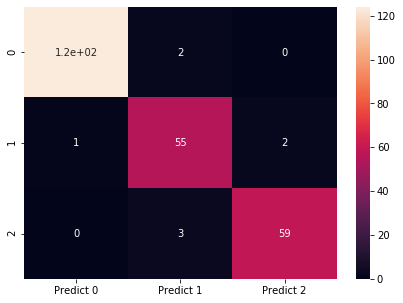

In [320]:
y_pred = svm.predict(X_test)
print(' ')
print('                Confusion Matrix ') 
cm=metrics.confusion_matrix(y_test,y_pred, labels=[0, 1, 2])

df_cm = pd.DataFrame(cm, index = [i for i in ["0","1","2"]], columns = [i for i in ["Predict 0","Predict 1","Predict 2"]])
df_cm
plt.figure(figsize = (7,5))
sns.heatmap(df_cm, annot=True)
plt.show()

In [321]:
print("                   Classification Report for SVM")
print('')
print(metrics.classification_report(y_test,y_pred, labels=[0,1,2]))

# The precision and recall for predicintg 0 & 2 is high compared to predicitng '1'

                   Classification Report for SVM

              precision    recall  f1-score   support

           0       0.99      0.98      0.99       126
           1       0.92      0.95      0.93        58
           2       0.97      0.95      0.96        62

    accuracy                           0.97       246
   macro avg       0.96      0.96      0.96       246
weighted avg       0.97      0.97      0.97       246



In [323]:
# Using the K-fold technique to find the average accuracy
scores = []

svm = SVC(C=350, break_ties=False, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma=0.01, kernel='rbf',
    max_iter=-1, probability=False, random_state=None, shrinking=True,
    tol=0.001, verbose=False)


kf = KFold(n_splits=5, shuffle=False)

for train_index, test_index in kf.split(X,Y):
    X_train, X_test, y_train, y_test = X[train_index], X[test_index], Y.iloc[train_index], Y.iloc[test_index]
    svm.fit(X_train, y_train)
    scores.append(svm.score(X_test, y_test))

In [324]:
for i in range(0,5):
    print("The score of model no {0} is: \n{1:.2f}%\n".format(i+1,scores[i]*100))

print("And the average score of K-fold Cross validation is: {0:.2f}%".format(np.mean(scores)*100))

The score of model no 1 is: 
95.12%

The score of model no 2 is: 
97.56%

The score of model no 3 is: 
97.56%

The score of model no 4 is: 
95.73%

The score of model no 5 is: 
96.93%

And the average score of K-fold Cross validation is: 96.58%


In [325]:
# The SVM model accuracy is close to 97%
# And the average accuracy is 96.58%

In [326]:
        # Using the principle component analysis technique to reduce the dimensions and prepare the model

In [327]:
# Getting the covariance matrix

covMatrix = np.cov(X,rowvar=False)
print(covMatrix)

[[ 1.00122249  0.69207867  0.79195575  0.68737073  0.08480656  0.14753459
   0.76547142 -0.2504781   0.2335111   0.16358874  0.29144051  0.36403027]
 [ 0.69207867  1.00122249  0.79878747  0.61995409  0.14476146  0.24778276
   0.80796759  0.05798829  0.14203301 -0.00859513 -0.11902518  0.03975078]
 [ 0.79195575  0.79878747  1.00122249  0.77027699  0.15685255  0.26257565
   0.86577703 -0.23001616  0.11125177  0.27329128  0.14041931  0.33399999]
 [ 0.68737073  0.61995409  0.77027699  1.00122249  0.66604757  0.45203521
   0.79875515 -0.17519253  0.04674541  0.17809473  0.37531591  0.46879466]
 [ 0.08480656  0.14476146  0.15685255  0.66604757  1.00122249  0.65227964
   0.27472698  0.16365624 -0.05836972 -0.03673329  0.23461905  0.26354613]
 [ 0.14753459  0.24778276  0.26257565  0.45203521  0.65227964  1.00122249
   0.32261886  0.30351274  0.01606853  0.04185687 -0.02798639  0.1418874 ]
 [ 0.76547142  0.80796759  0.86577703  0.79875515  0.27472698  0.32261886
   1.00122249  0.11208394  0.036

In [328]:
pca = PCA(n_components=12)
pca.fit(X)

PCA(copy=True, iterated_power='auto', n_components=12, random_state=None,
    svd_solver='auto', tol=0.0, whiten=False)

In [329]:
print('The explained variance is: \n \n',pca.explained_variance_)

The explained variance is: 
 
 [4.64944185 2.62996975 1.69693192 1.07031243 0.89804933 0.41051173
 0.27777147 0.1463322  0.13496216 0.05179586 0.03254834 0.01604288]


In [330]:
eig_vals, eig_vecs = np.linalg.eig(covMatrix)
print('\n Eigen Values \n', eig_vals,"\n")
print('Eigen Vectors \n', eig_vecs)

# I have calculated the eigen values just to cross verify the eigen values found by the PCA package. 
# They match.


 Eigen Values 
 [4.64944185 2.62996975 1.69693192 1.07031243 0.89804933 0.41051173
 0.27777147 0.13496216 0.1463322  0.01604288 0.05179586 0.03254834] 

Eigen Vectors 
 [[ 0.39115566  0.00975065 -0.26446671 -0.08892685 -0.02699387 -0.03157499
   0.64121769 -0.56441515  0.16044991 -0.0684111   0.07241223 -0.04397191]
 [ 0.34465456  0.26414437 -0.233517   -0.13726197 -0.16568852  0.17343547
  -0.38051001  0.12367942  0.70274907  0.04525317 -0.13455163 -0.08027883]
 [ 0.41690614  0.08775358 -0.21884222  0.09393863 -0.03159482  0.18840121
  -0.24851447  0.0494671  -0.447887    0.07966818  0.50674187 -0.4442245 ]
 [ 0.43218612  0.03256762  0.17958288  0.02803783 -0.07218101 -0.32449809
  -0.13436679 -0.11538342 -0.20816635  0.66437747 -0.26155974  0.28999545]
 [ 0.20582883  0.07764781  0.63464702 -0.06449094  0.00631365 -0.40241646
  -0.2416864  -0.27479796  0.12223959 -0.41137075  0.16423699 -0.19396413]
 [ 0.19354523  0.21060796  0.51193657 -0.04743891  0.23670369  0.69432592
   0.193365

In [331]:
print(pca.explained_variance_ratio_)

[0.38698041 0.21889655 0.14123833 0.0890838  0.07474607 0.03416754
 0.02311936 0.01217946 0.01123311 0.00431105 0.00270905 0.00133527]


In [332]:
print('The cumulative explained variance is: \n\n',np.cumsum(pca.explained_variance_ratio_))

# It is clear that 95% of the variance is explained by 7 components itself

The cumulative explained variance is: 

 [0.38698041 0.60587695 0.74711528 0.83619908 0.91094515 0.94511269
 0.96823205 0.98041151 0.99164463 0.99595568 0.99866473 1.        ]


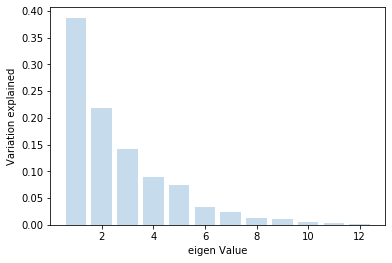

In [333]:
plt.bar(list(range(1,13)),pca.explained_variance_ratio_,alpha=0.25, align='center')
plt.ylabel('Variation explained')
plt.xlabel('eigen Value')
plt.show()

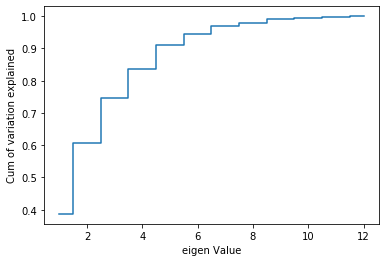

In [334]:
plt.step(list(range(1,13)),np.cumsum(pca.explained_variance_ratio_), where='mid')
plt.ylabel('Cum of variation explained')
plt.xlabel('eigen Value')
plt.show()

# From the below graph and the cumulative sum of the variance explained, it is clear that 
# 95% of the variance is explained with 7 components

In [335]:
# Transforming the independent variables with 7 components
pca = PCA(n_components=7)
pca.fit(X)
print(pca.components_)
print(pca.explained_variance_)

# decomposing the dataset with just 7 components

[[ 0.39115566  0.34465456  0.41690614  0.43218612  0.20582883  0.19354523
   0.3939194  -0.13008686  0.07305815  0.11272932  0.18616489  0.25098169]
 [ 0.00975065  0.26414437  0.08775358  0.03256762  0.07764781  0.21060796
   0.25158059  0.54310327 -0.05697241 -0.07371631 -0.51864627 -0.4848284 ]
 [-0.26446671 -0.233517   -0.21884222  0.17958288  0.63464702  0.51193657
  -0.13274951  0.15986096 -0.17882287 -0.10177658  0.15172129  0.14831029]
 [ 0.08892685  0.13726197 -0.09393863 -0.02803783  0.06449094  0.04743891
  -0.09033867  0.00807828  0.67404133 -0.69862749  0.0807421  -0.00856413]
 [-0.02699387 -0.16568852 -0.03159482 -0.07218101  0.00631365  0.23670369
  -0.07504864  0.13482972  0.67990165  0.64742895 -0.0652936   0.00605979]
 [-0.03157499  0.17343547  0.18840121 -0.32449809 -0.40241646  0.69432592
  -0.17842954 -0.20719097 -0.12734228 -0.09717939 -0.17211101  0.23249591]
 [ 0.64121769 -0.38051001 -0.24851447 -0.13436679 -0.2416864   0.19336586
   0.16684491  0.35293048 -0.121

In [336]:
X_pca = pca.transform(X)
X_pca.shape
# Transformed into 7 components

(819, 7)

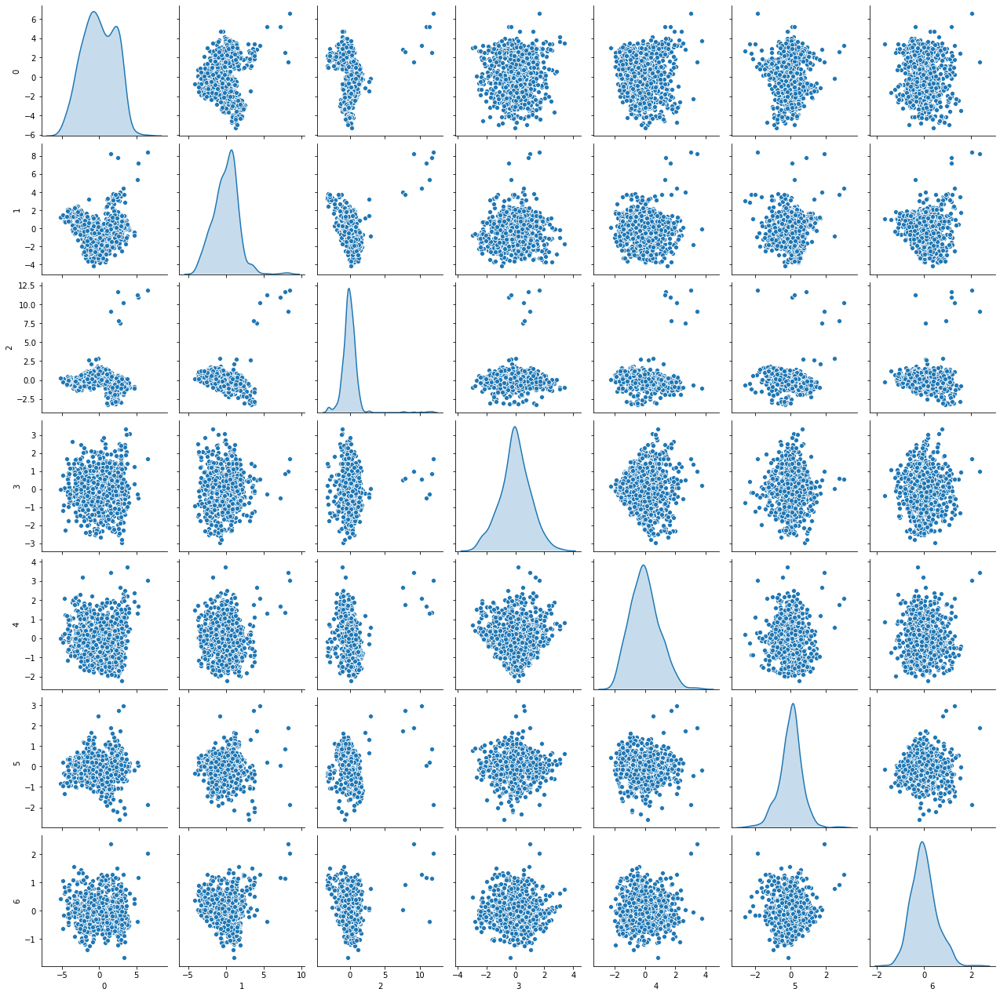

In [354]:
sns.pairplot(pd.DataFrame(X_pca),diag_kind='kde')

# Now the independent variables are not so correlelated with eachother like before

In [339]:
X_train,X_test,y_train,y_test = train_test_split(X_pca,Y,random_state=10,test_size=0.3)
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

# splitting the independent variables and target variable as train and test set

(573, 7)
(246, 7)
(573,)
(246,)


In [340]:
param_grid = {'C': [0.1,0.5,0.75, 1,5, 10,20,30,50,75,100,200,300,350,400,500,1000],  
              'gamma': [5,1,0.75,0.5, 0.1, 0.01, 0.001, 0.0001,'auto','scale'], 
              'kernel': ['linear', 'poly', 'rbf', 'sigmoid']}  
grid = GridSearchCV(SVC(), param_grid, refit = True, verbose = 3) 
grid.fit(X_train,y_train)

Fitting 5 folds for each of 680 candidates, totalling 3400 fits
[CV] C=0.1, gamma=5, kernel=linear ...................................
[CV] ....... C=0.1, gamma=5, kernel=linear, score=0.757, total=   0.0s
[CV] C=0.1, gamma=5, kernel=linear ...................................
[CV] ....... C=0.1, gamma=5, kernel=linear, score=0.783, total=   0.0s
[CV] C=0.1, gamma=5, kernel=linear ...................................
[CV] ....... C=0.1, gamma=5, kernel=linear, score=0.791, total=   0.0s
[CV] C=0.1, gamma=5, kernel=linear ...................................
[CV] ....... C=0.1, gamma=5, kernel=linear, score=0.789, total=   0.0s
[CV] C=0.1, gamma=5, kernel=linear ...................................
[CV] ....... C=0.1, gamma=5, kernel=linear, score=0.816, total=   0.0s
[CV] C=0.1, gamma=5, kernel=poly .....................................


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


[CV] ......... C=0.1, gamma=5, kernel=poly, score=0.730, total=   0.3s
[CV] C=0.1, gamma=5, kernel=poly .....................................
[CV] ......... C=0.1, gamma=5, kernel=poly, score=0.835, total=   0.4s
[CV] C=0.1, gamma=5, kernel=poly .....................................
[CV] ......... C=0.1, gamma=5, kernel=poly, score=0.774, total=   0.5s
[CV] C=0.1, gamma=5, kernel=poly .....................................
[CV] ......... C=0.1, gamma=5, kernel=poly, score=0.842, total=   0.7s
[CV] C=0.1, gamma=5, kernel=poly .....................................
[CV] ......... C=0.1, gamma=5, kernel=poly, score=0.930, total=   0.8s
[CV] C=0.1, gamma=5, kernel=rbf ......................................
[CV] .......... C=0.1, gamma=5, kernel=rbf, score=0.504, total=   0.0s
[CV] C=0.1, gamma=5, kernel=rbf ......................................
[CV] .......... C=0.1, gamma=5, kernel=rbf, score=0.504, total=   0.0s
[CV] C=0.1, gamma=5, kernel=rbf ......................................
[CV] .

[CV] ....... C=0.1, gamma=0.5, kernel=poly, score=0.904, total=   0.0s
[CV] C=0.1, gamma=0.5, kernel=rbf ....................................
[CV] ........ C=0.1, gamma=0.5, kernel=rbf, score=0.539, total=   0.0s
[CV] C=0.1, gamma=0.5, kernel=rbf ....................................
[CV] ........ C=0.1, gamma=0.5, kernel=rbf, score=0.565, total=   0.0s
[CV] C=0.1, gamma=0.5, kernel=rbf ....................................
[CV] ........ C=0.1, gamma=0.5, kernel=rbf, score=0.565, total=   0.0s
[CV] C=0.1, gamma=0.5, kernel=rbf ....................................
[CV] ........ C=0.1, gamma=0.5, kernel=rbf, score=0.561, total=   0.0s
[CV] C=0.1, gamma=0.5, kernel=rbf ....................................
[CV] ........ C=0.1, gamma=0.5, kernel=rbf, score=0.553, total=   0.0s
[CV] C=0.1, gamma=0.5, kernel=sigmoid ................................
[CV] .... C=0.1, gamma=0.5, kernel=sigmoid, score=0.539, total=   0.0s
[CV] C=0.1, gamma=0.5, kernel=sigmoid ................................
[CV] .

[CV] C=0.1, gamma=0.001, kernel=rbf ..................................
[CV] ...... C=0.1, gamma=0.001, kernel=rbf, score=0.504, total=   0.0s
[CV] C=0.1, gamma=0.001, kernel=rbf ..................................
[CV] ...... C=0.1, gamma=0.001, kernel=rbf, score=0.509, total=   0.0s
[CV] C=0.1, gamma=0.001, kernel=rbf ..................................
[CV] ...... C=0.1, gamma=0.001, kernel=rbf, score=0.500, total=   0.0s
[CV] C=0.1, gamma=0.001, kernel=sigmoid ..............................
[CV] .. C=0.1, gamma=0.001, kernel=sigmoid, score=0.504, total=   0.0s
[CV] C=0.1, gamma=0.001, kernel=sigmoid ..............................
[CV] .. C=0.1, gamma=0.001, kernel=sigmoid, score=0.504, total=   0.0s
[CV] C=0.1, gamma=0.001, kernel=sigmoid ..............................
[CV] .. C=0.1, gamma=0.001, kernel=sigmoid, score=0.504, total=   0.0s
[CV] C=0.1, gamma=0.001, kernel=sigmoid ..............................
[CV] .. C=0.1, gamma=0.001, kernel=sigmoid, score=0.509, total=   0.0s
[CV] C

[CV] ...... C=0.1, gamma=scale, kernel=rbf, score=0.781, total=   0.0s
[CV] C=0.1, gamma=scale, kernel=rbf ..................................
[CV] ...... C=0.1, gamma=scale, kernel=rbf, score=0.746, total=   0.0s
[CV] C=0.1, gamma=scale, kernel=sigmoid ..............................
[CV] .. C=0.1, gamma=scale, kernel=sigmoid, score=0.565, total=   0.0s
[CV] C=0.1, gamma=scale, kernel=sigmoid ..............................
[CV] .. C=0.1, gamma=scale, kernel=sigmoid, score=0.574, total=   0.0s
[CV] C=0.1, gamma=scale, kernel=sigmoid ..............................
[CV] .. C=0.1, gamma=scale, kernel=sigmoid, score=0.617, total=   0.0s
[CV] C=0.1, gamma=scale, kernel=sigmoid ..............................
[CV] .. C=0.1, gamma=scale, kernel=sigmoid, score=0.693, total=   0.0s
[CV] C=0.1, gamma=scale, kernel=sigmoid ..............................
[CV] .. C=0.1, gamma=scale, kernel=sigmoid, score=0.596, total=   0.0s
[CV] C=0.5, gamma=5, kernel=linear ...................................
[CV] .

[CV] ... C=0.5, gamma=0.75, kernel=sigmoid, score=0.579, total=   0.0s
[CV] C=0.5, gamma=0.75, kernel=sigmoid ...............................
[CV] ... C=0.5, gamma=0.75, kernel=sigmoid, score=0.509, total=   0.0s
[CV] C=0.5, gamma=0.5, kernel=linear .................................
[CV] ..... C=0.5, gamma=0.5, kernel=linear, score=0.757, total=   0.0s
[CV] C=0.5, gamma=0.5, kernel=linear .................................
[CV] ..... C=0.5, gamma=0.5, kernel=linear, score=0.774, total=   0.0s
[CV] C=0.5, gamma=0.5, kernel=linear .................................
[CV] ..... C=0.5, gamma=0.5, kernel=linear, score=0.757, total=   0.0s
[CV] C=0.5, gamma=0.5, kernel=linear .................................
[CV] ..... C=0.5, gamma=0.5, kernel=linear, score=0.807, total=   0.0s
[CV] C=0.5, gamma=0.5, kernel=linear .................................
[CV] ..... C=0.5, gamma=0.5, kernel=linear, score=0.842, total=   0.0s
[CV] C=0.5, gamma=0.5, kernel=poly ...................................
[CV] .

[CV] ... C=0.5, gamma=0.001, kernel=linear, score=0.757, total=   0.0s
[CV] C=0.5, gamma=0.001, kernel=linear ...............................
[CV] ... C=0.5, gamma=0.001, kernel=linear, score=0.807, total=   0.0s
[CV] C=0.5, gamma=0.001, kernel=linear ...............................
[CV] ... C=0.5, gamma=0.001, kernel=linear, score=0.842, total=   0.0s
[CV] C=0.5, gamma=0.001, kernel=poly .................................
[CV] ..... C=0.5, gamma=0.001, kernel=poly, score=0.504, total=   0.0s
[CV] C=0.5, gamma=0.001, kernel=poly .................................
[CV] ..... C=0.5, gamma=0.001, kernel=poly, score=0.504, total=   0.0s
[CV] C=0.5, gamma=0.001, kernel=poly .................................
[CV] ..... C=0.5, gamma=0.001, kernel=poly, score=0.504, total=   0.0s
[CV] C=0.5, gamma=0.001, kernel=poly .................................
[CV] ..... C=0.5, gamma=0.001, kernel=poly, score=0.509, total=   0.0s
[CV] C=0.5, gamma=0.001, kernel=poly .................................
[CV] .

[CV] ..... C=0.5, gamma=scale, kernel=poly, score=0.617, total=   0.0s
[CV] C=0.5, gamma=scale, kernel=poly .................................
[CV] ..... C=0.5, gamma=scale, kernel=poly, score=0.635, total=   0.0s
[CV] C=0.5, gamma=scale, kernel=poly .................................
[CV] ..... C=0.5, gamma=scale, kernel=poly, score=0.591, total=   0.0s
[CV] C=0.5, gamma=scale, kernel=poly .................................
[CV] ..... C=0.5, gamma=scale, kernel=poly, score=0.675, total=   0.0s
[CV] C=0.5, gamma=scale, kernel=poly .................................
[CV] ..... C=0.5, gamma=scale, kernel=poly, score=0.623, total=   0.0s
[CV] C=0.5, gamma=scale, kernel=rbf ..................................
[CV] ...... C=0.5, gamma=scale, kernel=rbf, score=0.887, total=   0.0s
[CV] C=0.5, gamma=scale, kernel=rbf ..................................
[CV] ...... C=0.5, gamma=scale, kernel=rbf, score=0.826, total=   0.0s
[CV] C=0.5, gamma=scale, kernel=rbf ..................................
[CV] .

[CV] ..... C=0.75, gamma=0.75, kernel=poly, score=0.757, total=   0.1s
[CV] C=0.75, gamma=0.75, kernel=poly .................................
[CV] ..... C=0.75, gamma=0.75, kernel=poly, score=0.809, total=   0.1s
[CV] C=0.75, gamma=0.75, kernel=poly .................................
[CV] ..... C=0.75, gamma=0.75, kernel=poly, score=0.826, total=   0.1s
[CV] C=0.75, gamma=0.75, kernel=poly .................................
[CV] ..... C=0.75, gamma=0.75, kernel=poly, score=0.877, total=   0.2s
[CV] C=0.75, gamma=0.75, kernel=poly .................................
[CV] ..... C=0.75, gamma=0.75, kernel=poly, score=0.912, total=   0.2s
[CV] C=0.75, gamma=0.75, kernel=rbf ..................................
[CV] ...... C=0.75, gamma=0.75, kernel=rbf, score=0.826, total=   0.0s
[CV] C=0.75, gamma=0.75, kernel=rbf ..................................
[CV] ...... C=0.75, gamma=0.75, kernel=rbf, score=0.826, total=   0.0s
[CV] C=0.75, gamma=0.75, kernel=rbf ..................................
[CV] .

[CV] ..... C=0.75, gamma=0.01, kernel=poly, score=0.518, total=   0.0s
[CV] C=0.75, gamma=0.01, kernel=poly .................................
[CV] ..... C=0.75, gamma=0.01, kernel=poly, score=0.500, total=   0.0s
[CV] C=0.75, gamma=0.01, kernel=rbf ..................................
[CV] ...... C=0.75, gamma=0.01, kernel=rbf, score=0.774, total=   0.0s
[CV] C=0.75, gamma=0.01, kernel=rbf ..................................
[CV] ...... C=0.75, gamma=0.01, kernel=rbf, score=0.765, total=   0.0s
[CV] C=0.75, gamma=0.01, kernel=rbf ..................................
[CV] ...... C=0.75, gamma=0.01, kernel=rbf, score=0.791, total=   0.0s
[CV] C=0.75, gamma=0.01, kernel=rbf ..................................
[CV] ...... C=0.75, gamma=0.01, kernel=rbf, score=0.842, total=   0.0s
[CV] C=0.75, gamma=0.01, kernel=rbf ..................................
[CV] ...... C=0.75, gamma=0.01, kernel=rbf, score=0.781, total=   0.0s
[CV] C=0.75, gamma=0.01, kernel=sigmoid ..............................
[CV] .

[CV] ...... C=0.75, gamma=auto, kernel=rbf, score=0.887, total=   0.0s
[CV] C=0.75, gamma=auto, kernel=rbf ..................................
[CV] ...... C=0.75, gamma=auto, kernel=rbf, score=0.912, total=   0.0s
[CV] C=0.75, gamma=auto, kernel=rbf ..................................
[CV] ...... C=0.75, gamma=auto, kernel=rbf, score=0.886, total=   0.0s
[CV] C=0.75, gamma=auto, kernel=sigmoid ..............................
[CV] .. C=0.75, gamma=auto, kernel=sigmoid, score=0.635, total=   0.0s
[CV] C=0.75, gamma=auto, kernel=sigmoid ..............................
[CV] .. C=0.75, gamma=auto, kernel=sigmoid, score=0.565, total=   0.0s
[CV] C=0.75, gamma=auto, kernel=sigmoid ..............................
[CV] .. C=0.75, gamma=auto, kernel=sigmoid, score=0.591, total=   0.0s
[CV] C=0.75, gamma=auto, kernel=sigmoid ..............................
[CV] .. C=0.75, gamma=auto, kernel=sigmoid, score=0.561, total=   0.0s
[CV] C=0.75, gamma=auto, kernel=sigmoid ..............................
[CV] .

[CV] ........ C=1, gamma=1, kernel=sigmoid, score=0.452, total=   0.0s
[CV] C=1, gamma=1, kernel=sigmoid ....................................
[CV] ........ C=1, gamma=1, kernel=sigmoid, score=0.487, total=   0.0s
[CV] C=1, gamma=1, kernel=sigmoid ....................................
[CV] ........ C=1, gamma=1, kernel=sigmoid, score=0.579, total=   0.0s
[CV] C=1, gamma=1, kernel=sigmoid ....................................
[CV] ........ C=1, gamma=1, kernel=sigmoid, score=0.456, total=   0.0s
[CV] C=1, gamma=0.75, kernel=linear ..................................
[CV] ...... C=1, gamma=0.75, kernel=linear, score=0.757, total=   0.0s
[CV] C=1, gamma=0.75, kernel=linear ..................................
[CV] ...... C=1, gamma=0.75, kernel=linear, score=0.800, total=   0.0s
[CV] C=1, gamma=0.75, kernel=linear ..................................
[CV] ...... C=1, gamma=0.75, kernel=linear, score=0.774, total=   0.0s
[CV] C=1, gamma=0.75, kernel=linear ..................................
[CV] .

[CV] ...... C=1, gamma=0.1, kernel=sigmoid, score=0.591, total=   0.0s
[CV] C=1, gamma=0.1, kernel=sigmoid ..................................
[CV] ...... C=1, gamma=0.1, kernel=sigmoid, score=0.643, total=   0.0s
[CV] C=1, gamma=0.1, kernel=sigmoid ..................................
[CV] ...... C=1, gamma=0.1, kernel=sigmoid, score=0.649, total=   0.0s
[CV] C=1, gamma=0.1, kernel=sigmoid ..................................
[CV] ...... C=1, gamma=0.1, kernel=sigmoid, score=0.640, total=   0.0s
[CV] C=1, gamma=0.01, kernel=linear ..................................
[CV] ...... C=1, gamma=0.01, kernel=linear, score=0.757, total=   0.0s
[CV] C=1, gamma=0.01, kernel=linear ..................................
[CV] ...... C=1, gamma=0.01, kernel=linear, score=0.800, total=   0.0s
[CV] C=1, gamma=0.01, kernel=linear ..................................
[CV] ...... C=1, gamma=0.01, kernel=linear, score=0.774, total=   0.0s
[CV] C=1, gamma=0.01, kernel=linear ..................................
[CV] .

[CV] ...... C=1, gamma=auto, kernel=linear, score=0.774, total=   0.0s
[CV] C=1, gamma=auto, kernel=linear ..................................
[CV] ...... C=1, gamma=auto, kernel=linear, score=0.807, total=   0.0s
[CV] C=1, gamma=auto, kernel=linear ..................................
[CV] ...... C=1, gamma=auto, kernel=linear, score=0.842, total=   0.0s
[CV] C=1, gamma=auto, kernel=poly ....................................
[CV] ........ C=1, gamma=auto, kernel=poly, score=0.783, total=   0.0s
[CV] C=1, gamma=auto, kernel=poly ....................................
[CV] ........ C=1, gamma=auto, kernel=poly, score=0.791, total=   0.0s
[CV] C=1, gamma=auto, kernel=poly ....................................
[CV] ........ C=1, gamma=auto, kernel=poly, score=0.826, total=   0.0s
[CV] C=1, gamma=auto, kernel=poly ....................................
[CV] ........ C=1, gamma=auto, kernel=poly, score=0.886, total=   0.0s
[CV] C=1, gamma=auto, kernel=poly ....................................
[CV] .

[CV] ......... C=5, gamma=1, kernel=linear, score=0.730, total=   0.0s
[CV] C=5, gamma=1, kernel=linear .....................................
[CV] ......... C=5, gamma=1, kernel=linear, score=0.798, total=   0.0s
[CV] C=5, gamma=1, kernel=linear .....................................
[CV] ......... C=5, gamma=1, kernel=linear, score=0.833, total=   0.0s
[CV] C=5, gamma=1, kernel=poly .......................................
[CV] ........... C=5, gamma=1, kernel=poly, score=0.739, total=   0.2s
[CV] C=5, gamma=1, kernel=poly .......................................
[CV] ........... C=5, gamma=1, kernel=poly, score=0.843, total=   0.4s
[CV] C=5, gamma=1, kernel=poly .......................................
[CV] ........... C=5, gamma=1, kernel=poly, score=0.809, total=   0.3s
[CV] C=5, gamma=1, kernel=poly .......................................
[CV] ........... C=5, gamma=1, kernel=poly, score=0.860, total=   0.5s
[CV] C=5, gamma=1, kernel=poly .......................................
[CV] .

[CV] ....... C=5, gamma=0.1, kernel=linear, score=0.833, total=   0.0s
[CV] C=5, gamma=0.1, kernel=poly .....................................
[CV] ......... C=5, gamma=0.1, kernel=poly, score=0.783, total=   0.0s
[CV] C=5, gamma=0.1, kernel=poly .....................................
[CV] ......... C=5, gamma=0.1, kernel=poly, score=0.809, total=   0.0s
[CV] C=5, gamma=0.1, kernel=poly .....................................
[CV] ......... C=5, gamma=0.1, kernel=poly, score=0.817, total=   0.0s
[CV] C=5, gamma=0.1, kernel=poly .....................................
[CV] ......... C=5, gamma=0.1, kernel=poly, score=0.895, total=   0.0s
[CV] C=5, gamma=0.1, kernel=poly .....................................
[CV] ......... C=5, gamma=0.1, kernel=poly, score=0.860, total=   0.0s
[CV] C=5, gamma=0.1, kernel=rbf ......................................
[CV] .......... C=5, gamma=0.1, kernel=rbf, score=0.922, total=   0.0s
[CV] C=5, gamma=0.1, kernel=rbf ......................................
[CV] .

[CV] ....... C=5, gamma=0.0001, kernel=rbf, score=0.504, total=   0.0s
[CV] C=5, gamma=0.0001, kernel=rbf ...................................
[CV] ....... C=5, gamma=0.0001, kernel=rbf, score=0.504, total=   0.0s
[CV] C=5, gamma=0.0001, kernel=rbf ...................................
[CV] ....... C=5, gamma=0.0001, kernel=rbf, score=0.504, total=   0.0s
[CV] C=5, gamma=0.0001, kernel=rbf ...................................
[CV] ....... C=5, gamma=0.0001, kernel=rbf, score=0.509, total=   0.0s
[CV] C=5, gamma=0.0001, kernel=rbf ...................................
[CV] ....... C=5, gamma=0.0001, kernel=rbf, score=0.500, total=   0.0s
[CV] C=5, gamma=0.0001, kernel=sigmoid ...............................
[CV] ... C=5, gamma=0.0001, kernel=sigmoid, score=0.504, total=   0.0s
[CV] C=5, gamma=0.0001, kernel=sigmoid ...............................
[CV] ... C=5, gamma=0.0001, kernel=sigmoid, score=0.504, total=   0.0s
[CV] C=5, gamma=0.0001, kernel=sigmoid ...............................
[CV] .

[CV] .......... C=10, gamma=5, kernel=poly, score=0.842, total=   2.1s
[CV] C=10, gamma=5, kernel=poly ......................................
[CV] .......... C=10, gamma=5, kernel=poly, score=0.904, total=   5.7s
[CV] C=10, gamma=5, kernel=rbf .......................................
[CV] ........... C=10, gamma=5, kernel=rbf, score=0.548, total=   0.0s
[CV] C=10, gamma=5, kernel=rbf .......................................
[CV] ........... C=10, gamma=5, kernel=rbf, score=0.583, total=   0.0s
[CV] C=10, gamma=5, kernel=rbf .......................................
[CV] ........... C=10, gamma=5, kernel=rbf, score=0.583, total=   0.0s
[CV] C=10, gamma=5, kernel=rbf .......................................
[CV] ........... C=10, gamma=5, kernel=rbf, score=0.588, total=   0.0s
[CV] C=10, gamma=5, kernel=rbf .......................................
[CV] ........... C=10, gamma=5, kernel=rbf, score=0.553, total=   0.0s
[CV] C=10, gamma=5, kernel=sigmoid ...................................
[CV] .

[CV] ........ C=10, gamma=0.5, kernel=poly, score=0.817, total=   0.3s
[CV] C=10, gamma=0.5, kernel=poly ....................................
[CV] ........ C=10, gamma=0.5, kernel=poly, score=0.800, total=   0.2s
[CV] C=10, gamma=0.5, kernel=poly ....................................
[CV] ........ C=10, gamma=0.5, kernel=poly, score=0.868, total=   0.4s
[CV] C=10, gamma=0.5, kernel=poly ....................................
[CV] ........ C=10, gamma=0.5, kernel=poly, score=0.912, total=   0.4s
[CV] C=10, gamma=0.5, kernel=rbf .....................................
[CV] ......... C=10, gamma=0.5, kernel=rbf, score=0.861, total=   0.0s
[CV] C=10, gamma=0.5, kernel=rbf .....................................
[CV] ......... C=10, gamma=0.5, kernel=rbf, score=0.861, total=   0.0s
[CV] C=10, gamma=0.5, kernel=rbf .....................................
[CV] ......... C=10, gamma=0.5, kernel=rbf, score=0.878, total=   0.0s
[CV] C=10, gamma=0.5, kernel=rbf .....................................
[CV] .

[CV] ....... C=10, gamma=0.001, kernel=rbf, score=0.757, total=   0.0s
[CV] C=10, gamma=0.001, kernel=rbf ...................................
[CV] ....... C=10, gamma=0.001, kernel=rbf, score=0.757, total=   0.0s
[CV] C=10, gamma=0.001, kernel=rbf ...................................
[CV] ....... C=10, gamma=0.001, kernel=rbf, score=0.783, total=   0.0s
[CV] C=10, gamma=0.001, kernel=rbf ...................................
[CV] ....... C=10, gamma=0.001, kernel=rbf, score=0.789, total=   0.0s
[CV] C=10, gamma=0.001, kernel=rbf ...................................
[CV] ....... C=10, gamma=0.001, kernel=rbf, score=0.754, total=   0.0s
[CV] C=10, gamma=0.001, kernel=sigmoid ...............................
[CV] ... C=10, gamma=0.001, kernel=sigmoid, score=0.661, total=   0.0s
[CV] C=10, gamma=0.001, kernel=sigmoid ...............................
[CV] ... C=10, gamma=0.001, kernel=sigmoid, score=0.687, total=   0.0s
[CV] C=10, gamma=0.001, kernel=sigmoid ...............................
[CV] .

[CV] ... C=10, gamma=scale, kernel=sigmoid, score=0.588, total=   0.0s
[CV] C=10, gamma=scale, kernel=sigmoid ...............................
[CV] ... C=10, gamma=scale, kernel=sigmoid, score=0.623, total=   0.0s
[CV] C=20, gamma=5, kernel=linear ....................................
[CV] ........ C=20, gamma=5, kernel=linear, score=0.757, total=   0.1s
[CV] C=20, gamma=5, kernel=linear ....................................
[CV] ........ C=20, gamma=5, kernel=linear, score=0.783, total=   0.1s
[CV] C=20, gamma=5, kernel=linear ....................................
[CV] ........ C=20, gamma=5, kernel=linear, score=0.730, total=   0.1s
[CV] C=20, gamma=5, kernel=linear ....................................
[CV] ........ C=20, gamma=5, kernel=linear, score=0.789, total=   0.1s
[CV] C=20, gamma=5, kernel=linear ....................................
[CV] ........ C=20, gamma=5, kernel=linear, score=0.833, total=   0.1s
[CV] C=20, gamma=5, kernel=poly ......................................
[CV] .

[CV] .... C=20, gamma=0.75, kernel=sigmoid, score=0.487, total=   0.0s
[CV] C=20, gamma=0.75, kernel=sigmoid ................................
[CV] .... C=20, gamma=0.75, kernel=sigmoid, score=0.478, total=   0.0s
[CV] C=20, gamma=0.75, kernel=sigmoid ................................
[CV] .... C=20, gamma=0.75, kernel=sigmoid, score=0.605, total=   0.0s
[CV] C=20, gamma=0.75, kernel=sigmoid ................................
[CV] .... C=20, gamma=0.75, kernel=sigmoid, score=0.439, total=   0.0s
[CV] C=20, gamma=0.5, kernel=linear ..................................
[CV] ...... C=20, gamma=0.5, kernel=linear, score=0.757, total=   0.1s
[CV] C=20, gamma=0.5, kernel=linear ..................................
[CV] ...... C=20, gamma=0.5, kernel=linear, score=0.783, total=   0.1s
[CV] C=20, gamma=0.5, kernel=linear ..................................
[CV] ...... C=20, gamma=0.5, kernel=linear, score=0.730, total=   0.1s
[CV] C=20, gamma=0.5, kernel=linear ..................................
[CV] .

[CV] .... C=20, gamma=0.01, kernel=sigmoid, score=0.807, total=   0.0s
[CV] C=20, gamma=0.001, kernel=linear ................................
[CV] .... C=20, gamma=0.001, kernel=linear, score=0.757, total=   0.1s
[CV] C=20, gamma=0.001, kernel=linear ................................
[CV] .... C=20, gamma=0.001, kernel=linear, score=0.783, total=   0.1s
[CV] C=20, gamma=0.001, kernel=linear ................................
[CV] .... C=20, gamma=0.001, kernel=linear, score=0.730, total=   0.1s
[CV] C=20, gamma=0.001, kernel=linear ................................
[CV] .... C=20, gamma=0.001, kernel=linear, score=0.789, total=   0.1s
[CV] C=20, gamma=0.001, kernel=linear ................................
[CV] .... C=20, gamma=0.001, kernel=linear, score=0.833, total=   0.1s
[CV] C=20, gamma=0.001, kernel=poly ..................................
[CV] ...... C=20, gamma=0.001, kernel=poly, score=0.504, total=   0.0s
[CV] C=20, gamma=0.001, kernel=poly ..................................
[CV] .

[CV] .... C=20, gamma=scale, kernel=linear, score=0.757, total=   0.1s
[CV] C=20, gamma=scale, kernel=linear ................................
[CV] .... C=20, gamma=scale, kernel=linear, score=0.783, total=   0.1s
[CV] C=20, gamma=scale, kernel=linear ................................
[CV] .... C=20, gamma=scale, kernel=linear, score=0.730, total=   0.1s
[CV] C=20, gamma=scale, kernel=linear ................................
[CV] .... C=20, gamma=scale, kernel=linear, score=0.789, total=   0.1s
[CV] C=20, gamma=scale, kernel=linear ................................
[CV] .... C=20, gamma=scale, kernel=linear, score=0.833, total=   0.1s
[CV] C=20, gamma=scale, kernel=poly ..................................
[CV] ...... C=20, gamma=scale, kernel=poly, score=0.800, total=   0.0s
[CV] C=20, gamma=scale, kernel=poly ..................................
[CV] ...... C=20, gamma=scale, kernel=poly, score=0.809, total=   0.0s
[CV] C=20, gamma=scale, kernel=poly ..................................
[CV] .

[CV] ..... C=30, gamma=0.75, kernel=linear, score=0.783, total=   0.1s
[CV] C=30, gamma=0.75, kernel=linear .................................
[CV] ..... C=30, gamma=0.75, kernel=linear, score=0.730, total=   0.1s
[CV] C=30, gamma=0.75, kernel=linear .................................
[CV] ..... C=30, gamma=0.75, kernel=linear, score=0.789, total=   0.1s
[CV] C=30, gamma=0.75, kernel=linear .................................
[CV] ..... C=30, gamma=0.75, kernel=linear, score=0.833, total=   0.1s
[CV] C=30, gamma=0.75, kernel=poly ...................................
[CV] ....... C=30, gamma=0.75, kernel=poly, score=0.730, total=   0.3s
[CV] C=30, gamma=0.75, kernel=poly ...................................
[CV] ....... C=30, gamma=0.75, kernel=poly, score=0.835, total=   0.4s
[CV] C=30, gamma=0.75, kernel=poly ...................................
[CV] ....... C=30, gamma=0.75, kernel=poly, score=0.774, total=   0.6s
[CV] C=30, gamma=0.75, kernel=poly ...................................
[CV] .

[CV] ..... C=30, gamma=0.01, kernel=linear, score=0.757, total=   0.1s
[CV] C=30, gamma=0.01, kernel=linear .................................
[CV] ..... C=30, gamma=0.01, kernel=linear, score=0.783, total=   0.1s
[CV] C=30, gamma=0.01, kernel=linear .................................
[CV] ..... C=30, gamma=0.01, kernel=linear, score=0.730, total=   0.1s
[CV] C=30, gamma=0.01, kernel=linear .................................
[CV] ..... C=30, gamma=0.01, kernel=linear, score=0.789, total=   0.1s
[CV] C=30, gamma=0.01, kernel=linear .................................
[CV] ..... C=30, gamma=0.01, kernel=linear, score=0.833, total=   0.1s
[CV] C=30, gamma=0.01, kernel=poly ...................................
[CV] ....... C=30, gamma=0.01, kernel=poly, score=0.530, total=   0.0s
[CV] C=30, gamma=0.01, kernel=poly ...................................
[CV] ....... C=30, gamma=0.01, kernel=poly, score=0.513, total=   0.0s
[CV] C=30, gamma=0.01, kernel=poly ...................................
[CV] .

[CV] ..... C=30, gamma=auto, kernel=linear, score=0.757, total=   0.1s
[CV] C=30, gamma=auto, kernel=linear .................................
[CV] ..... C=30, gamma=auto, kernel=linear, score=0.783, total=   0.1s
[CV] C=30, gamma=auto, kernel=linear .................................
[CV] ..... C=30, gamma=auto, kernel=linear, score=0.730, total=   0.1s
[CV] C=30, gamma=auto, kernel=linear .................................
[CV] ..... C=30, gamma=auto, kernel=linear, score=0.789, total=   0.1s
[CV] C=30, gamma=auto, kernel=linear .................................
[CV] ..... C=30, gamma=auto, kernel=linear, score=0.833, total=   0.1s
[CV] C=30, gamma=auto, kernel=poly ...................................
[CV] ....... C=30, gamma=auto, kernel=poly, score=0.783, total=   0.1s
[CV] C=30, gamma=auto, kernel=poly ...................................
[CV] ....... C=30, gamma=auto, kernel=poly, score=0.809, total=   0.1s
[CV] C=30, gamma=auto, kernel=poly ...................................
[CV] .

[CV] ........ C=50, gamma=1, kernel=linear, score=0.783, total=   0.2s
[CV] C=50, gamma=1, kernel=linear ....................................
[CV] ........ C=50, gamma=1, kernel=linear, score=0.730, total=   0.2s
[CV] C=50, gamma=1, kernel=linear ....................................
[CV] ........ C=50, gamma=1, kernel=linear, score=0.789, total=   0.1s
[CV] C=50, gamma=1, kernel=linear ....................................
[CV] ........ C=50, gamma=1, kernel=linear, score=0.833, total=   0.2s
[CV] C=50, gamma=1, kernel=poly ......................................
[CV] .......... C=50, gamma=1, kernel=poly, score=0.722, total=   0.3s
[CV] C=50, gamma=1, kernel=poly ......................................
[CV] .......... C=50, gamma=1, kernel=poly, score=0.835, total=   0.7s
[CV] C=50, gamma=1, kernel=poly ......................................
[CV] .......... C=50, gamma=1, kernel=poly, score=0.783, total=   0.4s
[CV] C=50, gamma=1, kernel=poly ......................................
[CV] .

[CV] ...... C=50, gamma=0.1, kernel=linear, score=0.783, total=   0.2s
[CV] C=50, gamma=0.1, kernel=linear ..................................
[CV] ...... C=50, gamma=0.1, kernel=linear, score=0.730, total=   0.2s
[CV] C=50, gamma=0.1, kernel=linear ..................................
[CV] ...... C=50, gamma=0.1, kernel=linear, score=0.789, total=   0.1s
[CV] C=50, gamma=0.1, kernel=linear ..................................
[CV] ...... C=50, gamma=0.1, kernel=linear, score=0.833, total=   0.2s
[CV] C=50, gamma=0.1, kernel=poly ....................................
[CV] ........ C=50, gamma=0.1, kernel=poly, score=0.809, total=   0.0s
[CV] C=50, gamma=0.1, kernel=poly ....................................
[CV] ........ C=50, gamma=0.1, kernel=poly, score=0.817, total=   0.1s
[CV] C=50, gamma=0.1, kernel=poly ....................................
[CV] ........ C=50, gamma=0.1, kernel=poly, score=0.826, total=   0.0s
[CV] C=50, gamma=0.1, kernel=poly ....................................
[CV] .

[CV] ... C=50, gamma=0.0001, kernel=linear, score=0.748, total=   0.1s
[CV] C=50, gamma=0.0001, kernel=linear ...............................
[CV] ... C=50, gamma=0.0001, kernel=linear, score=0.783, total=   0.2s
[CV] C=50, gamma=0.0001, kernel=linear ...............................
[CV] ... C=50, gamma=0.0001, kernel=linear, score=0.730, total=   0.2s
[CV] C=50, gamma=0.0001, kernel=linear ...............................
[CV] ... C=50, gamma=0.0001, kernel=linear, score=0.789, total=   0.1s
[CV] C=50, gamma=0.0001, kernel=linear ...............................
[CV] ... C=50, gamma=0.0001, kernel=linear, score=0.833, total=   0.3s
[CV] C=50, gamma=0.0001, kernel=poly .................................
[CV] ..... C=50, gamma=0.0001, kernel=poly, score=0.504, total=   0.0s
[CV] C=50, gamma=0.0001, kernel=poly .................................
[CV] ..... C=50, gamma=0.0001, kernel=poly, score=0.504, total=   0.0s
[CV] C=50, gamma=0.0001, kernel=poly .................................
[CV] .

[CV] ... C=50, gamma=scale, kernel=sigmoid, score=0.684, total=   0.0s
[CV] C=75, gamma=5, kernel=linear ....................................
[CV] ........ C=75, gamma=5, kernel=linear, score=0.748, total=   0.2s
[CV] C=75, gamma=5, kernel=linear ....................................
[CV] ........ C=75, gamma=5, kernel=linear, score=0.783, total=   0.3s
[CV] C=75, gamma=5, kernel=linear ....................................
[CV] ........ C=75, gamma=5, kernel=linear, score=0.730, total=   0.2s
[CV] C=75, gamma=5, kernel=linear ....................................
[CV] ........ C=75, gamma=5, kernel=linear, score=0.789, total=   0.2s
[CV] C=75, gamma=5, kernel=linear ....................................
[CV] ........ C=75, gamma=5, kernel=linear, score=0.833, total=   0.3s
[CV] C=75, gamma=5, kernel=poly ......................................
[CV] .......... C=75, gamma=5, kernel=poly, score=0.730, total=   1.9s
[CV] C=75, gamma=5, kernel=poly ......................................
[CV] .

[CV] ...... C=75, gamma=0.5, kernel=linear, score=0.748, total=   0.2s
[CV] C=75, gamma=0.5, kernel=linear ..................................
[CV] ...... C=75, gamma=0.5, kernel=linear, score=0.783, total=   0.3s
[CV] C=75, gamma=0.5, kernel=linear ..................................
[CV] ...... C=75, gamma=0.5, kernel=linear, score=0.730, total=   0.2s
[CV] C=75, gamma=0.5, kernel=linear ..................................
[CV] ...... C=75, gamma=0.5, kernel=linear, score=0.789, total=   0.2s
[CV] C=75, gamma=0.5, kernel=linear ..................................
[CV] ...... C=75, gamma=0.5, kernel=linear, score=0.833, total=   0.3s
[CV] C=75, gamma=0.5, kernel=poly ....................................
[CV] ........ C=75, gamma=0.5, kernel=poly, score=0.739, total=   0.2s
[CV] C=75, gamma=0.5, kernel=poly ....................................
[CV] ........ C=75, gamma=0.5, kernel=poly, score=0.835, total=   0.4s
[CV] C=75, gamma=0.5, kernel=poly ....................................
[CV] .

[CV] .... C=75, gamma=0.001, kernel=linear, score=0.748, total=   0.2s
[CV] C=75, gamma=0.001, kernel=linear ................................
[CV] .... C=75, gamma=0.001, kernel=linear, score=0.783, total=   0.3s
[CV] C=75, gamma=0.001, kernel=linear ................................
[CV] .... C=75, gamma=0.001, kernel=linear, score=0.730, total=   0.2s
[CV] C=75, gamma=0.001, kernel=linear ................................
[CV] .... C=75, gamma=0.001, kernel=linear, score=0.789, total=   0.2s
[CV] C=75, gamma=0.001, kernel=linear ................................
[CV] .... C=75, gamma=0.001, kernel=linear, score=0.833, total=   0.3s
[CV] C=75, gamma=0.001, kernel=poly ..................................
[CV] ...... C=75, gamma=0.001, kernel=poly, score=0.504, total=   0.0s
[CV] C=75, gamma=0.001, kernel=poly ..................................
[CV] ...... C=75, gamma=0.001, kernel=poly, score=0.504, total=   0.0s
[CV] C=75, gamma=0.001, kernel=poly ..................................
[CV] .

[CV] .... C=75, gamma=scale, kernel=linear, score=0.748, total=   0.2s
[CV] C=75, gamma=scale, kernel=linear ................................
[CV] .... C=75, gamma=scale, kernel=linear, score=0.783, total=   0.3s
[CV] C=75, gamma=scale, kernel=linear ................................
[CV] .... C=75, gamma=scale, kernel=linear, score=0.730, total=   0.2s
[CV] C=75, gamma=scale, kernel=linear ................................
[CV] .... C=75, gamma=scale, kernel=linear, score=0.789, total=   0.2s
[CV] C=75, gamma=scale, kernel=linear ................................
[CV] .... C=75, gamma=scale, kernel=linear, score=0.833, total=   0.3s
[CV] C=75, gamma=scale, kernel=poly ..................................
[CV] ...... C=75, gamma=scale, kernel=poly, score=0.809, total=   0.1s
[CV] C=75, gamma=scale, kernel=poly ..................................
[CV] ...... C=75, gamma=scale, kernel=poly, score=0.826, total=   0.1s
[CV] C=75, gamma=scale, kernel=poly ..................................
[CV] .

[CV] .... C=100, gamma=0.75, kernel=linear, score=0.748, total=   0.2s
[CV] C=100, gamma=0.75, kernel=linear ................................
[CV] .... C=100, gamma=0.75, kernel=linear, score=0.783, total=   0.4s
[CV] C=100, gamma=0.75, kernel=linear ................................
[CV] .... C=100, gamma=0.75, kernel=linear, score=0.730, total=   0.3s
[CV] C=100, gamma=0.75, kernel=linear ................................
[CV] .... C=100, gamma=0.75, kernel=linear, score=0.789, total=   0.3s
[CV] C=100, gamma=0.75, kernel=linear ................................
[CV] .... C=100, gamma=0.75, kernel=linear, score=0.833, total=   0.5s
[CV] C=100, gamma=0.75, kernel=poly ..................................
[CV] ...... C=100, gamma=0.75, kernel=poly, score=0.722, total=   0.3s
[CV] C=100, gamma=0.75, kernel=poly ..................................
[CV] ...... C=100, gamma=0.75, kernel=poly, score=0.835, total=   0.5s
[CV] C=100, gamma=0.75, kernel=poly ..................................
[CV] .

[CV] .... C=100, gamma=0.01, kernel=linear, score=0.748, total=   0.2s
[CV] C=100, gamma=0.01, kernel=linear ................................
[CV] .... C=100, gamma=0.01, kernel=linear, score=0.783, total=   0.4s
[CV] C=100, gamma=0.01, kernel=linear ................................
[CV] .... C=100, gamma=0.01, kernel=linear, score=0.730, total=   0.3s
[CV] C=100, gamma=0.01, kernel=linear ................................
[CV] .... C=100, gamma=0.01, kernel=linear, score=0.789, total=   0.3s
[CV] C=100, gamma=0.01, kernel=linear ................................
[CV] .... C=100, gamma=0.01, kernel=linear, score=0.833, total=   0.4s
[CV] C=100, gamma=0.01, kernel=poly ..................................
[CV] ...... C=100, gamma=0.01, kernel=poly, score=0.557, total=   0.0s
[CV] C=100, gamma=0.01, kernel=poly ..................................
[CV] ...... C=100, gamma=0.01, kernel=poly, score=0.565, total=   0.0s
[CV] C=100, gamma=0.01, kernel=poly ..................................
[CV] .

[CV] .... C=100, gamma=auto, kernel=linear, score=0.748, total=   0.3s
[CV] C=100, gamma=auto, kernel=linear ................................
[CV] .... C=100, gamma=auto, kernel=linear, score=0.783, total=   0.5s
[CV] C=100, gamma=auto, kernel=linear ................................
[CV] .... C=100, gamma=auto, kernel=linear, score=0.730, total=   0.5s
[CV] C=100, gamma=auto, kernel=linear ................................
[CV] .... C=100, gamma=auto, kernel=linear, score=0.789, total=   0.4s
[CV] C=100, gamma=auto, kernel=linear ................................
[CV] .... C=100, gamma=auto, kernel=linear, score=0.833, total=   0.6s
[CV] C=100, gamma=auto, kernel=poly ..................................
[CV] ...... C=100, gamma=auto, kernel=poly, score=0.774, total=   0.1s
[CV] C=100, gamma=auto, kernel=poly ..................................
[CV] ...... C=100, gamma=auto, kernel=poly, score=0.809, total=   0.1s
[CV] C=100, gamma=auto, kernel=poly ..................................
[CV] .

[CV] ....... C=200, gamma=1, kernel=linear, score=0.757, total=   0.5s
[CV] C=200, gamma=1, kernel=linear ...................................
[CV] ....... C=200, gamma=1, kernel=linear, score=0.783, total=   0.6s
[CV] C=200, gamma=1, kernel=linear ...................................
[CV] ....... C=200, gamma=1, kernel=linear, score=0.730, total=   0.6s
[CV] C=200, gamma=1, kernel=linear ...................................
[CV] ....... C=200, gamma=1, kernel=linear, score=0.798, total=   0.5s
[CV] C=200, gamma=1, kernel=linear ...................................
[CV] ....... C=200, gamma=1, kernel=linear, score=0.833, total=   0.9s
[CV] C=200, gamma=1, kernel=poly .....................................
[CV] ......... C=200, gamma=1, kernel=poly, score=0.730, total=   0.8s
[CV] C=200, gamma=1, kernel=poly .....................................
[CV] ......... C=200, gamma=1, kernel=poly, score=0.835, total=   0.7s
[CV] C=200, gamma=1, kernel=poly .....................................
[CV] .

[CV] ..... C=200, gamma=0.1, kernel=linear, score=0.757, total=   0.5s
[CV] C=200, gamma=0.1, kernel=linear .................................
[CV] ..... C=200, gamma=0.1, kernel=linear, score=0.783, total=   0.6s
[CV] C=200, gamma=0.1, kernel=linear .................................
[CV] ..... C=200, gamma=0.1, kernel=linear, score=0.730, total=   0.6s
[CV] C=200, gamma=0.1, kernel=linear .................................
[CV] ..... C=200, gamma=0.1, kernel=linear, score=0.798, total=   0.6s
[CV] C=200, gamma=0.1, kernel=linear .................................
[CV] ..... C=200, gamma=0.1, kernel=linear, score=0.833, total=   0.9s
[CV] C=200, gamma=0.1, kernel=poly ...................................
[CV] ....... C=200, gamma=0.1, kernel=poly, score=0.783, total=   0.1s
[CV] C=200, gamma=0.1, kernel=poly ...................................
[CV] ....... C=200, gamma=0.1, kernel=poly, score=0.800, total=   0.1s
[CV] C=200, gamma=0.1, kernel=poly ...................................
[CV] .

[CV] .. C=200, gamma=0.0001, kernel=linear, score=0.757, total=   0.6s
[CV] C=200, gamma=0.0001, kernel=linear ..............................
[CV] .. C=200, gamma=0.0001, kernel=linear, score=0.783, total=   0.5s
[CV] C=200, gamma=0.0001, kernel=linear ..............................
[CV] .. C=200, gamma=0.0001, kernel=linear, score=0.730, total=   0.5s
[CV] C=200, gamma=0.0001, kernel=linear ..............................
[CV] .. C=200, gamma=0.0001, kernel=linear, score=0.798, total=   0.6s
[CV] C=200, gamma=0.0001, kernel=linear ..............................
[CV] .. C=200, gamma=0.0001, kernel=linear, score=0.833, total=   0.8s
[CV] C=200, gamma=0.0001, kernel=poly ................................
[CV] .... C=200, gamma=0.0001, kernel=poly, score=0.504, total=   0.0s
[CV] C=200, gamma=0.0001, kernel=poly ................................
[CV] .... C=200, gamma=0.0001, kernel=poly, score=0.504, total=   0.0s
[CV] C=200, gamma=0.0001, kernel=poly ................................
[CV] .

[CV] ....... C=300, gamma=5, kernel=linear, score=0.757, total=   0.9s
[CV] C=300, gamma=5, kernel=linear ...................................
[CV] ....... C=300, gamma=5, kernel=linear, score=0.783, total=   1.0s
[CV] C=300, gamma=5, kernel=linear ...................................
[CV] ....... C=300, gamma=5, kernel=linear, score=0.730, total=   0.9s
[CV] C=300, gamma=5, kernel=linear ...................................
[CV] ....... C=300, gamma=5, kernel=linear, score=0.798, total=   0.8s
[CV] C=300, gamma=5, kernel=linear ...................................
[CV] ....... C=300, gamma=5, kernel=linear, score=0.833, total=   1.4s
[CV] C=300, gamma=5, kernel=poly .....................................
[CV] ......... C=300, gamma=5, kernel=poly, score=0.730, total=   1.8s
[CV] C=300, gamma=5, kernel=poly .....................................
[CV] ......... C=300, gamma=5, kernel=poly, score=0.835, total=   0.7s
[CV] C=300, gamma=5, kernel=poly .....................................
[CV] .

[CV] ..... C=300, gamma=0.5, kernel=linear, score=0.757, total=   0.7s
[CV] C=300, gamma=0.5, kernel=linear .................................
[CV] ..... C=300, gamma=0.5, kernel=linear, score=0.783, total=   1.0s
[CV] C=300, gamma=0.5, kernel=linear .................................
[CV] ..... C=300, gamma=0.5, kernel=linear, score=0.730, total=   0.8s
[CV] C=300, gamma=0.5, kernel=linear .................................
[CV] ..... C=300, gamma=0.5, kernel=linear, score=0.798, total=   0.7s
[CV] C=300, gamma=0.5, kernel=linear .................................
[CV] ..... C=300, gamma=0.5, kernel=linear, score=0.833, total=   1.5s
[CV] C=300, gamma=0.5, kernel=poly ...................................
[CV] ....... C=300, gamma=0.5, kernel=poly, score=0.722, total=   0.3s
[CV] C=300, gamma=0.5, kernel=poly ...................................
[CV] ....... C=300, gamma=0.5, kernel=poly, score=0.835, total=   0.7s
[CV] C=300, gamma=0.5, kernel=poly ...................................
[CV] .

[CV] ... C=300, gamma=0.001, kernel=linear, score=0.757, total=   0.8s
[CV] C=300, gamma=0.001, kernel=linear ...............................
[CV] ... C=300, gamma=0.001, kernel=linear, score=0.783, total=   1.0s
[CV] C=300, gamma=0.001, kernel=linear ...............................
[CV] ... C=300, gamma=0.001, kernel=linear, score=0.730, total=   0.7s
[CV] C=300, gamma=0.001, kernel=linear ...............................
[CV] ... C=300, gamma=0.001, kernel=linear, score=0.798, total=   0.4s
[CV] C=300, gamma=0.001, kernel=linear ...............................
[CV] ... C=300, gamma=0.001, kernel=linear, score=0.833, total=   1.2s
[CV] C=300, gamma=0.001, kernel=poly .................................
[CV] ..... C=300, gamma=0.001, kernel=poly, score=0.504, total=   0.0s
[CV] C=300, gamma=0.001, kernel=poly .................................
[CV] ..... C=300, gamma=0.001, kernel=poly, score=0.504, total=   0.0s
[CV] C=300, gamma=0.001, kernel=poly .................................
[CV] .

[CV] ... C=300, gamma=scale, kernel=linear, score=0.757, total=   0.8s
[CV] C=300, gamma=scale, kernel=linear ...............................
[CV] ... C=300, gamma=scale, kernel=linear, score=0.783, total=   0.9s
[CV] C=300, gamma=scale, kernel=linear ...............................
[CV] ... C=300, gamma=scale, kernel=linear, score=0.730, total=   0.6s
[CV] C=300, gamma=scale, kernel=linear ...............................
[CV] ... C=300, gamma=scale, kernel=linear, score=0.798, total=   0.7s
[CV] C=300, gamma=scale, kernel=linear ...............................
[CV] ... C=300, gamma=scale, kernel=linear, score=0.833, total=   1.4s
[CV] C=300, gamma=scale, kernel=poly .................................
[CV] ..... C=300, gamma=scale, kernel=poly, score=0.791, total=   0.0s
[CV] C=300, gamma=scale, kernel=poly .................................
[CV] ..... C=300, gamma=scale, kernel=poly, score=0.791, total=   0.1s
[CV] C=300, gamma=scale, kernel=poly .................................
[CV] .

[CV] .... C=350, gamma=0.75, kernel=linear, score=0.757, total=   0.8s
[CV] C=350, gamma=0.75, kernel=linear ................................
[CV] .... C=350, gamma=0.75, kernel=linear, score=0.783, total=   0.9s
[CV] C=350, gamma=0.75, kernel=linear ................................
[CV] .... C=350, gamma=0.75, kernel=linear, score=0.730, total=   0.8s
[CV] C=350, gamma=0.75, kernel=linear ................................
[CV] .... C=350, gamma=0.75, kernel=linear, score=0.798, total=   0.8s
[CV] C=350, gamma=0.75, kernel=linear ................................
[CV] .... C=350, gamma=0.75, kernel=linear, score=0.833, total=   1.3s
[CV] C=350, gamma=0.75, kernel=poly ..................................
[CV] ...... C=350, gamma=0.75, kernel=poly, score=0.739, total=   0.4s
[CV] C=350, gamma=0.75, kernel=poly ..................................
[CV] ...... C=350, gamma=0.75, kernel=poly, score=0.835, total=   0.7s
[CV] C=350, gamma=0.75, kernel=poly ..................................
[CV] .

[CV] .... C=350, gamma=0.01, kernel=linear, score=0.757, total=   0.8s
[CV] C=350, gamma=0.01, kernel=linear ................................
[CV] .... C=350, gamma=0.01, kernel=linear, score=0.783, total=   0.8s
[CV] C=350, gamma=0.01, kernel=linear ................................
[CV] .... C=350, gamma=0.01, kernel=linear, score=0.730, total=   0.9s
[CV] C=350, gamma=0.01, kernel=linear ................................
[CV] .... C=350, gamma=0.01, kernel=linear, score=0.798, total=   1.0s
[CV] C=350, gamma=0.01, kernel=linear ................................
[CV] .... C=350, gamma=0.01, kernel=linear, score=0.833, total=   1.4s
[CV] C=350, gamma=0.01, kernel=poly ..................................
[CV] ...... C=350, gamma=0.01, kernel=poly, score=0.617, total=   0.0s
[CV] C=350, gamma=0.01, kernel=poly ..................................
[CV] ...... C=350, gamma=0.01, kernel=poly, score=0.635, total=   0.0s
[CV] C=350, gamma=0.01, kernel=poly ..................................
[CV] .

[CV] . C=350, gamma=0.0001, kernel=sigmoid, score=0.798, total=   0.0s
[CV] C=350, gamma=auto, kernel=linear ................................
[CV] .... C=350, gamma=auto, kernel=linear, score=0.757, total=   0.7s
[CV] C=350, gamma=auto, kernel=linear ................................
[CV] .... C=350, gamma=auto, kernel=linear, score=0.783, total=   0.9s
[CV] C=350, gamma=auto, kernel=linear ................................
[CV] .... C=350, gamma=auto, kernel=linear, score=0.730, total=   0.9s
[CV] C=350, gamma=auto, kernel=linear ................................
[CV] .... C=350, gamma=auto, kernel=linear, score=0.798, total=   1.0s
[CV] C=350, gamma=auto, kernel=linear ................................
[CV] .... C=350, gamma=auto, kernel=linear, score=0.833, total=   1.4s
[CV] C=350, gamma=auto, kernel=poly ..................................
[CV] ...... C=350, gamma=auto, kernel=poly, score=0.722, total=   0.2s
[CV] C=350, gamma=auto, kernel=poly ..................................
[CV] .

[CV] ....... C=400, gamma=1, kernel=linear, score=0.757, total=   1.0s
[CV] C=400, gamma=1, kernel=linear ...................................
[CV] ....... C=400, gamma=1, kernel=linear, score=0.783, total=   1.1s
[CV] C=400, gamma=1, kernel=linear ...................................
[CV] ....... C=400, gamma=1, kernel=linear, score=0.730, total=   1.0s
[CV] C=400, gamma=1, kernel=linear ...................................
[CV] ....... C=400, gamma=1, kernel=linear, score=0.798, total=   1.0s
[CV] C=400, gamma=1, kernel=linear ...................................
[CV] ....... C=400, gamma=1, kernel=linear, score=0.833, total=   1.9s
[CV] C=400, gamma=1, kernel=poly .....................................
[CV] ......... C=400, gamma=1, kernel=poly, score=0.730, total=   1.9s
[CV] C=400, gamma=1, kernel=poly .....................................
[CV] ......... C=400, gamma=1, kernel=poly, score=0.835, total=   0.8s
[CV] C=400, gamma=1, kernel=poly .....................................
[CV] .

[CV] ..... C=400, gamma=0.1, kernel=linear, score=0.757, total=   1.0s
[CV] C=400, gamma=0.1, kernel=linear .................................
[CV] ..... C=400, gamma=0.1, kernel=linear, score=0.783, total=   1.0s
[CV] C=400, gamma=0.1, kernel=linear .................................
[CV] ..... C=400, gamma=0.1, kernel=linear, score=0.730, total=   1.0s
[CV] C=400, gamma=0.1, kernel=linear .................................
[CV] ..... C=400, gamma=0.1, kernel=linear, score=0.798, total=   1.0s
[CV] C=400, gamma=0.1, kernel=linear .................................
[CV] ..... C=400, gamma=0.1, kernel=linear, score=0.833, total=   1.8s
[CV] C=400, gamma=0.1, kernel=poly ...................................
[CV] ....... C=400, gamma=0.1, kernel=poly, score=0.748, total=   0.1s
[CV] C=400, gamma=0.1, kernel=poly ...................................
[CV] ....... C=400, gamma=0.1, kernel=poly, score=0.826, total=   0.2s
[CV] C=400, gamma=0.1, kernel=poly ...................................
[CV] .

[CV] .. C=400, gamma=0.0001, kernel=linear, score=0.757, total=   1.0s
[CV] C=400, gamma=0.0001, kernel=linear ..............................
[CV] .. C=400, gamma=0.0001, kernel=linear, score=0.783, total=   1.0s
[CV] C=400, gamma=0.0001, kernel=linear ..............................
[CV] .. C=400, gamma=0.0001, kernel=linear, score=0.730, total=   1.1s
[CV] C=400, gamma=0.0001, kernel=linear ..............................
[CV] .. C=400, gamma=0.0001, kernel=linear, score=0.798, total=   1.3s
[CV] C=400, gamma=0.0001, kernel=linear ..............................
[CV] .. C=400, gamma=0.0001, kernel=linear, score=0.833, total=   2.0s
[CV] C=400, gamma=0.0001, kernel=poly ................................
[CV] .... C=400, gamma=0.0001, kernel=poly, score=0.504, total=   0.0s
[CV] C=400, gamma=0.0001, kernel=poly ................................
[CV] .... C=400, gamma=0.0001, kernel=poly, score=0.504, total=   0.0s
[CV] C=400, gamma=0.0001, kernel=poly ................................
[CV] .

[CV] ....... C=500, gamma=5, kernel=linear, score=0.757, total=   1.1s
[CV] C=500, gamma=5, kernel=linear ...................................
[CV] ....... C=500, gamma=5, kernel=linear, score=0.783, total=   1.4s
[CV] C=500, gamma=5, kernel=linear ...................................
[CV] ....... C=500, gamma=5, kernel=linear, score=0.730, total=   1.2s
[CV] C=500, gamma=5, kernel=linear ...................................
[CV] ....... C=500, gamma=5, kernel=linear, score=0.798, total=   1.4s
[CV] C=500, gamma=5, kernel=linear ...................................
[CV] ....... C=500, gamma=5, kernel=linear, score=0.833, total=   2.1s
[CV] C=500, gamma=5, kernel=poly .....................................
[CV] ......... C=500, gamma=5, kernel=poly, score=0.730, total=   1.9s
[CV] C=500, gamma=5, kernel=poly .....................................
[CV] ......... C=500, gamma=5, kernel=poly, score=0.835, total=   0.6s
[CV] C=500, gamma=5, kernel=poly .....................................
[CV] .

[CV] ..... C=500, gamma=0.5, kernel=linear, score=0.757, total=   1.1s
[CV] C=500, gamma=0.5, kernel=linear .................................
[CV] ..... C=500, gamma=0.5, kernel=linear, score=0.783, total=   1.4s
[CV] C=500, gamma=0.5, kernel=linear .................................
[CV] ..... C=500, gamma=0.5, kernel=linear, score=0.730, total=   1.2s
[CV] C=500, gamma=0.5, kernel=linear .................................
[CV] ..... C=500, gamma=0.5, kernel=linear, score=0.798, total=   1.4s
[CV] C=500, gamma=0.5, kernel=linear .................................
[CV] ..... C=500, gamma=0.5, kernel=linear, score=0.833, total=   2.2s
[CV] C=500, gamma=0.5, kernel=poly ...................................
[CV] ....... C=500, gamma=0.5, kernel=poly, score=0.713, total=   0.4s
[CV] C=500, gamma=0.5, kernel=poly ...................................
[CV] ....... C=500, gamma=0.5, kernel=poly, score=0.835, total=   0.7s
[CV] C=500, gamma=0.5, kernel=poly ...................................
[CV] .

[CV] ... C=500, gamma=0.001, kernel=linear, score=0.757, total=   1.1s
[CV] C=500, gamma=0.001, kernel=linear ...............................
[CV] ... C=500, gamma=0.001, kernel=linear, score=0.783, total=   1.4s
[CV] C=500, gamma=0.001, kernel=linear ...............................
[CV] ... C=500, gamma=0.001, kernel=linear, score=0.730, total=   1.2s
[CV] C=500, gamma=0.001, kernel=linear ...............................
[CV] ... C=500, gamma=0.001, kernel=linear, score=0.798, total=   1.4s
[CV] C=500, gamma=0.001, kernel=linear ...............................
[CV] ... C=500, gamma=0.001, kernel=linear, score=0.833, total=   2.2s
[CV] C=500, gamma=0.001, kernel=poly .................................
[CV] ..... C=500, gamma=0.001, kernel=poly, score=0.504, total=   0.0s
[CV] C=500, gamma=0.001, kernel=poly .................................
[CV] ..... C=500, gamma=0.001, kernel=poly, score=0.504, total=   0.0s
[CV] C=500, gamma=0.001, kernel=poly .................................
[CV] .

[CV] ... C=500, gamma=scale, kernel=linear, score=0.757, total=   1.4s
[CV] C=500, gamma=scale, kernel=linear ...............................
[CV] ... C=500, gamma=scale, kernel=linear, score=0.783, total=   1.5s
[CV] C=500, gamma=scale, kernel=linear ...............................
[CV] ... C=500, gamma=scale, kernel=linear, score=0.730, total=   1.2s
[CV] C=500, gamma=scale, kernel=linear ...............................
[CV] ... C=500, gamma=scale, kernel=linear, score=0.798, total=   1.4s
[CV] C=500, gamma=scale, kernel=linear ...............................
[CV] ... C=500, gamma=scale, kernel=linear, score=0.833, total=   2.1s
[CV] C=500, gamma=scale, kernel=poly .................................
[CV] ..... C=500, gamma=scale, kernel=poly, score=0.765, total=   0.1s
[CV] C=500, gamma=scale, kernel=poly .................................
[CV] ..... C=500, gamma=scale, kernel=poly, score=0.809, total=   0.1s
[CV] C=500, gamma=scale, kernel=poly .................................
[CV] .

[CV] ... C=1000, gamma=0.75, kernel=linear, score=0.757, total=   2.1s
[CV] C=1000, gamma=0.75, kernel=linear ...............................
[CV] ... C=1000, gamma=0.75, kernel=linear, score=0.783, total=   2.6s
[CV] C=1000, gamma=0.75, kernel=linear ...............................
[CV] ... C=1000, gamma=0.75, kernel=linear, score=0.730, total=   2.5s
[CV] C=1000, gamma=0.75, kernel=linear ...............................
[CV] ... C=1000, gamma=0.75, kernel=linear, score=0.798, total=   2.7s
[CV] C=1000, gamma=0.75, kernel=linear ...............................
[CV] ... C=1000, gamma=0.75, kernel=linear, score=0.833, total=   4.7s
[CV] C=1000, gamma=0.75, kernel=poly .................................
[CV] ..... C=1000, gamma=0.75, kernel=poly, score=0.730, total=   1.9s
[CV] C=1000, gamma=0.75, kernel=poly .................................
[CV] ..... C=1000, gamma=0.75, kernel=poly, score=0.835, total=   0.7s
[CV] C=1000, gamma=0.75, kernel=poly .................................
[CV] .

[CV] ... C=1000, gamma=0.01, kernel=linear, score=0.757, total=   2.1s
[CV] C=1000, gamma=0.01, kernel=linear ...............................
[CV] ... C=1000, gamma=0.01, kernel=linear, score=0.783, total=   2.6s
[CV] C=1000, gamma=0.01, kernel=linear ...............................
[CV] ... C=1000, gamma=0.01, kernel=linear, score=0.730, total=   2.6s
[CV] C=1000, gamma=0.01, kernel=linear ...............................
[CV] ... C=1000, gamma=0.01, kernel=linear, score=0.798, total=   2.6s
[CV] C=1000, gamma=0.01, kernel=linear ...............................
[CV] ... C=1000, gamma=0.01, kernel=linear, score=0.833, total=   4.0s
[CV] C=1000, gamma=0.01, kernel=poly .................................
[CV] ..... C=1000, gamma=0.01, kernel=poly, score=0.713, total=   0.0s
[CV] C=1000, gamma=0.01, kernel=poly .................................
[CV] ..... C=1000, gamma=0.01, kernel=poly, score=0.713, total=   0.0s
[CV] C=1000, gamma=0.01, kernel=poly .................................
[CV] .

[CV] ... C=1000, gamma=auto, kernel=linear, score=0.757, total=   2.2s
[CV] C=1000, gamma=auto, kernel=linear ...............................
[CV] ... C=1000, gamma=auto, kernel=linear, score=0.783, total=   2.6s
[CV] C=1000, gamma=auto, kernel=linear ...............................
[CV] ... C=1000, gamma=auto, kernel=linear, score=0.730, total=   2.5s
[CV] C=1000, gamma=auto, kernel=linear ...............................
[CV] ... C=1000, gamma=auto, kernel=linear, score=0.798, total=   2.6s
[CV] C=1000, gamma=auto, kernel=linear ...............................
[CV] ... C=1000, gamma=auto, kernel=linear, score=0.833, total=   4.2s
[CV] C=1000, gamma=auto, kernel=poly .................................
[CV] ..... C=1000, gamma=auto, kernel=poly, score=0.739, total=   0.3s
[CV] C=1000, gamma=auto, kernel=poly .................................
[CV] ..... C=1000, gamma=auto, kernel=poly, score=0.817, total=   1.3s
[CV] C=1000, gamma=auto, kernel=poly .................................
[CV] .

[Parallel(n_jobs=1)]: Done 3400 out of 3400 | elapsed: 15.7min finished


GridSearchCV(cv=None, error_score=nan,
             estimator=SVC(C=1.0, break_ties=False, cache_size=200,
                           class_weight=None, coef0=0.0,
                           decision_function_shape='ovr', degree=3,
                           gamma='scale', kernel='rbf', max_iter=-1,
                           probability=False, random_state=None, shrinking=True,
                           tol=0.001, verbose=False),
             iid='deprecated', n_jobs=None,
             param_grid={'C': [0.1, 0.5, 0.75, 1, 5, 10, 20, 30, 50, 75, 100,
                               200, 300, 350, 400, 500, 1000],
                         'gamma': [5, 1, 0.75, 0.5, 0.1, 0.01, 0.001, 0.0001,
                                   'auto', 'scale'],
                         'kernel': ['linear', 'poly', 'rbf', 'sigmoid']},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=3)

In [341]:
print(grid.best_params_)
print(grid.best_score_)
print(grid.best_estimator_)

{'C': 300, 'gamma': 0.01, 'kernel': 'rbf'}
0.916323417238749
SVC(C=300, break_ties=False, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma=0.01, kernel='rbf',
    max_iter=-1, probability=False, random_state=None, shrinking=True,
    tol=0.001, verbose=False)


In [347]:
svm = SVC(C=300, break_ties=False, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma=0.01, kernel='rbf',
    max_iter=-1, probability=False, random_state=None, shrinking=True,
    tol=0.001, verbose=False)

svm.fit(X_train,y_train)
svm.score(X_test,y_test)

0.9146341463414634

 
                Confusion Matrix 


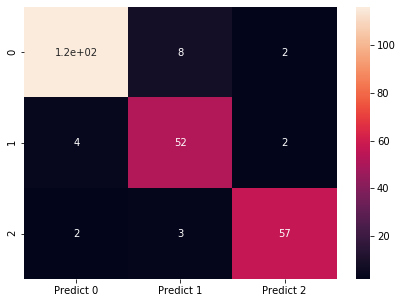

In [348]:
y_pred = svm.predict(X_test)
print(' ')
print('                Confusion Matrix ') 
cm=metrics.confusion_matrix(y_test,y_pred, labels=[0, 1, 2])

df_cm = pd.DataFrame(cm, index = [i for i in ["0","1","2"]], columns = [i for i in ["Predict 0","Predict 1","Predict 2"]])
df_cm
plt.figure(figsize = (7,5))
sns.heatmap(df_cm, annot=True)
plt.show()

In [349]:
print("                   Classification Report for SVM")
print('')
print(metrics.classification_report(y_test,y_pred, labels=[0,1,2]))

# The recall rate for 0,1,2 are all above 90%
# The precision & f1 score for predicting 1 is much less than the precision of 0 & 2

                   Classification Report for SVM

              precision    recall  f1-score   support

           0       0.95      0.92      0.94       126
           1       0.83      0.90      0.86        58
           2       0.93      0.92      0.93        62

    accuracy                           0.91       246
   macro avg       0.90      0.91      0.91       246
weighted avg       0.92      0.91      0.92       246



In [350]:
scores = []

svm = SVC(C=1000, break_ties=False, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma=0.01, kernel='rbf',
    max_iter=-1, probability=False, random_state=None, shrinking=True,
    tol=0.001, verbose=False)

kf = KFold(n_splits=5, shuffle=False)

for train_index, test_index in kf.split(X_pca,Y):
    X_train, X_test, y_train, y_test = X_pca[train_index], X_pca[test_index], Y.iloc[train_index], Y.iloc[test_index]
    svm.fit(X_train, y_train)
    scores.append(svm.score(X_test, y_test))

In [351]:
for i in range(0,5):
    print("The score of model no {0} is: \n{1:.2f}%\n".format(i+1,scores[i]*100))

print("And the average score of K-fold Cross validation is: {0:.2f}%".format(np.mean(scores)*100))

The score of model no 1 is: 
92.68%

The score of model no 2 is: 
92.68%

The score of model no 3 is: 
91.46%

The score of model no 4 is: 
87.80%

The score of model no 5 is: 
91.41%

And the average score of K-fold Cross validation is: 91.21%


In [355]:
# Initially the dataset had a lot of highly correlated independent variables and in addition to that,
# there were 41 missing values. I used this highly correlated variables to my advantage.
# I used it to predict the missing values (Only those which were predicted with high accuracy)
# Then I dropped the remaining NaN values. The dataset had a total 50% for car type, and roughly 25% for van & bus type respectively


# First I made a predictive model without any changes to the independent variables, using SVM algorithm.
# There was an accuracy score of 99%, with recall rate of 100% for car & van and bus had a recall rate of 97%


# Next, I removed the highly correlated independent variables inorder to avoid the multi-collinearity issue. Thereby,
# reducing the no of independent variables from 18 to 12. Then I followed
# the same steps to predict using the SVM algorithm I got an accuracy score of almost 97%
# The recall, precision and f1-score for car & bus were above 95%
# The recall, precisoin & f1-score for van is 95%, 92%, 93% respectively.
# The average accuracy found using K-fold cross validation is 96.47%


# Finally I performed the principle component analysis to reduce the dimensions. I found that 95% of the variance is
# explained by 7 components itself. Thus I transformed the data into 7 dimensions and trained the SVM model.
# I got an accuracy of 91.46%. The recall for all the vehicle types were in the range of 90-92%
# The precision & f1-score for predicting van is much less (around 85%) than for bus and car (both above 90%)
# The low score for van should be because of the fact that the model is imbalanced with car (50%) and the "van type" being the minority of all the vechicle types
# The average K-fold cross validation score was 91.21%


# The model with 12 independent variables had a accuracy score of 96%, however, After reducing the number of dimensions to 7
# with the help of PCA, I was to acheive an accuracy score of close to 92%

# Thus with reduction in dimensions and by saving a lot of computational time, the PCA algorithm is really useful.